# A. Fonctions globales de support pour l'analyse
>**Source des données :** https://www.kaggle.com/datasets/moussasacko/rakuten-france-multimodal-product-classification?resource=download

## 🚀A1.1 All imports

In [1]:
#////////////////////////////////////////////////////////////////
# # ALL imports
#////////////////////////////////////////////////////////////////

import os
import re
import string
import itertools


import pandas as pd
import numpy as np
import pickle

# graphs and images plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import cm
import plotly.graph_objects as go

from sklearn import svm
from sklearn import neighbors
from sklearn import preprocessing

from sklearn.linear_model import LogisticRegression, ElasticNetCV, LinearRegression, Lasso
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn.tree import DecisionTreeClassifier

from sklearn import ensemble
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, ConfusionMatrixDisplay, classification_report, mean_squared_error, f1_score, roc_curve, roc_auc_score, auc
from sklearn.metrics import precision_recall_fscore_support as score

from xgboost import plot_importance
import xgboost

# split and simulationss
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold,  GridSearchCV

# resampling
from imblearn.under_sampling import RandomUnderSampler, TomekLinks 
from imblearn.over_sampling import RandomOverSampler, SMOTE

from sklearn.feature_selection import VarianceThreshold, SelectKBest, SelectFromModel, f_regression, mutual_info_regression, RFE, RFECV


from nltk.corpus import stopwords, words
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize.regexp import RegexpTokenizer

import scikitplot as skplt
from scikitplot.metrics import plot_cumulative_gain 


# dim reduction libraries    
from sklearn.manifold import LocallyLinearEmbedding, Isomap, TSNE
from sklearn.decomposition import PCA

#from sklearn.feature_extraction.text import TfidfVectorizer
#from spacy.lang.fr.stop_words import STOP_WORDS as fr_stop
#from spacy.lang.en.stop_words import STOP_WORDS as en_stop
from wordcloud import STOPWORDS
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import PunktSentenceTokenizer, word_tokenize
from nltk.stem import WordNetLemmatizer


from PIL import Image

from functools import reduce


# to use MLFlow to reproduce experiments/runs/models
import mlflow


%matplotlib inline

## 🚀A1.2 Commmon helper functions 

In [2]:


# local
data_root_folder = "../data"
data_images_root_folder = "../data/images"


"""
# replaced by kaggle paths
data_root_folder = "/kaggle/input/rakuten-france-multimodal-product-classification"
data_images_root_folder = "/kaggle/input/rakuten-france-multimodal-product-classification/images/images"
"""

#/kaggle/input/rakuten-france-multimodal-product-classification/images
#/kaggle/input/rakuten-france-multimodal-product-classification/images/images/image_train


def get_df_missed_unique_values(df):
    if isinstance(df, pd.DataFrame):
        ret = {}
        for col in df.columns:
            n = df[col].isna().sum()
            n1 = df[col].unique()
            ret[col] = {
                    'manquantes': n,
                    'manquantes (%)': 100*n/df.shape[0],
                    'uniques': n1,
                    'unique (nombre)': len(n1),
                    'uniques (%)': 100*len(n1)/df.shape[0]
                    }
            
        return ret
    return {}


def get_df_basic_elements(df, infos_types= ['shape', 'head', 'tail', 'info', 'describe'], actions= ['return', 'print']):
    ret = {}
    if isinstance(df, pd.DataFrame):
        if 'shape' in infos_types:
            df_shape = df.shape
            if 'print' in  actions: 
                print("shape------------------------------------------------------")
                print(df_shape)
            if 'return' in actions:
                ret['shape'] = str(df_shape)
        if 'head' in infos_types:
            df_head = df.head()
            if 'print' in  actions: 
                print("head------------------------------------------------------")
                display(df_head)
            if 'return' in actions:
                ret['head'] = str(df_head)
        if 'tail' in infos_types:
            df_tail = df.tail()
            if 'print' in  actions: 
                print("tail------------------------------------------------------")
                display(df_tail)
            if 'return' in actions:
                ret['tail'] = str(df_tail)
        if 'info' in infos_types:
            df_info = df.info()
            if 'print' in  actions: 
                print("info------------------------------------------------------")
                display(df_info)
            if 'return' in actions:
                ret['info'] = str(df_info)
        if 'describe' in infos_types:
            df_describe = df.describe()
            if 'print' in  actions: 
                print("describe------------------------------------------------------")
                display(df_describe)
            if 'return' in actions:
                ret['describe'] = str(df_describe)
        
        if 'return' in actions:
            return {'data': ret}
    return {'data': ret}              
                

def get_excluded_words(file_path):
    data = pd.read_csv(file_path, sep='\s+' , header = None)
    return data


def isFileExist(fileFullPath):
    if fileFullPath is not None:
        if os.path.isfile(fileFullPath):
            if os.path.exists(fileFullPath):
                return True
            else:
                return False
        else:
            return False
    else:
        return False


def get_cat_codes_description(cat_codes_file):
    return pd.read_csv(f'{data_root_folder}/config/{cat_codes_file}', sep=';', quotechar="'", index_col=0)
    

def get_prod_cateroy_description_from_code(prod_code):
    """Récupérer la catégorie descrptive à partir de son code numérique par mappage

    Args:
        code (int): code numérique de la catégorie de produit
    """

    ret_code = 0
    ret_df = get_cat_codes_description('category_code_desription.csv')
  
    #if isinstance(prod_code, int):
    ret_code = ret_df.loc[prod_code, 'prdtypelabelguess']
    return ret_code

def save_model_to_pickle(estimator_name, estimator ):
    # save best model to a pickle file
    if (estimator_name != '') and (estimator != None):
        with open(f'{data_root_folder}/{estimator_name}.pkl', 'wb') as f:
            pickle.dump(estimator, f)
            

def load_model_from_pickle(pickle_file_path):
    # load saved model from pickle file
    if isFileExist(pickle_file_path):
        with open(pickle_file_path) as f:
            return pickle.load(f)  

<>:79: SyntaxWarning: invalid escape sequence '\s'
<>:79: SyntaxWarning: invalid escape sequence '\s'
C:\Users\abdel\AppData\Local\Temp\ipykernel_16648\855423932.py:79: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv(file_path, sep='\s+' , header = None)


## A1.3 Data exploration & preprocessing

### 🚀A1.3.1 Define **data** by merging X_train with Y_train

In [3]:
def load_data_from_csvs():
    X_train=pd.read_csv(f'{data_root_folder}/X_train_update.csv', index_col=0)
    #X_test=pd.read_csv(f'{data_root_folder}/X_test_update.csv', index_col=0)
    Y_train=pd.read_csv(f'{data_root_folder}/Y_train_CVw08PX.csv', index_col=0)
    return pd.concat([X_train,Y_train], axis=1 )


data = load_data_from_csvs()
display(get_df_basic_elements(df=data, infos_types=['shape', 'head', 'tail', 'info'], actions=['print'] ))


shape------------------------------------------------------
(84916, 5)
head------------------------------------------------------


,designation,description,productid,imageid,prdtypecode
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,NaN,436067568,1008141237,2280
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,NaN,50418756,457047496,1280
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705


tail------------------------------------------------------


,designation,description,productid,imageid,prdtypecode
84911,The Sims [ Import Anglais ],NaN,206719094,941495734,40
84912,Kit piscine acier NEVADA déco pierre Ø 3.50m x...,<b>Description complète :</b><br />Kit piscine...,3065095706,1188462883,2583
84913,Journal Officiel De La Republique Francaise N°...,NaN,440707564,1009325617,2280
84914,Table Basse Bois De Récupération Massif Base B...,<p>Cette table basse a un design unique et con...,3942400296,1267353403,1560
84915,Gomme De Collection 2 Gommes Pinguin Glace Ver...,NaN,57203227,684671297,2522


<class 'pandas.core.frame.DataFrame'>
Index: 84916 entries, 0 to 84915
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   designation  84916 non-null  object
 1   description  55116 non-null  object
 2   productid    84916 non-null  int64 
 3   imageid      84916 non-null  int64 
 4   prdtypecode  84916 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 3.9+ MB
info------------------------------------------------------


None

{'data': {}}

* Columns types are relevant
* Data size is relevant for Machine Learning
* For the suggested X_test, Y_test is missing, the test data will be generated from the train data 

### A1.3.2 Check missing images ?

In [41]:
def check_missing_images(data):
    """Vérifier que toutes les images référencées par leurs id avec le id du produit que chacune présente, existent bien 

    Args:
        data (pd.DataFrame): Dataset avant tout traitement ou pré-processing
    
    
    Retourne : True ou False (dès qu'une 1ère image est inexistante)
    """
    notfound = False
    if isinstance(data, pd.DataFrame):
        for index, row in data.iterrows():
            imgid = row['imageid']
            prdid = row['productid']
            try:
                notfound = not isFileExist(f'{data_images_root_folder}/image_train/image_{imgid}_product_{prdid}.jpg')
                # mpimg.imread(f'{data_images_root_folder}/image_train/image_{imgid}_product_{prdid}.jpg') # pas besoinde lire
            except FileNotFoundError as error:  
                notfound=True
                print('Image not found', error)  
        if not notfound:
            print('No image is missing')

    return notfound


print(f"Retour de vérification des images: {check_missing_images(data=data) == False}")
        

C:\Users\abdel\AppData\Local\Temp\ipykernel_22316\1851078127.py:78: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv(file_path, sep='\s+' , header = None)


KeyboardInterrupt: 

### A1.3.3 Valeurs dupliquées

>35% of 'description' column values are missing & 60% of 'description' are distinct

#### 🚀A1.3.3.1 Helper functions 

In [3]:
def get_duplicated_description(data, threshold=30):
    data_descnotna = data[-data.description.isna()]
    data_desc_dup = data_descnotna[data_descnotna.duplicated(['description'])].groupby('description').agg(count=('prdtypecode', 'size'), 
                                                                                                        prdtypecodes=('prdtypecode',lambda x: list(x.unique())), 
                                                                                                        designations=('designation',lambda x: list(x.unique())),
                                                                                                        designations_count=('designation', lambda x: len(list(x.unique())))).sort_values(by=['count'], ascending=False).query('count>' + str(threshold))
    
    return data_desc_dup, data_desc_dup.index


def get_duplicated_designation(data):
    if isinstance(data, pd.DataFrame):
        data_descnotna=data[-data.designation.isna()]
        data_desig_dup=data_descnotna[data_descnotna.duplicated(['designation'])].groupby('designation').agg(count=('prdtypecode', 'size'),
                        prdtypecodes=('prdtypecode',lambda x: list(x.unique())), prdtypecodes_count = ('prdtypecode',lambda x: len(x.unique()))).sort_values(by=['count'], ascending=False).query('count>0')
        return pd.DataFrame (data_desig_dup)
    return None


def process_duplicates(data, proccess_all=False, threshold=30):
    """Traiter les doublons des deux variables 'designation' et 'description'ArithmeticError

    Args:
        data (pd.DataFrame): le dataset avant traitement des doublons
        proccess_all (bool, optional): indiquer si on doit traiter l'ensemble des doublons 'description'. Defaults to False.
        threshold : Seuil min des doublons trouvés. Par défaut, 30

    Returns:
        pd.DatFrame: Un dataframe traité
    """
    if isinstance(data, pd.DataFrame):
        # desctiption
        if proccess_all == True:
            list_desc = get_duplicated_description(data, threshold)[1]
            print("list_desc:", list_desc)
            if len(list_desc) > 0:
                for exp in list_desc:
                    data['description'] = data['description'].apply(lambda x: '' if (exp in str(x)) else x )
        else:
            # replace these expressions par '' 
            # replace all '...Attention !!' with empty string
            exp = "<br>Attention !!! Ce produit est un import"
            data['description'] = data['description'].apply(lambda x: '' if (exp in str(x)) else x)
            exp = "<br />"
            data['description'] = data['description'].apply(lambda x: '' if (str(x)==exp) else x)


        #designation:
        # suppression de toutes les ligne dupliquées en ne gardant qu'1 pour chaque designation
        data = data.drop_duplicates(subset=['designation'], keep='first')

        return data
    
        

#### 🚀A1.3.3.2 Traiter les doublons dans les 2 colonnes **designation** et **description** 

> La commande ci-dessous suffit pour traiter les doublons, on peut passer à la section **B.** directement une fois les doulons traités

In [5]:
data = process_duplicates(data=data, proccess_all=True, threshold=30)
#print("New data shape:", data.shape)
print("If OK, go to B. section to clean data")

list_desc: Index(['<br>Attention !!! Ce produit est un import  si les informations 'langues' et 'sous-titres' n'apparaissent pas sur cette fiche produit c'est que l'éditeur ne nous les a pas fournies. Néanmoins dans la grande majorité de ces cas il n'existe ni langue ni sous titres en français sur ces imports.',
       'Taille: En format A5 (144 cm x 21 cm) Caractéistique: -Excellente durabilité avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualitévous pouvez y érire facilement',
       'Taille: En format A5 (144 cm x 21 cm) Caracteristique: -Excellente durabilite avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualite:  ecrire facilement sur et assez epaisse.',
       'Taille: En format A5 (144 cm x 21 cm) Caract?istique: -Excellente durabilit?avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualit?  ?rire facilement sur et assez ?aisse.',
  

In [26]:
data.shape

(82265, 5)

#### A1.3.3.3 Dans la colonne **description**

In [14]:

def get_duplicated_description(data, threshold):
    data_descnotna = data[-data.description.isna()]
    data_desc_dup = data_descnotna[data_descnotna.duplicated(['description'])].groupby('description').agg(count=('prdtypecode', 'size'), 
                                                                                                        prdtypecodes=('prdtypecode',lambda x: list(x.unique())), 
                                                                                                        designations=('designation',lambda x: list(x.unique())),
                                                                                                        designations_count=('designation', lambda x: len(list(x.unique())))).sort_values(by=['count'], ascending=False).query('count>' + str(threshold))
    
    return data_desc_dup, data_desc_dup.index


dup_desc, dup_desc_index = get_duplicated_description(data, 30)
print('Liste des descriptions en doublons:\n')
display(dup_desc_index.tolist())
display( dup_desc )
print ("data.shape!", data.shape)


Liste des descriptions en doublons:



['']

,count,prdtypecodes,designations,designations_count
description,,,,
,82264,"[2280, 50, 1280, 2705, 10, 2522, 2582, 1560, 1...",[Journal Des Arts (Le) N° 133 Du 28/09/2001 - ...,82264


data.shape! (82265, 5)


In [10]:
produit_multi_code = 'Lampe De Lecture Rechargeable Led Lampe' in data['designation']
print(produit_multi_code)

False


#### A1.3.3.4 Traitement des duplications dans 'description'

- Most of duplicated values are related to one type, which sets a corrolation between that could be useful in predicting the label
- The duplicated value '\<br />' can be deleted as it doesn't bring any semantic
- The duplicated value '...Attention !!! Ce produit est un import si les informations 'langues' et 'sous-titres'...' can be deleted as well.
- The product category code **2583** has 8 duplicated descriptins ranging from 33 to 56, which may explain in a graphics below why it has the **most duplicated desciption field**

In [5]:
# replace all '...Attention !!' with empty string
exp = "<br>Attention !!! Ce produit est un import"
data['description'] = data['description'].apply(lambda x: '' if (exp in str(x)) else x)
exp = "<br />"
data['description'] = data['description'].apply(lambda x: '' if (str(x)==exp) else x)
  
display( get_duplicated_description(data, 30) )

# Other duplicates (to decide later ?)
exp_list_2583 = ['Piscine hors-sol en acier ronde Fidji de la marque Gré Indispensable pour passer des vacances entre amis dans la fraîcheur de l&#39;eau cette piscine en acier ronde Fidji vous offre un espace de nage et de jeux d&#39;eau pour tous les goûts.',
            'Kit de piscine hors-sol ronde en acier Bora Bora de la marque Gré Installez une piscine hors-sol dans le jardin et faites vous plaisir avec la fraîcheur de l&#39;eau pour des moments de détente avec vos proches.',
            'Faites de la place dans le jardin à la piscine hors-sol Sicilia de GréLe kit de piscine hors sol en acier Sicilia ronde de la marque Gré vous plongera dans l&#39;ambiance de l&#39;été et du farniente avec son bel espace de nage.',
            'Kit complet piscine ronde en acier Wet de la marque GréSautez dans l&#39;eau pour vous rafraîchir ! Avec ce kit complet pour piscine hors-sol en acier vous pourrez passer de longues heures à vous baigner.',
            'Piscine hors-sol ovale en acier blanc Wet de la marque Gré.Cette gamme de piscines ovales est idéale pour avoir un grand espace de nage à domicile pour rafraîchir toute la famille cet été !La piscine en acier ovale Wet c&#39;est :? Une structure en acier galvanisé d&#39;une épaisseur de 45/100 de couleur blanc.',
            'Piscine hors-sol ovale en acier blanc Fidji de la marque Gré.La piscine en acier ovale Fidji c&#39;est :? Une structure en acier galvanisé d&#39;une épaisseur de 45/100 de couleur blanc.',
            'Piscine hors-sol acier blanc Haïti ovale de la marque Gré.Cette gamme de piscines ovales en acier vous offrira un grand espace de nage et s&#39;intégrera harmonieusement dans votre jardin avec son coloris blanc. La piscine en acier ovale Haïti c&#39;est :? Une structure en acier galvanisé d&#39;une épaisseur de 45/100 de couleur blanc.',
            'La gamme de piscines hors sols Fusion de la marque Gré offre un design unique et de généreuses dimensions. Cette gamme de piscines ovales est idéale pour avoir un grand espace de nage à domicile pour rafraîchir toute la famille cet été !La piscine en acier ovale Fusion c&#39;est :?',
            'Lampe 3D - 7 couleurs interchangeable au choix Avec Télécommande inclus. Figurine Lampe. Lampe de chevet -Lampe d&#39;ambiance Figurines - Lampe enfants - Lampe Noêl - Veilleuse'
            ]

# suppression de toutes les ligne dupliquées en ne gardant qu'1 pour chaque designation
# data = data.drop_duplicates(subset=['description'], keep='first')

print ("data.shape!", data.shape)

,count,prdtypecodes,designations,designations_count
description,,,,
,332,"[40, 1940, 2522, 1301]",[Zumba Fitness : Rush (Jeu Kinect) [Import All...,331
Taille: En format A5 (144 cm x 21 cm) Caractéistique: -Excellente durabilité avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualitévous pouvez y érire facilement,231,[2522],[Carnet De Notes Bloc-Notes Cahier Bleu Nature...,230
Taille: En format A5 (144 cm x 21 cm) Caracteristique: -Excellente durabilite avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualite: ecrire facilement sur et assez epaisse.,188,[2522],[Carnet De Notes Bloc-Notes Cahier Que Mon Clu...,169
Taille: En format A5 (144 cm x 21 cm) Caract?istique: -Excellente durabilit?avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualit? ?rire facilement sur et assez ?aisse.,161,[2522],[Carnet De Notes Bloc-Notes Cahierla Musique T...,161
Taille: En format A5 (144 cm x 21 cm) Caractéristique: -Excellente durabilit?avec couverture solide design. 96 pages jaune pale (recto et verso) -Texture de papier de haute qualit? écrire facilement sur et assez épaisse.,88,[2522],[Carnet De Notes Bloc-Notes Cahier Avoine Swee...,88
Piscine hors-sol en acier ronde Fidji de la marque Gré Indispensable pour passer des vacances entre amis dans la fraîcheur de l&#39;eau cette piscine en acier ronde Fidji vous offre un espace de nage et de jeux d&#39;eau pour tous les goûts. Conçue avec une structure en tôle laminée à froid et traitée par galvanisation la piscine hors-sol Gré vous assure une forte résistance dans le temps. Pour la baignade et le confort elle est habillée d&#39;un liner d&#39;une épaisseur de 30/100 traité anti-UV pour prévenir son vieillissement prématuré. La piscine hors-sol acier ronde Fidji est équipée d&#39;un système de filtration à sable (inclus) complet et d&#39;un skimmer pour vous garantir une eau claire et propre tout au long de la saison de baignade. Pour accéder facilement et en toute sécurité au bassin elle est livrée avec une échelle 2 x 3 marches. L&#39;équipement de la piscine en acier ronde Fidji : - Structure en acier avec margelles et poteaux verticaux - Système de filtration 3 m³/h vannes 5 voies cuve de Ø 30 cm 23 kg de sables (silex) puissance 125 W. - Liner en PVC bleu 30/100 - Skimmer - Échelle de sécurité 2 x 3 marches Les caractéristiques selon le modèle de piscine : Piscine ronde Fidji Ø 370 cm - Dimensions extérieures (Ø x h) : 370 x 122 cm - Dimensions intérieures (Ø x h) : Ø 350 x 120 cm - Volume d&#39;eau : 1010 m3 - Espace nécessaire (L x l) : 400 x 400 cm Piscine ronde Fidji Ø 480 cm - Dimensions extérieures (Ø x h) : Ø 480 x 122 cm - Dimensions intérieures (Ø x h) : Ø 460 x 120 cm - Volume d&#39;eau : 1745 m3 - Espace nécessaire (L x l) : 500 x 500 cm Piscine ronde Fidji Ø 570 cm - Dimensions extérieures (Ø x h) : Ø 570 x 122 cm - Dimensions intérieures (Ø x h) : Ø 550 X 120 cm - Volume d&#39;eau : 2494 m3 - Espace nécessaire (L x l) : 600 x 600 cm,56,[2583],[Kit piscine acier blanc Gré Fidji ronde 260 x...,56
Kit de piscine hors-sol ronde en acier Bora Bora de la marque Gré Installez une piscine hors-sol dans le jardin et faites vous plaisir avec la fraîcheur de l&#39;eau pour des moments de détente avec vos proches. Ce kit de piscine est complet et vous permettra de profiter au plus vite de votre installation. La piscine hors-sol Bora Bora est vendue avec un équipement qui comprend :- une structure en acier galvanisé 45/100 avec margelles et poteaux- un liner 30/100 de couleur bleue en PVC- un épurateur à cartouche 38 m³/h puissance de 70 W- un skimmer de couleur blanche- et une échelle 2 x 3 marches. Le montage de la piscine hors-sol ronde en acier Bora Bora Gré est estimé à 2 h pour 2/3 personnes.Les différentes dimensions disponibles pour la piscine hors-sol Bora Bora :La piscine Bora Bora Ø 320 m- Dimensions extérieures (Ø x h) : 320 x 122 cm- Di

data.shape! (84916, 5)


#### A1.3.3.5 Dans la colonne 'designation'

In [41]:
def get_duplicated_designation(data):
    data_descnotna=data[-data.designation.isna()]
    data_desig_dup=data_descnotna[data_descnotna.duplicated(['designation'])].groupby('designation').agg(count=('prdtypecode', 'size'),
                    prdtypecodes=('prdtypecode',lambda x: list(x.unique())), prdtypecodes_count = ('prdtypecode',lambda x: len(x.unique()))).sort_values(by=['count'], ascending=False).query('count>0')
    return pd.DataFrame (data_desig_dup)

dupl_desig = get_duplicated_designation(data=data)
display(dupl_desig)
print("Nbre de duplications tout prdtypecodes compris :")
print(dupl_desig['count'] * dupl_desig['prdtypecodes_count'])

print("///////////////////////////////////////////////////////////")

,count,prdtypecodes,prdtypecodes_count
designation,,,


Nbre de duplications tout prdtypecodes compris :
Series([], dtype: int64)
///////////////////////////////////////////////////////////


#### A1.3.3.6 Traitement des duplications dans la colonne **desigation**

>- 1422 lignes possèdent au moins une diplication de la colonne **designation**, elles doivent être réduite à une seule
>- Les duplications vont de 1 jusqu'à **75** pour le code **2060**

In [42]:

# suppression de toutes les ligne dupliquées en ne gardant qu'1 pour chaque designation
data = data.drop_duplicates(subset=['designation'], keep='first')

display(get_duplicated_designation(data=data))
print(data.shape)
    

,count,prdtypecodes,prdtypecodes_count
designation,,,


(82265, 5)


### A1.3.4 Distributions avant cleaning

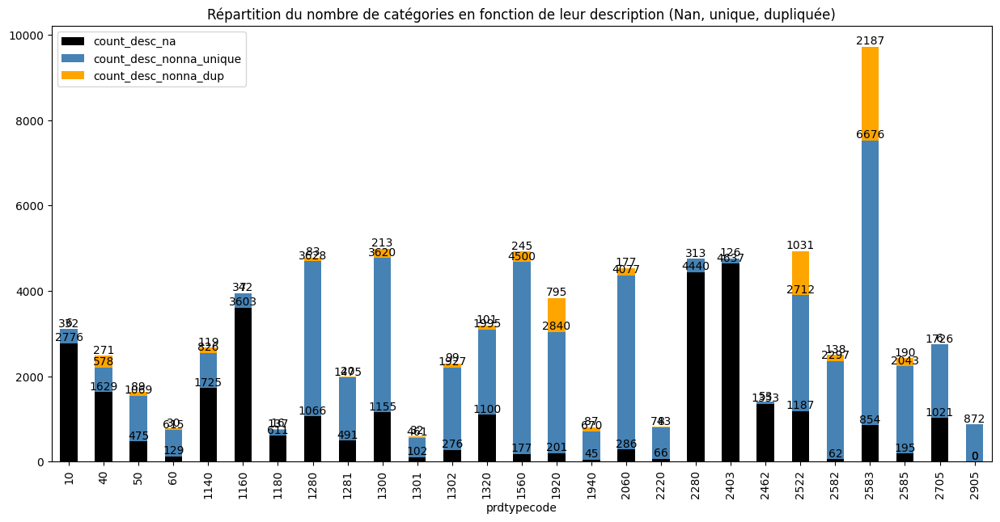

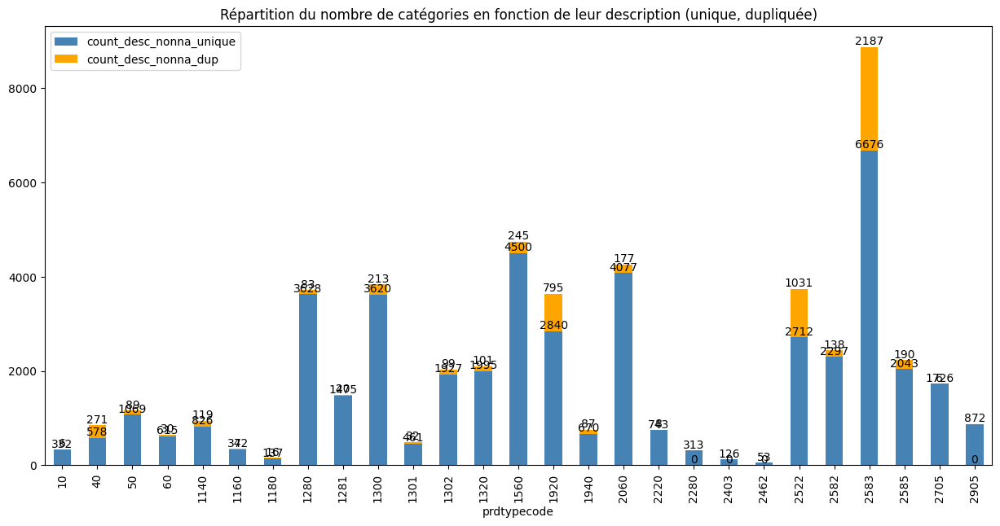

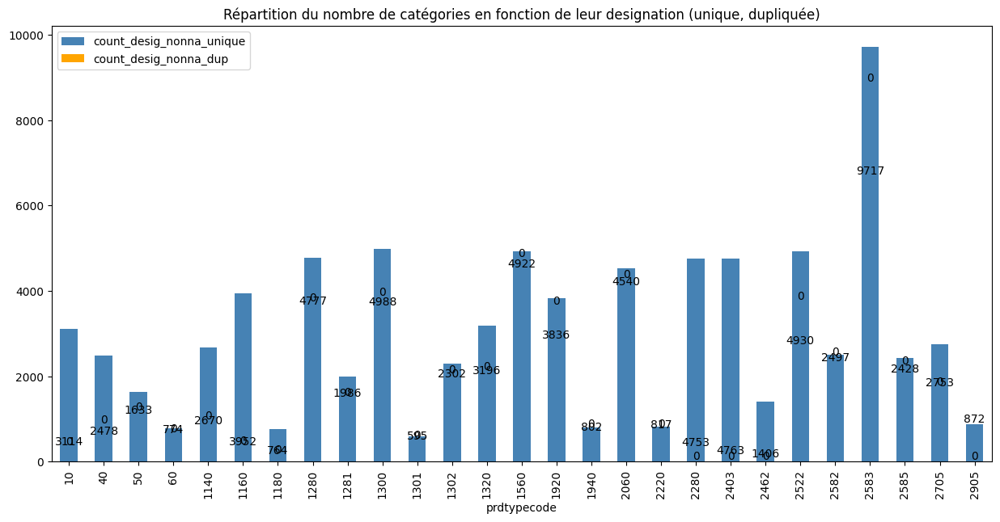

In [59]:

data_byprdtype_na=data.groupby('prdtypecode', group_keys=True).agg(
    count_desc_na=('description',lambda x: x.isna().sum()), 
    count_desc_nonna_unique=('description',lambda x: (x[x.notna()].unique()).size), 
    count_desc_nonna_dup=('description',lambda x: x[x.notna()].duplicated().sum()))

#display(data_byprdtype_na) 

ax1=data_byprdtype_na.plot.bar(stacked=True, color=['black', 'steelblue', 'orange'], figsize=(15, 7))
ax1.bar_label(ax1.containers[0], labels=data_byprdtype_na['count_desc_na'])
ax1.bar_label(ax1.containers[1], labels=data_byprdtype_na['count_desc_nonna_unique'])
ax1.bar_label(ax1.containers[2], labels=data_byprdtype_na['count_desc_nonna_dup'])
plt.title("Répartition du nombre de catégories en fonction de leur description (Nan, unique, dupliquée)")
plt.show();

data_byprdtype_na_1=data.groupby('prdtypecode', group_keys=True).agg(
    count_desc_nonna_unique=('description',lambda x: (x[x.notna()].unique()).size), 
    count_desc_nonna_dup=('description',lambda x: x[x.notna()].duplicated().sum()))

ax2=data_byprdtype_na_1.plot.bar(stacked=True, color=['steelblue', 'orange'], figsize=(15, 7))
ax2.bar_label(ax2.containers[0], labels=data_byprdtype_na_1['count_desc_nonna_unique'])
ax2.bar_label(ax2.containers[1], labels=data_byprdtype_na_1['count_desc_nonna_dup'])
plt.title("Répartition du nombre de catégories en fonction de leur description (unique, dupliquée)")
plt.show();


data_byprdtype_na_2=data.groupby('prdtypecode', group_keys=True).agg(
    count_desig_nonna_unique=('designation',lambda x: (x[x.notna()].unique()).size), 
    count_desig_nonna_dup=('designation',lambda x: x[x.notna()].duplicated().sum()))

ax3=data_byprdtype_na_2.plot.bar(stacked=True, color=['steelblue', 'orange'], figsize=(15, 7))
ax3.bar_label(ax2.containers[0], labels=data_byprdtype_na_2['count_desig_nonna_unique'])
ax3.bar_label(ax2.containers[1], labels=data_byprdtype_na_2['count_desig_nonna_dup'])
plt.title("Répartition du nombre de catégories en fonction de leur designation (unique, dupliquée)")

plt.show();




- **Aucun doublon dans designation; elles ont été toutes réduites à 1 seule designation**
- Product types are not evenly distributed, 2583 is an outlier 
- Need to rebalance the data, by : 
    * For types with highest counts, deleting rows with description = NA values & replacing duplicates
    * Some product types have small amount of relevant 'description', for those a strategy might be relying on the 'designation'
    * Then rebalance the rest following guidelines [here](https://medium.com/@dlikhitha99/all-methods-for-balancing-imbalanced-data-decfe1f4048d)




### B2 Data clean

#### 🚀B2.1 helper functions 

In [4]:

def get_data_to_ignore():
    return set(get_excluded_words(f'{data_root_folder}/config/excluded_words.txt')[0])


def preprocessor_func(text):
    """preprocess words in CountVectorizer call
        takeoff all digits and underscore
    """
    text = text.lower()
    # text = re.sub(r"\d_", '', text)
    text = re.sub(r"[\d_]^[a-zA-Z](.)\1{3,}", '', text)
    return text


def camel_split(s):
    if s=='' :return s
    result = [s[0]] 
    for char in s[1:]:
        if char.isupper():
            result.extend([' ', char])
        else:
            result.append(char)
    return ''.join(result)

def clean_text_1(c):
    to_ignore = get_data_to_ignore()
    c= re.sub(r'.*Attention !!! Ce produit est un import.*', '', c)
    c= re.sub(re.compile(r'\[Import Allemand\]'), '', c)
    c= re.sub(r'<.*?>', ' ', c)
    #c = camel_split(c)
    c = c.lower()
    # c= re.sub(re.compile(r'\b(?:{})\b'.format('|'.join(map(re.escape, nlpfr.Defaults.stop_words)))), '', c)
    c= re.sub(re.compile(r'\b(?:{})\b'.format('|'.join(map(re.escape, stopwords.words('french'))))), '', c)
    c= re.sub('[%s]' % re.escape(string.punctuation), '', c)
    c= re.sub(re.compile(r'\b(?:{})\b'.format('|'.join(map(re.escape, to_ignore)))), '', c)
    c= re.sub(r'\d', '', c)
    c=' '.join([word for word in c.split() if len(word) >=3]) # words with length at least 3
    #ignored as takes time consuming
    #c=' '.join([token.lemma_ for token in list(nlpfr(c)) if (token.is_stop==False)])
    return c

def clean_data(data, cleaner=clean_text_1):
    data_cleaned = data[['designation','description','prdtypecode']].fillna('')
    txt_data_origin=data_cleaned["designation"].str.cat(data_cleaned["description"], sep = " ")
    data['desi_desc'] = txt_data_origin.apply(lambda x: cleaner(x))
    return data.fillna('')
    #return data_cleaned.drop(['designation','description'], axis=1)
    

The goal of following routine is to : 

* Identifiy to what extent the 'designation' & 'description' content are capable to relate to a product type
* What kind of data cleaning should be carried out to make text data the most relevant
* Determine the semantic behind the product type code by displaying random pictues and top keywords for each product type code, it would help in better human interpretation of results during the model experimentation.


#### 🚀 B2.2 Clean data

In [7]:
load_cleanded_data_from_picke = True

if load_cleanded_data_from_picke == True:
    print("Reading from pickle file " + f"{data_root_folder}/cleaned_data.pkl ...")
    #with open(f"{data_root_folder}/cleaned_data.pkl", 'rb') as f:
        #pickle.load(file=f)
    data_cleaned = pd.read_pickle(f"{data_root_folder}/cleaned_data.pkl")
        
else:
    # retun cleaned data
    print('Cleanning...')
    data_cleaned = clean_data(data=data)
    # save cleaned data to a pickle file for serialisation
    print("Saving to pickle 'cleaned_data.pkl'...")
    data_cleaned.to_pickle(f"{data_root_folder}/cleaned_data.pkl")
    #with open(f"{data_root_folder}/cleaned_data.pkl", 'wb') as f:
    #    pickle.dump(data_cleaned, f, protocol=pickle.HIGHEST_PROTOCOL)
        
        
print(type(data_cleaned))
print(data_cleaned.shape)
display(data_cleaned)


Cleanning...
Saving to pickle 'cleaned_data.pkl'...
<class 'pandas.core.frame.DataFrame'>
(82265, 6)


,designation,description,productid,imageid,prdtypecode,desi_desc
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,,3804725264,1263597046,10,olivia personalisiertes notizbuch seiten punkt...
1,Journal Des Arts (Le) N° 133 Du 28/09/2001 - L...,,436067568,1008141237,2280,journal arts art marche salon art asiatique ba...
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50,stylet ergonomique gamepad nintendo wii speedl...
3,Peluche Donald - Europe - Disneyland 2000 (Mar...,,50418756,457047496,1280,peluche donald europe disneyland marionnette d...
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705,guerre tuques luc ideacute grandeur veut organ...
...,...,...,...,...,...,...
84911,The Sims [ Import Anglais ],,206719094,941495734,40,the sims
84912,Kit piscine acier NEVADA déco pierre Ø 3.50m x...,,3065095706,1188462883,2583,kit piscine acier nevada déco pierre
84913,Journal Officiel De La Republique Francaise N°...,,440707564,1009325617,2280,journal officiel republique changement adresse...
84914,Table Basse Bois De Récupération Massif Base B...,<p>Cette table basse a un design unique et con...,3942400296,1267353403,1560,table basse bois récupération massif base blan...


In [13]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

X_tfidf = data_cleaned['desi_desc']
y_tfidf = data_cleaned['prdtypecode']

# split
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(X_tfidf, y_tfidf, test_size=.2, random_state=0)


# Créer un vectorisateur 
vec_tfidf = TfidfVectorizer()

# Mettre à jour la valeur de X_train_tfidf et X_test_tfidf
X_train_tfidf = vec_tfidf.fit_transform(X_train_tfidf)
X_test_tfidf = vec_tfidf.transform(X_test_tfidf)

# define modeland fit/predict
model = neighbors.KNeighborsClassifier(n_neighbors=100, n_jobs=-1)
model.fit(X_train_tfidf, y_train_tfidf)
y_pred_test_tfidf = model.predict(X_test_tfidf)
y_pred_train_tfidf = model.predict(X_train_tfidf)

# get classif infos report and CM
print( classification_report(y_true=y_test_tfidf, y_pred=y_pred_test_tfidf) )
conf_matrix_tfidf = pd.crosstab(y_test_tfidf, y_pred_test_tfidf, rownames=['Classe réelle'], colnames=['Classe prédite'])
display(conf_matrix_tfidf)



# scores
train_r2_scores = []
test_r2_scores = []
train_r2_score = model.score(X_train_tfidf, y_train_tfidf)
test_r2_score = model.score(X_test_tfidf, y_test_tfidf)
train_r2_scores.append(train_r2_score)
test_r2_scores.append(test_r2_score)
print("train_r2_score = ", train_r2_score)
print("test_r2_score =", test_r2_score)

# metrics
train_f1_score = []
test_f1_score = []
precision, recall, fscore, support = score(y_train_tfidf, y_pred_train_tfidf)
train_f1_score.append(fscore)
print(f'train_f1_score = {train_f1_score}')
precision, recall, fscore, support = score(y_test_tfidf, y_pred_test_tfidf)
test_f1_score.append(fscore)
print(f'test_f1_score = {test_f1_score}')


model.predict()

              precision    recall  f1-score   support

          10       0.60      0.03      0.05       599
          40       0.47      0.23      0.31       485
          50       0.83      0.29      0.43       363
          60       0.85      0.74      0.79       159
        1140       0.62      0.32      0.42       477
        1160       0.90      0.36      0.52       760
        1180       0.76      0.21      0.33       152
        1280       0.67      0.19      0.30       947
        1281       0.70      0.11      0.19       427
        1300       0.87      0.41      0.56      1017
        1301       0.99      0.57      0.73       122
        1302       0.83      0.33      0.47       494
        1320       0.93      0.30      0.45       663
        1560       0.88      0.39      0.54       980
        1920       0.91      0.72      0.81       810
        1940       0.98      0.28      0.44       148
        2060       0.85      0.37      0.52       935
        2220       0.98    

Classe prédite,10,40,50,60,1140,1160,1180,1280,1281,1300,1301,1302,1320,1560,1920,1940,2060,2220,2280,2403,2462,2522,2582,2583,2585,2705,2905
Classe réelle,,,,,,,,,,,,,,,,,,,,,,,,,,,
10,15,5,0,1,2,2,1,0,0,0,0,0,0,0,0,0,0,0,6,48,1,1,0,1,1,515,0
40,0,110,4,4,12,1,2,0,0,1,0,0,0,0,0,0,1,0,1,22,16,0,0,1,0,307,3
50,0,20,107,6,4,1,0,0,1,1,0,4,0,0,0,0,0,0,0,6,32,0,0,0,0,181,0
60,0,7,4,117,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,10,0,0,0,0,19,0
1140,0,11,3,1,151,6,1,2,1,0,0,0,1,0,0,0,0,0,2,17,2,0,0,0,0,279,0
1160,0,7,0,2,9,276,1,0,0,0,0,0,0,0,0,0,0,0,1,14,0,0,0,0,0,450,0
1180,0,3,0,0,5,1,32,2,1,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,104,0
1280,0,8,2,0,19,2,1,181,17,57,0,17,0,1,0,0,1,0,1,25,1,0,0,1,0,613,0
1281,3,5,0,2,6,6,0,43,48,1,0,4,0,1,0,0,1,0,2,22,3,0,0,0,0,280,0


train_r2_score =  0.493268704795478
test_r2_score = 0.38248343767094145
train_f1_score = [array([0.06290756, 0.4738292 , 0.5574124 , 0.80628272, 0.56404299,
       0.56106785, 0.48557692, 0.45028355, 0.28140162, 0.67284435,
       0.77535302, 0.64566929, 0.57308329, 0.63328375, 0.85734767,
       0.53139013, 0.61114196, 0.50624291, 0.22005445, 0.67401691,
       0.64820513, 0.63820998, 0.46883165, 0.85263619, 0.42514011,
       0.13542949, 0.36469222])]
test_f1_score = [array([0.04807692, 0.30640669, 0.43495935, 0.78787879, 0.41944444,
       0.51782364, 0.32989691, 0.29769737, 0.19354839, 0.56266667,
       0.7253886 , 0.46802326, 0.45205479, 0.54096045, 0.80853994,
       0.43979058, 0.51895911, 0.42718447, 0.14299153, 0.36327145,
       0.55813953, 0.58226037, 0.3639399 , 0.78197398, 0.3968    ,
       0.107538  , 0.26      ])]


# C. Vectorize and generate words matrices by code category

## 🚀C1. helper functions

In [5]:


def analyse_text_images(df, nsamples=20, max_features=20, plot_images=False ):
  """Cette fonction parcourt tout le dataset fourni afin de faire une analyse des colonnes 'designation', 'description' 
  et affichier les images associées pour chaque designation

  Args:
      df (DataFrame) : DataFrame correspondant au dataset already cleaned before
      nsamples (int, optional): Nombre de lignes à sélectionner pour l'extraction des mots/images. Defaults to 20.
      max_features (int, optional): Nombre de mots max à extraire. Defaults to 20.
      plot_images (bool, optional): Afficher ou non les images (par défaut non). Defaults to False.
  Returns:
    code_words_count_dataframes : matrix words counts by code as dataframe
    all_feaures : all feature as dataframe limited to max words max_features specified
    summary_df : summary of founded words and comparaison
  """

  if not isinstance(df, pd.DataFrame):
    return


  bytypecode = df.groupby('prdtypecode')
  
  nsamples=nsamples   # first samples number taken for each category code
  max_features=max_features  # max features (words) choosen for each category code
  # N of images rows/cols to plot
  n_images_cols =  5 # N per row
  n_images_rows= 1 + (nsamples // n_images_cols) # max n_images_cols (4) images per row


  print("---N of samples for each code:", str(nsamples), "---Max extracted features (words): ", str(max_features) , "---")
  print("-----------------------------------------------------------------------------------------------------")

    
  to_ignore = set(get_excluded_words(f'{data_root_folder}/config/excluded_words.txt')[0])
  # print('to_ignore=', to_ignore)    
  my_stopwords = set(STOPWORDS).union(to_ignore).union(stopwords.words('french')).union(stopwords.words('english')).union(stopwords.words('german'))
  final_stopwords_list =  list(my_stopwords)  ### list(fr_stop) + list(en_stop) + list(my_stopwords)

  # ajouter un preprocessor pour enlever tout ce qui est numérique
  coun_vect1 = CountVectorizer(lowercase=True, stop_words=final_stopwords_list, max_features=max_features, preprocessor=preprocessor_func)
  coun_vect2 = CountVectorizer(lowercase=True, stop_words=final_stopwords_list, max_features=max_features, preprocessor=preprocessor_func)
  # used only for 'description'
  coun_vect3 = CountVectorizer(lowercase=True, stop_words=final_stopwords_list, max_features=max_features, preprocessor=preprocessor_func) 

  all_feaures = pd.DataFrame({'prdtypecode': 0, 'words': '', 'words_count': 0 }, index=[0])
  summary_df =  pd.DataFrame( { 'set_designation': [],  'n_designation': [],  
                    'set_description': [],  'n_description': [], 
                      'set_designation_description': [], 'n_designation_description': [], 
                      'set_intersection': [], 'n_set_intersection': [],
                        'set_intersection_1': [], 'n_set_intersection_1': [],
                              'set_intersection_2': [], 'n_set_intersection_2': []}
                            )
  # define add to a list of DataFrames for code_words_count
  code_words_count_dataframes = []
      

  for code, frame in bytypecode:
      #print(f"First {nsamples} entries for type {code!r}")  
      frame_samples=frame.head(nsamples)
      #display(frame_samples[['designation', 'description', 'prdtypecode']])

      if plot_images==True:
        fig = plt.figure(figsize=(50, 10*(nsamples // 20))) 
        #fig, axs = plt.subplots(1, nsamples, figsize=(50, 30))
        for i, (index, row) in zip(range(1, 1+nsamples), frame_samples.iterrows()):
            imgid = row['imageid']
            prdid = row['productid']
            
            #img = mpimg.imread(f'{data_images_root_folder}/image_train/image_{imgid}_product_{prdid}.jpg')
            img = Image.open(f'{data_images_root_folder}/image_train/image_{imgid}_product_{prdid}.jpg')
            
            # Adds a subplot at the 1st positio 
            ax = fig.add_subplot(n_images_rows, n_images_cols, i) 
            #ax.margins(4, 4) 
            ax.imshow(img)
            ax.axis('off')
        plt.show()

      # Text count vectorizer on the product type data frame
      #print('Before cleaning: Vectorization...')
      count_matrix_desi = coun_vect1.fit_transform(frame['designation'])
      count_matrix_desi_desc = coun_vect2.fit_transform(frame['desi_desc'].fillna('')).astype(int)
      count_matrix_desc = coun_vect3.fit_transform(frame['description'].fillna('')).astype(int)
      
      #print(f'Top {max_features} features when designation', coun_vect1.get_feature_names_out())
      #print(f'Top {max_features} features when description', coun_vect3.get_feature_names_out())
      #print(f'Top {max_features} features when desi_desc', coun_vect2.get_feature_names_out())
      
      set_1 = set(coun_vect1.get_feature_names_out())
      #print(f'Top {max_features} features when designation', set_1)
      set_2 = set(coun_vect3.get_feature_names_out())
      #print(f'Top {max_features} features when description', set_2)
      set_3 = set(coun_vect2.get_feature_names_out())
      #print(f'Top {max_features} features when designation+description', set_3)
    
      # generate np.array for set_3 and write output to csv file (one by code)
      code_words_count = pd.DataFrame(data=count_matrix_desi_desc.toarray(),  columns=coun_vect2.get_feature_names_out())
      # add code column, leter we should add category description
      code_words_count['prdtypecode'] = code
      # write to appropriate csv file
      code_words_count.to_csv(f'{data_root_folder}/vectorizations/code_' + str(code) +'_words_count.csv')
      # append code_words_count code_words_count_dataframes list
      code_words_count_dataframes.append(code_words_count)
      
    
      # add new words list to all_feaures dataframe
      all_feaures.loc[len(all_feaures)] = [code, ', '.join(set_3), len(set_3)]
      
      
      print('======================================================================================================')
      n_designation = len(set_1)
      n_description = len(set_2)
      n_designation_description = len(set_3)
      
      set_intersection =  ( set(set_1) - set(set_2) )
      n_set_intersection = len(set_intersection)
      # print("words found in 'designation' NOT in 'description':", n_set_intersection)
      # display(set_intersection)
      
      if set_2 != []:
          set_intersection_1 =  ( set(set_2) - set(set_1) )
      else:
          set_intersection_1 =   set(set_1) 
      n_set_intersection_1 = len(set_intersection_1)
      #print("words found in 'description' NOT in 'designation':", n_set_intersection_1)
      #display(set_intersection_1)
      
      set_intersection_2 = set(set_1).intersection(set(set_2))
      n_set_intersection_2 = len(set_intersection_2)
      #print("words found in both 'description' AND 'designation':", n_set_intersection_2)
      #display(set_intersection_2)
      
      
      # add on row to summary DF summary_df
      summary_df.loc[len(summary_df)] = [str(set_1), str(n_designation), 
                                        str(set_2), str(n_designation),
                                        str(set_3), str(n_designation_description), 
                                        str(set_intersection),str(n_set_intersection),
                                        str(set_intersection_1), str(n_set_intersection_1),
                                        str(set_intersection_2), str(n_set_intersection_2)]    
      
  with pd.option_context('display.max_rows', None, 'display.max_columns', None):
      print('Summary of differences:\n=================================') 
      print('all words by code:\n=================================') 
      print("n_designation : N of words in designation")
      print("n_description : N of words in description")
      print("n_designation_description : N of words in designation+description")
      print("set_intersection : Words in designation NOT in description")
      print("set_intersection : N of words in designation NOT in description")
      print("set_intersection_1 : Words in description NOT in designation")
      print("set_intersection_1 : N of words in description NOT in designation")
      print("set_intersection_2 : Words found in both 'description' AND 'designation")
      print("set_intersection_2 : N of words in both 'description' AND 'designation")
      
      display(summary_df)
      display(all_feaures)
      all_feaures.to_csv(f'{data_root_folder}/vectorizations/all_feaures.csv')

  print("Finished !-----------------------------------------------------------------------")
  
  return code_words_count_dataframes, all_feaures, summary_df


def get_frames_via_TF_IDF(df, nsamples=20, max_features=20, plot_images=False ):
  """Cette fonction parcourt tout le dataset fourni afin de récupérer les mots avec leurs compteurs dans 
    des dataframes en utilisant TfidfVectorizer du package  sklearn.feature_extraction.text

  Args:
      df (DataFrame) : DataFrame correspondant au dataset already cleaned before
      nsamples (int, optional): Nombre de lignes à sélectionner pour l'extraction des mots/images. Defaults to 20.
      max_features (int, optional): Nombre de mots max à extraire. Defaults to 20.
      plot_images (bool, optional): Afficher ou non les images (par défaut non). Defaults to False.
  Returns:
    code_words_count_dataframes : matrix words counts by code as dataframe
    all_feaures : all feature as dataframe limited to max words max_features specified
    summary_df : summary of founded words and comparaison
  """

  if not isinstance(df, pd.DataFrame):
    return


  bytypecode = df.groupby('prdtypecode')
  
  nsamples=nsamples   # first samples number taken for each category code
  max_features=max_features  # max features (words) choosen for each category code
  # N of images rows/cols to plot
  n_images_cols =  5 # N per row
  n_images_rows= 1 + (nsamples // n_images_cols) # max n_images_cols (5) images per row

    
  to_ignore = set(get_excluded_words(f'{data_root_folder}/config/excluded_words.txt')[0])
  # print('to_ignore=', to_ignore)    
  my_stopwords = set(STOPWORDS).union(to_ignore).union(stopwords.words('french')).union(stopwords.words('english')).union(stopwords.words('german'))
  final_stopwords_list =  list(my_stopwords)  ### list(fr_stop) + list(en_stop) + list(my_stopwords)

  vectorizer_tfidf = TfidfVectorizer(lowercase= True, stop_words= final_stopwords_list, use_idf=True, preprocessor= preprocessor_func) 

  # define add to a list of DataFrames for code_words_count
  code_words_count_dataframes = []
      
  for code, frame in bytypecode:
      print(f"Vecorization des mots du code {code} :")
      # print(f"First {nsamples} entries for type {code!r}")  
      # frame_samples=frame.head(nsamples)
      # display(frame.head())

      if plot_images==True:
        print(f"Display images---N of samples for each code: {nsamples}")
        print("--------------------------------------------------------")

        fig = plt.figure(figsize=(50, 10*(nsamples // 20))) 
        #fig, axs = plt.subplots(1, nsamples, figsize=(50, 30))
        for i, (index, row) in zip(range(1, 1+nsamples), frame_samples.iterrows()):
            imgid = row['imageid']
            prdid = row['productid']
            
            #img = mpimg.imread(f'{data_images_root_folder}/image_train/image_{imgid}_product_{prdid}.jpg')
            img = Image.open(f'{data_images_root_folder}/image_train/image_{imgid}_product_{prdid}.jpg')
            
            # Adds a subplot at the 1st positio 
            ax = fig.add_subplot(n_images_rows, n_images_cols, i) 
            #ax.margins(4, 4) 
            ax.imshow(img)
            ax.axis('off')
        plt.show()


      # Initialiser un tokenisteur 
      tokenizer = RegexpTokenizer("[a-zA-Zé]{3,}") # min 3 letters
      # Calculer les tokens
      tokens_desi_desc = tokenizer.tokenize(''.join(frame['desi_desc'].fillna('')).lower())
      # get frame all tokens
      #vectorizer = TfidfVectorizer() 
      frame_tokens = vectorizer_tfidf.fit_transform(tokens_desi_desc) 
      #print('frame tokens with counts\n', frame_tokens)
      #print("type(frame_tokens):\n", type(frame_tokens))
      #print("frame_tokens:\n", frame_tokens)
      #print("vectorizer_tfidf.vocabulary_:\n", vectorizer_tfidf.vocabulary_)
      # get weighted extracted tokens ({word1: weight1, word2: weight2, ...})
      vocab_codes = vectorizer_tfidf.vocabulary_
      #vocab_codes['prdtypecode'] = code
      tokens, weights = vocab_codes.keys(), vocab_codes.values() 
      #print("tokens, weights=", tokens, weights)
      #print(len(tokens), len(weights))
      
      '''
      code_words_count_dict = {}
      code_words_count_dict.update(vocab_codes)
      code_words_count_dict['prdtypecode'] = code
      print("all_code_words_count_dict['prdtypecode']=", all_code_words_count_dict['prdtypecode'])
      all_code_words_count_dict.append(code_words_count_dict)
      '''
      
      # generate np.array for set_3 and write output to csv file (one by code)
      #print("len(list(tokens)), len(list(weights))")
      #print(len(list(tokens)), len(list(weights)))
      code_words_count = pd.DataFrame.from_dict(data=vocab_codes,  orient='index')
      #print(code_words_count.columns)
      # add code column, leter we should add category description
      code_words_count['prdtypecode'] = code
      
      # merge all
      if (len(code_words_count_dataframes) > 0) and (not(code_words_count_dataframes is None)):
        all_code_words_count_frame = pd.concat([all_code_words_count_frame, code_words_count], axis=0)
      else:
        all_code_words_count_frame = code_words_count
      
      # write to appropriate csv file
      code_words_count.to_csv(f'{data_root_folder}/vectorizations/code_' + str(code) +'_words_count.csv')
      
      # append code_words_count code_words_count_dataframes list
      code_words_count_dataframes.append(code_words_count)
      last_code_words_count = code_words_count
      

  print("Finished !-----------------------------------------------------------------------")
  
  return code_words_count_dataframes, all_code_words_count_frame


  

## 🚀C2. Récupérer les catégories descriptives 

In [6]:

data_prdtypecode_label_guess = get_cat_codes_description('category_code_desription.csv')   
display(data_prdtypecode_label_guess)

,prdtypelabelguess
code,
10,Livres anciens / occasion
40,"Jeux vidéos anciens, équipement"
50,Accessoires & produits dérivés gaming
60,Consoles de jeu
1140,Figurines
1160,Cartes de jeu
1180,Figurines & Jeux de Société
1280,Jeux & jouets pour enfants
1281,Jeux de société


## 🚀C3. Generate words matrix

In [10]:

#code_words_count_dataframes, all_feaures, summary_df = analyse_text_images(data, nsamples=9000, max_features=50, plot_images=False)
code_words_count_dataframes, all_feaures, summary_df = analyse_text_images(data_cleaned, nsamples=9000, max_features=300, plot_images=False)



---N of samples for each code: 9000 ---Max extracted features (words):  300 ---
-----------------------------------------------------------------------------------------------------
Summary of differences:
all words by code:
n_designation : N of words in designation
n_description : N of words in description
n_designation_description : N of words in designation+description
set_intersection : Words in designation NOT in description
set_intersection : N of words in designation NOT in description
set_intersection_1 : Words in description NOT in designation
set_intersection_1 : N of words in description NOT in designation
set_intersection_2 : Words found in both 'description' AND 'designation
set_intersection_2 : N of words in both 'description' AND 'designation


,set_designation,n_designation,set_description,n_description,set_designation_description,n_designation_description,set_intersection,n_set_intersection,set_intersection_1,n_set_intersection_1,set_intersection_2,n_set_intersection_2
0,"{'systems', 'philosophie', 'time', 'monsieur',...",300,"{'patrimoine', 'éditions', 'compagnons', '1918...",300,"{'systems', 'philosophie', 'time', 'concours',...",300,"{'systems', 'philosophie', 'time', 'monsieur',...",223,"{'patrimoine', 'éditions', 'compagnons', 'conc...",223,"{'guide', 'cour', 'exposition', 'piano', 'nouv...",77
1,"{'hdmi', 'space', 'ps3', 'simulator', 'fire', ...",300,"{'hdmi', 'ps3', 'batterie', 'lumières', 'pubg'...",300,"{'hdmi', 'space', 'simulator', 'magideal', 'ba...",300,"{'space', 'simulator', 'fire', 'magideal', 'al...",198,"{'batterie', 'lumières', 'pubg', 'dur', 'utili...",198,"{'hdmi', 'ps3', 'arcade', 'vidéo', 'wii', 'swi...",102
2,"{'hdmi', 'dualshock', 'ps3', 'vertical', 'batt...",300,"{'hdmi', 'ps3', 'batterie', 'pubg', 'riau', 'd...",300,"{'hdmi', 'dualshock', 'batterie', 'pubg', 'ria...",300,"{'dualshock', 'vertical', 'violet', 'motion', ...",156,"{'riau', 'utilisateurs', 'ion', 'touche', 'par...",156,"{'hdmi', 'ps3', 'batterie', 'pubg', 'dur', 'vi...",144
3,"{'hdmi', 'ps3', 'combiné', '2018', 'batterie',...",300,"{'hdmi', 'ps3', 'périphériques', 'metro', 'dur...",300,"{'hdmi', 'combiné', 'cadeaux', 'batterie', 'fo...",300,"{'combiné', 'cadeaux', '2018', 'fortnite', 'ba...",223,"{'périphériques', 'metro', 'dur', 'dernier', '...",223,"{'hdmi', 'ps3', 'arcade', 'vidéo', 'wii', 'swi...",77
4,"{'donald', 'schtroumpf', 'stay', 'dbz', '03', ...",300,"{'date', 'élastique', 'figurineediteur', 'coto...",300,"{'donald', 'schtroumpf', 'dbz', 'alien', 'cerc...",300,"{'donald', 'schtroumpf', 'stay', 'dbz', '03', ...",204,"{'date', 'élastique', 'figurineediteur', 'coto...",204,"{'statue', 'vintage', 'batman', '24', '28', 's...",96
5,"{'pokémon', 'db', 'souffle', 'rugissant', '201...",300,"{'envoyé', 'pokémon', 'batterie', 'invoquez', ...",300,"{'pokémon', 'lvalfr', 'souffle', 'rugissant', ...",300,"{'db', 'soulsilver', 'souffle', 'rugissant', '...",204,"{'envoyé', 'batterie', 'invoquez', 'cubique', ...",204,"{'pokémon', 'double', 'destins', 'platine', '1...",96
6,"{'hdmi', 'space', 'guide', 'mithril', 'armé', ...",300,"{'élastique', 'froide', 'cadeaux', 'batterie',...",300,"{'space', 'cadeaux', 'batterie', 'festivals', ...",300,"{'space', 'hdmi', 'guide', 'mithril', 'armé', ...",242,"{'élastique', 'froide', 'cadeaux', 'time', 'ba...",242,"{'figurines', 'compagnon', 'sound', 'demi', 's...",58
7,"{'jumbo', 'kawaii', 'cadeaux', 'batterie', 'ma...",300,"{'coton', 'cadeaux', 'batterie', 'lumières', '...",300,"{'coton', 'cadeaux', 'batterie', 'lumières', '...",300,"{'jumbo', 'kawaii', 'magideal', 'violet', 'hél...",166,"{'coton', 'lumières', 'projets', 'différent', ...",166,"{'cadeaux', 'batterie', 'soft', 'avion', 'quad...",134
8,"{'space', 'jumbo', 'time', 'cadeaux', 'soft', ...",300,"{'mis', 'coton', 'time', 'cadeaux', 'batterie'...",300,"{'coton', 'time', 'cadeaux', 'batterie', 'proj...",300,"{'space', 'jumbo', 'soft', 'piscine', 'racing'...",168,"{'mis', 'coton', 'batterie', 'projets', 'diffé...",168,"{'time', 'cadeaux', 'poupée', '24', 'caoutchou...",132
9,"{'majorette', 'axial', 'batterie', 'hélicoptèr...",300,"{'time', 'batterie', 'hélicoptère', 'avion', '...",300,"{'time', 'axial', 'batterie', 'hélicoptère', '...",300,"{'majorette', 'axial', 'dur', 'ixo', 'radio', ...",164,"{'time', 'specifications', 'vidéo', 'tourner',...",164,"{'batterie', 'hélicoptère', 'avion', 'quadcopt...",136


,prdtypecode,words,words_count
0,0,,0
1,10,"systems, philosophie, time, concours, monsieur...",300
2,40,"hdmi, space, simulator, magideal, batterie, pu...",300
3,50,"hdmi, dualshock, batterie, pubg, riau, dur, ar...",300
4,60,"hdmi, combiné, cadeaux, batterie, fortnite, me...",300
5,1140,"donald, schtroumpf, dbz, alien, cercle, kenner...",300
6,1160,"pokémon, lvalfr, souffle, rugissant, soulsilve...",300
7,1180,"space, cadeaux, batterie, festivals, spectacle...",300
8,1280,"coton, cadeaux, batterie, lumières, magideal, ...",300
9,1281,"coton, time, cadeaux, batterie, projets, diffé...",300


Finished !-----------------------------------------------------------------------


##  C4. Générer et écrire la matrice **category codes x words**

### 🚀**C4.1** Help function - generate global vectorized dataset 

In [6]:

def write_words_matrix_to_csv(words_count_dataframes,  output_csv_file_path, generate_output_csv = True, 
                              add_data_prdtypecode_label_guess=True, add_column_dummies_suffixes= True ):
    """Générer la matrice des mots extrait dans un CSV

    Args:
        words_count_dataframes (DataFrame): DataFrame des mots extraits
        output_csv_file_path (str) : Chemin complet dfichier CSV à générer
        generate_output_csv(bool) : True/False
        add_data_prdtypecode_label_guess (bool, optional): Ajouter la colonne des catégories descriptives. Defaults to True.
    
    return: merge of all frames in words_count_dataframes and prdtypecode if asked
    """
    
    if not isinstance(words_count_dataframes, list):
        print(str(words_count_dataframes), "is not a DataFrame type. exit.")
        return

    words_dataframes = words_count_dataframes

    # STEP 1 : concatiner l'ensemble des samples en cumulant les "words" et en mettant 0 pour les catégries ne contenant pas mes mots associés
    if len(words_dataframes) > 0:
        list_of_all_words = []
        
        for df in words_dataframes:
            list_of_all_words.extend(list(df.columns[0:-1])) # exclure prdtypecode
        
        #display(list_of_all_words)
        
    #df_target = pd.DataFrame(data= list([]), columns= ['prdtypecode']) 
    list_of_all_words.insert(0, 'prdtypecode') 
    print("list_of_all_words ", len(list_of_all_words), list_of_all_words)
    #df_target = pd.DataFrame(data= list([]), columns= list_of_all_words )  
    df_target = pd.DataFrame(data= list([]), columns= ['prdtypecode'] )   
    #df_target.reset_index()
        
    display("df_target.columns:", df_target.columns)
    display("df_target.head():", df_target.head())


    # insert all prdtypecode as one column
    categories = [pd.DataFrame()]
    for df in words_dataframes:
        categories.append( pd.DataFrame (df['prdtypecode']) )
    df_target = pd.concat(categories, axis=0).reset_index(drop=True)
    display('df_target afer concatinating prdtypecode:', df_target)


    print("BEFORE merge\n------------------")
    print("df_target.shape=", df_target.shape)
    display(df_target.head())
    display(df_target.tail())


    # insérer le reste en fonction des valeurs "prdtypecode" en utilisant le merge
    # réf;(thanks): https://stackoverflow.com/questions/44327999/how-to-merge-multiple-dataframes
    if add_column_dummies_suffixes == True:
        df_target = reduce(lambda  left,right: pd.merge(left,right,on=['prdtypecode'],
                       how='outer', suffixes= ('', '_x')), words_dataframes).fillna(0)
    else:
        df_target = reduce(lambda  left,right: pd.merge(left,right,on=['prdtypecode'],
                        how='outer'), words_dataframes).fillna(0)
    

    # merge with categories description if asked
    data_prdtypecode_label_guess = get_cat_codes_description('category_code_desription.csv')
    words_count_dataset = pd.merge(left=df_target, left_on='prdtypecode', right=data_prdtypecode_label_guess, right_index=True) if add_data_prdtypecode_label_guess==True else df_target

    # reindex columns and sort in alphabet order
    #words_count_dataset = words_count_dataset.reindex(sorted(words_count_dataset.columns), axis=1)
    #words_count_dataset.rename(columns= sorted(words_count_dataset.columns))

    print("AFTER merge\n------------------")
    print("df_target.shape=", words_count_dataset.shape)
    display(words_count_dataset.head())
    display(words_count_dataset.tail())


    if generate_output_csv == True:
        # write to csv file
        output_csv = output_csv_file_path if os.path.isdir(output_csv_file_path) else f'{data_root_folder}/words_count_dataset.csv'
        print("writting to CSV file", output_csv, ...)    
        words_count_dataset.to_csv(output_csv)

    return words_count_dataset


### C4.2 Generate Words count matrix via **TF_IDF**

In [24]:

# fixe nsamples, max_features only if plot_images=True
code_words_count_dataframes, all_code_words_count_frame = get_frames_via_TF_IDF(df=data_cleaned, nsamples=1000, max_features=10, plot_images=False)

display(code_words_count_dataframes)
all_code_words_count_frame.sort_index(inplace=True, ascending=True)
display(all_code_words_count_frame)


Vecorization des mots du code 10 :
Vecorization des mots du code 40 :
Vecorization des mots du code 50 :
Vecorization des mots du code 60 :
Vecorization des mots du code 1140 :
Vecorization des mots du code 1160 :
Vecorization des mots du code 1180 :
Vecorization des mots du code 1280 :
Vecorization des mots du code 1281 :
Vecorization des mots du code 1300 :
Vecorization des mots du code 1301 :
Vecorization des mots du code 1302 :
Vecorization des mots du code 1320 :
Vecorization des mots du code 1560 :
Vecorization des mots du code 1920 :
Vecorization des mots du code 1940 :
Vecorization des mots du code 2060 :
Vecorization des mots du code 2220 :
Vecorization des mots du code 2280 :
Vecorization des mots du code 2403 :
Vecorization des mots du code 2462 :
Vecorization des mots du code 2522 :
Vecorization des mots du code 2582 :
Vecorization des mots du code 2583 :
Vecorization des mots du code 2585 :
Vecorization des mots du code 2705 :
Vecorization des mots du code 2905 :
Finished 

[                       0  prdtypecode
 olivia              7177           10
 personalisiertes    7630           10
 notizbuch           7038           10
 seiten              9320           10
 punktraster         8337           10
 ...                  ...          ...
 galilei             4249           10
 contemporainselder  2308           10
 paralegalslibro     7426           10
 cortar              2410           10
 pegar               7572           10
 
 [11516 rows x 2 columns],
                0  prdtypecode
 xmen        9445           40
 moviethe    5567           40
 lord        5018           40
 thé         8510           40
 ringsshin   7304           40
 ...          ...          ...
 perfectc    6317           40
 steréo      8137           40
 phono       6373           40
 résistante  7472           40
 lethe       4872           40
 
 [9690 rows x 2 columns],
                 0  prdtypecode
 stylet       8172           50
 ergonomique  3010           50
 gamepa

,0,prdtypecode
aaa,0,1320
aaa,0,1280
aaa,0,1560
aaa,0,40
aaa,0,2522
...,...,...
événementsampoule,26552,2060
éxecuteurakuma,13333,2403
éxecuteursmicrosoft,13334,2403
éxecuteurstémoignage,13335,2403


### C4.2 Plot total words by code

>Plot words distribution by code

In [48]:
display(all_code_words_count_frame)

,0,prdtypecode
aaa,0,40
aaa,0,1140
aaa,0,2060
aaa,0,1300
aaa,0,1281
...,...,...
événements,31569,2705
événements,11443,10
événements,22222,2583
éxecuteurakuma,13342,2403


,aaa,aaaa,aaaab,aaaak,aaaargentier,aaabatteries,aaabattery,aaabatterynot,aaafeatures,aaafunction,...,évoquera,évoquées,évoqués,évreux,événement,événementiel,événementjo,événements,éxecuteurakuma,éxecuteursmicrosoft
prdtypecode,,,,,,,,,,,,,,,,,,,,,
10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,11441.0,11442.0,0.0,0.0,11443.0,0.0,0.0
40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8242.0,0.0,0.0
50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1140,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8776.0,0.0,0.0
1160,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1180,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3323.0,0.0,0.0
1280,0.0,1.0,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,28499.0,0.0,0.0,28500.0,0.0,0.0
1281,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,15459.0,0.0,0.0,15460.0,0.0,0.0


'data_cat_words columns:\n'

Index(['aaa', 'aaaa', 'aaaab', 'aaaak', 'aaaargentier', 'aaabatteries',
       'aaabattery', 'aaabatterynot', 'aaafeatures', 'aaafunction',
       ...
       'évoquera', 'évoquées', 'évoqués', 'évreux', 'événement',
       'événementiel', 'événementjo', 'événements', 'éxecuteurakuma',
       'éxecuteursmicrosoft'],
      dtype='object', length=210704)

10 		 65476856.0
40 		 33969443.0
50 		 37113470.0
60 		 2174715.0
1140 		 38514616.0
1160 		 39051863.0
1180 		 5524006.0
1280 		 406140530.0
1281 		 119514811.0
1300 		 396339235.0
1301 		 4158587.0
1302 		 136547377.0
1320 		 93360600.0
1560 		 283209660.0
1920 		 63807376.0
1940 		 11433311.0
2060 		 279202325.0
2220 		 24793581.0
2280 		 205306996.0
2403 		 89013556.0
2462 		 4308107.0
2522 		 134293988.0
2582 		 182741985.0
2583 		 246922336.0
2585 		 135608331.0
2705 		 498319370.0
2905 		 81418085.0
-----------------------------------------------------


,prdtypecode,words_count
0,10,65476856.0
1,40,33969443.0
2,50,37113470.0
3,60,2174715.0
4,1140,38514616.0
5,1160,39051863.0
6,1180,5524006.0
7,1280,406140530.0
8,1281,119514811.0
9,1300,396339235.0


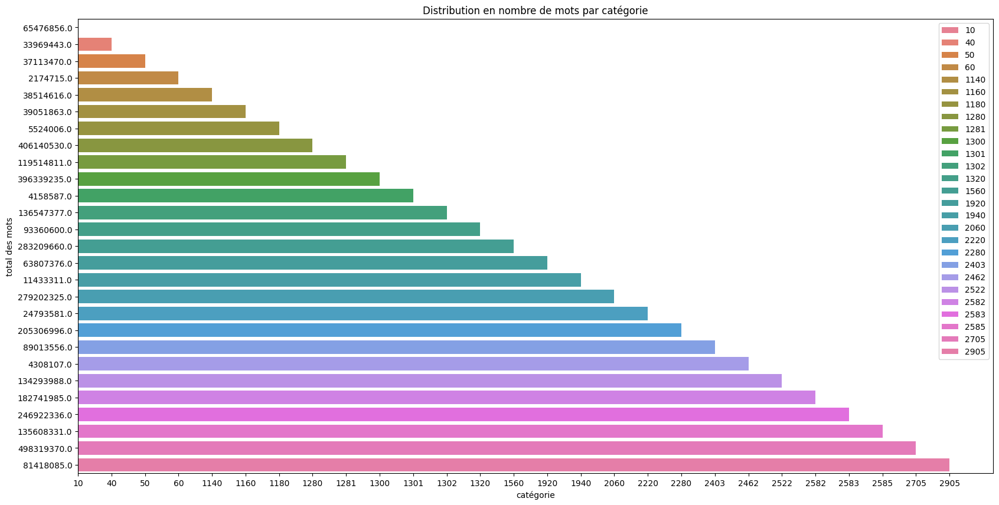

In [28]:

data_cat_words = pd.pivot_table(data=all_code_words_count_frame, columns=all_code_words_count_frame.index, index=all_code_words_count_frame['prdtypecode']).fillna(0)
data_cat_words.columns = data_cat_words.columns.droplevel(0)

display(data_cat_words)
data_cat_words.reset_index()
display("data_cat_words columns:\n", data_cat_words.columns)

data_cat_words = data_cat_words.reset_index()
text = ''
#print("categorie\ttotale des mots")
for cat in data_cat_words.index:
    somme = data_cat_words.iloc[cat, :-1].sum()
    cat = data_cat_words.iloc[cat, 0]
    print(cat, '\t\t', somme)
    text =  text + ('\n' if (text!='') else '') +  (str(cat) + ';' + str(somme))
     
#cat_cte = pd.read_csv(io.StringIO(text), sep=";")
data_cat_words_count = pd.DataFrame([x.split(';') for x in text.split('\n')], columns=['prdtypecode', 'words_count'])
#data_cat_words_count.columns = data_cat_words_count.columns.droplevel(level=0)

print("-----------------------------------------------------")
display(data_cat_words_count)

fig, ax = plt.subplots(1,1,figsize=(20, 10))
g = sns.barplot(data=data_cat_words_count, x='prdtypecode', y='words_count', hue='prdtypecode', ax=ax, orient='h')

ax.set_xlabel('catégorie')
ax.set_ylabel('total des mots')
ax.set_title("Distribution en nombre de mots par catégorie")
#ax.set_xlim([data_cat_words_count['words_count'].min(), data_cat_words_count['words_count'].max()])
plt.legend()
plt.show()



In [87]:

all_code_words_count_frame.reset_index()
all_code_words_count_frame = all_code_words_count_frame.rename(columns={0: 'words_count'})
print("shape before:", all_code_words_count_frame.shape)
# takeoff 0 entries in words_count col
print(all_code_words_count_frame[all_code_words_count_frame['word_count']==0].count())
#all_code_words_count_frame.drop(all_code_words_count_frame['word_count']==0, inplace=True)
print("shape after:", all_code_words_count_frame.shape)
display(all_code_words_count_frame)
#display(all_code_words_count_frame[all_code_words_count_frame['prdtypecode']==10].head(20))
all_code_words_count_frame.to_csv(f'{data_root_folder}/all_code_words.csv')


shape before: (382145, 2)
word_count     27
prdtypecode    27
dtype: int64
shape after: (382145, 2)


,word_count,prdtypecode
aaa,0,40
aaa,0,1140
aaa,0,2060
aaa,0,1300
aaa,0,1281
...,...,...
événements,31569,2705
événements,11443,10
événements,22222,2583
éxecuteurakuma,13342,2403


**Conclusions supplémentaires :** 
>1. Sur la base des métriques reportées sur le comptage des mots (designation vs description), il faut augmenter le # de tokens bien au-dela de 20, ce qui aura un impact sur les dimensions des matrices qui suivent...
>2. Des mots supplémentaires doivent être exclus en fonction des étapes précédentes et les nouvelles découvertes des mots. La liste des mots exclus est extériorisée dans le fichier texte **excluded_words.txt** séquentiel à alimenter au fûr et à mesure...
>3. Le référencement des catégories cibles descriptives du nombre de 27 (code existant -> catégorie) peut être intégré au dataset cible ou stocké dans un fichier de type CSV séparé ? à trancher dès maintenant ->**voir data/conf/category_code_desription.csv** il est chargé via une fonction à appeler

In [37]:
print("Total des catégories =", len(code_words_count_dataframes))
if len(code_words_count_dataframes) > 0:
    sum_of_lines = 0
    for df in code_words_count_dataframes:
        sum_of_lines += df['prdtypecode'].count()
    for df in code_words_count_dataframes:
        print('category code:', df['prdtypecode'][0], "- shape (lines, words):", df.shape, "- % of all:", round(100*df.shape[0]/sum_of_lines, 0), "%")
    #    display(df.head())
#print("------------------------------")
print("total des lignes de prdtypecode :", sum_of_lines)

Total des catégories = 27
category code: 10 - shape (lines, words): (3114, 301) - % of all: 4.0 %
category code: 40 - shape (lines, words): (2478, 301) - % of all: 3.0 %
category code: 50 - shape (lines, words): (1633, 301) - % of all: 2.0 %
category code: 60 - shape (lines, words): (774, 301) - % of all: 1.0 %
category code: 1140 - shape (lines, words): (2670, 301) - % of all: 3.0 %
category code: 1160 - shape (lines, words): (3952, 301) - % of all: 5.0 %
category code: 1180 - shape (lines, words): (764, 301) - % of all: 1.0 %
category code: 1280 - shape (lines, words): (4777, 301) - % of all: 6.0 %
category code: 1281 - shape (lines, words): (1986, 301) - % of all: 2.0 %
category code: 1300 - shape (lines, words): (4988, 301) - % of all: 6.0 %
category code: 1301 - shape (lines, words): (595, 301) - % of all: 1.0 %
category code: 1302 - shape (lines, words): (2302, 301) - % of all: 3.0 %
category code: 1320 - shape (lines, words): (3196, 301) - % of all: 4.0 %
category code: 1560 - s

>* Générer la matrice en tant que Dataframe et l'écrire dans le csv **data/vectorizations/words_count_dataset.csv** qui nous servira comme base de départ pour l'analyse, l'exploration et les expérimentations des modèles relatifs à la partie TEXTE

## C5. Concatenate all generated DFs containing code + words in one DataFrame 

### 🚀**C5.1** Generate dataset input to modeling and CSV file if asked 

In [12]:
# ! Ce lancement peut être très long si le # de mots est trop important ! Pour éviter la génération du27*300 CSV, passer generate_output_csv=False 

load_words_count_dataset_from_picke = False
if load_words_count_dataset_from_picke == True:
    print("Reading from pickle file " + f"{data_root_folder}/words_count_dataset.pkl ...")
    #with open(f"{data_root_folder}/cleaned_data.pkl", 'rb') as f:
        #pickle.load(file=f)
    words_count_dataset = pd.read_pickle(f"{data_root_folder}/words_count_dataset.pkl")
        
else:
    # retun words_count_dataset
    print("Generating 'words_count_dataset'...")
    add_data_prdtypecode_label_guess = True
    generate_output_csv = False # to continue workin on dataframe"
    words_count_dataset = write_words_matrix_to_csv(code_words_count_dataframes, f'{data_root_folder}/words_count_dataset.csv', 
                                                generate_output_csv, add_data_prdtypecode_label_guess, 
                                                add_column_dummies_suffixes=True)
    
    print("Taking off columns suffixes...")
    # takeoff suffixes '_x' after merging done
    words_count_dataset.rename(mapper=lambda x: x.replace('_x', '').lower(), axis=1, inplace=True)
    print(words_count_dataset.columns)
    display(words_count_dataset.head())

    
    print('Converting columns to int type...')
    for col in words_count_dataset.columns:
        if col != 'prdtypelabelguess':
            words_count_dataset[col] = words_count_dataset[col].astype(int)

    # save words_count_dataset data to a pickle file for serialisation
    print("Saving to pickle 'words_count_dataset.pkl'...")
    words_count_dataset.to_pickle(f"{data_root_folder}/words_count_dataset.pkl")

'''
generate_output_csv = False # to continue workin on dataframe"
add_data_prdtypecode_label_guess = True
words_count_dataset = write_words_matrix_to_csv(code_words_count_dataframes, f'{data_root_folder}/words_count_dataset.csv', 
                                                generate_output_csv, add_data_prdtypecode_label_guess, 
                                                add_column_dummies_suffixes=True)
'''

pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 50)

display( get_df_basic_elements(df=words_count_dataset, infos_types=['shape', 'head', 'info'], actions= ['print']) )


Generating 'words_count_dataset'...
list_of_all_words  8101 ['prdtypecode', 'actes', 'action', 'adventures', 'afrique', 'age', 'album', 'allemand', 'america', 'american', 'amis', 'ammareal', 'amour', 'américain', 'analyse', 'analysis', 'ancien', 'ancient', 'annee', 'applications', 'apprendre', 'approach', 'architecture', 'arrêt', 'art', 'arts', 'association', 'associationsltbrgt', 'atlas', 'audio', 'aventure', 'aventures', 'best', 'bible', 'bibliotheque', 'bibliothèque', 'bibliothèques', 'bonheur', 'bordeaux', 'building', 'bulletin', 'business', 'cahier', 'cahiers', 'canada', 'caritatives', 'caritativesltbrgt', 'catalogue', 'century', 'chambre', 'chant', 'charles', 'chemins', 'children', 'classe', 'coeur', 'commentaire', 'communication', 'composition', 'concours', 'conseil', 'construction', 'contes', 'corps', 'cour', 'cours', 'couverture', 'dame', 'days', 'death', 'del', 'design', 'development', 'diary', 'dictionnaire', 'direction', 'discours', 'droit', 'ecole', 'editeur', 'education',

'df_target.columns:'

Index(['prdtypecode'], dtype='object')

'df_target.head():'

,prdtypecode


'df_target afer concatinating prdtypecode:'

,prdtypecode
0,10
1,10
2,10
3,10
4,10
...,...
82260,2905
82261,2905
82262,2905
82263,2905


BEFORE merge
------------------
df_target.shape= (82265, 1)


,prdtypecode
0,10
1,10
2,10
3,10
4,10


,prdtypecode
82260,2905
82261,2905
82262,2905
82263,2905
82264,2905


AFTER merge
------------------
df_target.shape= (82265, 8102)


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,wars_x,way_x,windows_x,écran_x,édition_x,éléments_x,épique,équipe,île_x,prdtypelabelguess
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,wars_x,way_x,windows_x,écran_x,édition_x,éléments_x,épique,équipe,île_x,prdtypelabelguess
82260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jeux PC
82261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jeux PC
82262,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jeux PC
82263,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Jeux PC
82264,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,Jeux PC


Taking off columns suffixes...
Index(['actes', 'action', 'adventures', 'afrique', 'age', 'album', 'allemand',
       'america', 'american', 'amis',
       ...
       'wars', 'way', 'windows', 'écran', 'édition', 'éléments', 'épique',
       'équipe', 'île', 'prdtypelabelguess'],
      dtype='object', length=8102)


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,wars,way,windows,écran,édition,éléments,épique,équipe,île,prdtypelabelguess
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion


Converting columns to int type...
Saving to pickle 'words_count_dataset.pkl'...
shape------------------------------------------------------
(82265, 8102)
head------------------------------------------------------


actes  action  adventures  afrique  age  album  allemand  america  \
0      0       0           0        0    0      0         0        0   
1      0       0           0        0    0      0         0        0   
2      0       0           0        0    0      0         0        0   
3      0       0           0        0    0      0         0        0   
4      0       0           0        0    0      0         0        0   

   american  amis  ammareal  amour  américain  analyse  analysis  ancien  \
0         0     0         0      0          0        0         0       0   
1         0     0         0      0          0        0         0       0   
2         0     0         0      0          0        0         0       0   
3         0     0         0      0          0        0         0       0   
4         0     0         0      0          0        0         0       0   

   ancient  annee  applications  apprendre  approach  architecture  arrêt  \
0        0      0             0          0         0             0      0   
1        0      0             0          0         0             0      0   
2        0      0             0          0         0             0      0   
3        0      0             0          0         0             0      0   
4        0      0             0          0         0             0      0   

   art  arts  association  associationsltbrgt  atlas  audio  aventure  \
0    0     0            0                   0      0      0         0   
1    0     0            0                   0      0      0         0   
2    1     0            0                   0      0      0         0   
3    0     0            0                   0      0      0         0   
4    0     0            0                   0      0      0         0   

   aventures  best  bible  bibliotheque  bibliothèque  bibliothèques  bonheur  \
0          0     0      0             0             0              0        0   
1          0     0      0             0             0              0        0   
2          0     0      0             0             0              0        0   
3          0     0      0             0             0              0        0   
4          0     0      0             0             0              0        0   

   bordeaux  building  bulletin  business  cahier  cahiers  canada  \
0         0         0         0         0       0        0       0   
1         0         0         0         0       0        0       0   
2         0         0         0         0       0        0       0   
3         0         0         0         0       0        0       0   
4         0         0         0         0       0        0       0   

   caritatives  caritativesltbrgt  catalogue  century  chambre  chant  \
0            0                  0          0        0        0      0   
1            0                  0          0        0        0      0   
2            0                  0          0        0        0      0   
3            0                  0          0        0        0      0   
4            0                  0          0        0        0      0   

   charles  chemins  children  classe  coeur  commentaire  communication  \
0        0        0         0       0      0            0              0   
1        0        0         0       0      0            0              0   
2        0        0         0       0      0            0              0   
3        0        0         0       0      0            0              0   
4        0        0         0       0      0            0              0   

   composition  concours  conseil  construction  contes  corps  cour  cours  \
0            0         0        0             0       0      0     0      0   
1            0         0        0             0       0      0     0      0   
2            0         0        0             0       0      0     0      0   
3            0         0        0             0       0      0     0      0   
4           

<class 'pandas.core.frame.DataFrame'>
Index: 82265 entries, 0 to 82264
Columns: 8102 entries, actes to prdtypelabelguess
dtypes: int32(8101), object(1)
memory usage: 2.5+ GB
info------------------------------------------------------


None

{'data': {}}

In [ ]:
# takeoff suffixes '_x' after merging done
words_count_dataset.rename(mapper=lambda x: x.replace('_x', '').lower(), axis=1, inplace=True)

print(words_count_dataset.columns)
display(words_count_dataset)

### C5.2 Encodage de la colonne ***prdtypecode*** en 27 colonnes modulaires (0 ou 1) 

In [23]:
def encode_category_code(X): 
    """Ajouter 27 colonnes modulaires (valeur 0 ou 1) en remplacement de la colonne 'prdtypecode'

    Args:
        X (DataFrame): DataFrame contenant la colonne 'prdtypecode'

    Returns:
        DataFrame: Nouvelle DataFrame (Attention ! La colonne 'prdtypecode' est supprimée !)
    """
    return pd.get_dummies(data=X, columns=['prdtypecode'], prefix_sep='_', dtype=int)
    

words_count_dataset_encoded = encode_category_code(words_count_dataset)
#display(words_count_dataset_encoded.head())
#display(words_count_dataset_encoded.tail())

> Trouver les mots des 2 colonnes et en commun entre **designation** et **description** afin de les écarter dans la vectorisation en les ajoutant dans le fichier **exluded_words.txt**

In [65]:
# On voit bien qu'il y un désiquilbre entre les 'category_code' en termes de nbre de lignes reportant les mots résultat de la vectorization
# afin d'équilibrer les dataset d'entrainement et de test, on peut appliquer les méthode traitant l'oversampling ou undersampling   
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler,  ClusterCentroids
from imblearn.metrics import classification_report_imbalanced, geometric_mean_score


words_dataframes = code_words_count_dataframes

# STEP 1 : concatiner l'ensemble des samples en cumulant les "words" et en mettant 0 pour les catégries ne contenant pas mes mots associés
if len(words_dataframes) > 0:
    list_of_all_words = []
    
    for df in words_dataframes:
        list_of_all_words.extend(list(df.columns[0:-1])) # exclure category_code
    
    # get sequentialy 2 by 2 common words between dataframes
    # on doit le faire 2 par 2 mais pour tous les codes
    print("Common words:\n")
    last_df = None
    for df in words_dataframes:
        if last_df is not None:
            intersection = set(list(df.columns[0:-1])).intersection(set(last_df.columns[0:-1]))
            if len(intersection)>0:
                print("codes catégorie=", df[df.columns[-1]][0], "et",  last_df[last_df.columns[-1]][0])
                print('intersection:', intersection , "found in :")
                print(df.columns[0:-1])
                print(last_df.columns[0:-1])  
                print("================================================================================================")   
        last_df = df

# NOTE : Pour comparer les mots de l'ensemble des catégories, il faut réaliser une combinaison C(n,2) = n!2!/(n-2)! avec n=nbre de catégories

    
    # NOTE : utiliser mangle_dupe_cols=True pour accepter d'avoir plusieurs mots identiques dans le dataset cible en cas de lecture d'un CSV par exemple   
    # https://stackoverflow.com/questions/39986925/multiple-columns-with-the-same-name-in-pandas
    


Common words:

codes catégorie= 40 et 10
intersection: {'one', 'cd', 'audio', 'ii'} found in :
Index(['accessoires', 'action', 'adaptateur', 'alimentation', 'audio', 'ball',
       'batterie', 'bluetooth', 'bouton', 'boutons', 'boîtier', 'caoutchouc',
       'carte', 'cartes', 'cd', 'charge', 'collector', 'commutateur',
       'compatible', 'conception', 'connecteur', 'console', 'controller',
       'contrôleur', 'conçu', 'courant', 'câble', 'différente', 'double',
       'dragon', 'ds', 'dvd', 'ensemble', 'entrée', 'expérience', 'femelle',
       'fil', 'forfait', 'game', 'gamepad', 'hdmi', 'housse', 'hz', 'ii',
       'image', 'installation', 'installer', 'jeu', 'jeux', 'joystick', 'kit',
       'magideal', 'magidealla', 'manette', 'manuelle', 'matériau', 'matériel',
       'meilleure', 'mini', 'mobile', 'moniteur', 'mâle', 'métal', 'nintendo',
       'one', 'ordinateur', 'pack', 'parleur', 'pc', 'pcs', 'pièce', 'pièces',
       'plastique', 'playstation', 'poignée', 'portable', 'pri

From the data assessment above & search made in rakuten website, following product types labels are identified as related to the existing product type codes.

### **C5.3** Nouvelle distribution des catégories après pré-processing et cleanning

Index(['actes', 'age', 'american', 'ammareal', 'amour', 'ancien', 'annee',
       'applications', 'art', 'associationsltbrgt',
       ...
       'unique_x', 'version_x', 'video_x', 'vidéo_x', 'ville_x', 'vista',
       'vive', 'vram', 'windows', 'prdtypelabelguess'],
      dtype='object', length=2702)
2702
<class 'pandas.core.frame.DataFrame'>


,actes,age,american,ammareal,amour,ancien,annee,applications,art,associationsltbrgt,...,unique_x,version_x,video_x,vidéo_x,ville_x,vista,vive,vram,windows,prdtypelabelguess
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion


0          10
1          10
2          10
3          10
4          10
         ... 
82260    2905
82261    2905
82262    2905
82263    2905
82264    2905
Name: prdtypecode, Length: 82265, dtype: int64

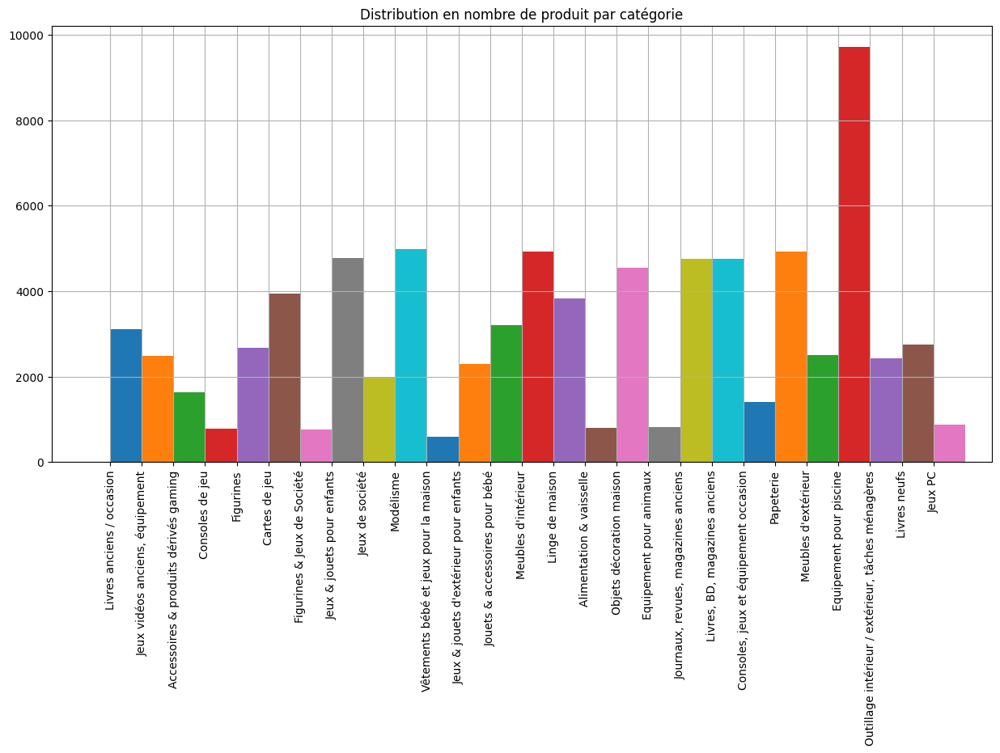

In [25]:
print(words_count_dataset.columns)
print(len(words_count_dataset.columns))
print(type(words_count_dataset))
display(words_count_dataset.head())
display(words_count_dataset['prdtypecode'])


words_count_dataset.groupby(['prdtypecode'])['prdtypelabelguess'].hist(grid=True, xrot='vertical', figsize=(15,7), width=1)
plt.title("Distribution en nombre de produit par catégorie")
plt.show()

>Merge cleanded data with new dataframe containing data_prdtypecode_label_guess (libelé des catégories)

In [63]:

#if load_from_csv == False:
data_cleaned_with_prdtypelabel_guess=pd.merge(left=data_cleaned, left_on='prdtypecode', right=data_prdtypecode_label_guess, right_index=True )
display(data_cleaned_with_prdtypelabel_guess)
#else:
#    load_data(from_csv=load_from_csv, csv_file_path= f'{data_root_folder}/' + csv_file_name, 
#                dataframe=None if (load_from_csv==True) else words_count_dataset)
#    data_cleaned_with_prdtypelabel_guess=pd.merge(left=data_cleaned, left_on='prdtypecode', right=data_prdtypecode_label_guess, right_index=True )
#    display(data_cleaned_with_prdtypelabel_guess)

,designation,description,productid,imageid,prdtypecode,desi_desc,prdtypelabelguess
0,Olivia: Personalisiertes Notizbuch / 150 Seite...,NaN,3804725264,1263597046,10,olivia personalisiertes notizbuch seiten punkt...,Livres anciens / occasion
6,Christof E: Bildungsprozessen Auf Der Spur,NaN,91920807,907794536,10,christof bildungsprozessen auf der spur,Livres anciens / occasion
46,Vassivière -En-Limousin. Le Jardin Art Et Lie...,NaN,444108636,1010065513,10,vassivière limousin jardin art lieu mémoire,Livres anciens / occasion
131,Dr. Mercurius' Heilsame Reise Zum Planeten Erde,NaN,1807806498,1204663650,10,mercurius heilsame reise zum planeten erde,Livres anciens / occasion
188,La Promenade Au Parc,NaN,125293048,880172152,10,promenade parc,Livres anciens / occasion
...,...,...,...,...,...,...,...
84114,Boîte de 144 craies Master Rouge-Tweeten Fibre,Craies Master de couleur rouge.<br />Par boite...,1940778568,1115204639,1301,boîte craies master rougetweeten fibre craies ...,Vêtements bébé et jeux pour la maison
84168,Descente de Balle Centrale Baby Foot Bonzini-B...,Conduit central intérieure baby foot Bonzini.,141192376,893308885,1301,descente balle centrale baby foot bonzinibonzi...,Vêtements bébé et jeux pour la maison
84258,Billard Table Américain Noir7ft tapis Rouge-Su...,Billard Table Américain Noir 7ft tapis rouge.<...,2633735378,1161295971,1301,billard table américain noirft tapis rougesupr...,Vêtements bébé et jeux pour la maison
84522,Housse Riley Noire Pour Queue 1/2-Riley,Longueur : 79 cm. Housse souple Noire. Pour qu...,457363125,1012111114,1301,housse riley queue riley housse souple queue j...,Vêtements bébé et jeux pour la maison


# D. Text data exploration

## D1. Distribution de la nouvelle variable desi_desc après pré-pricessing

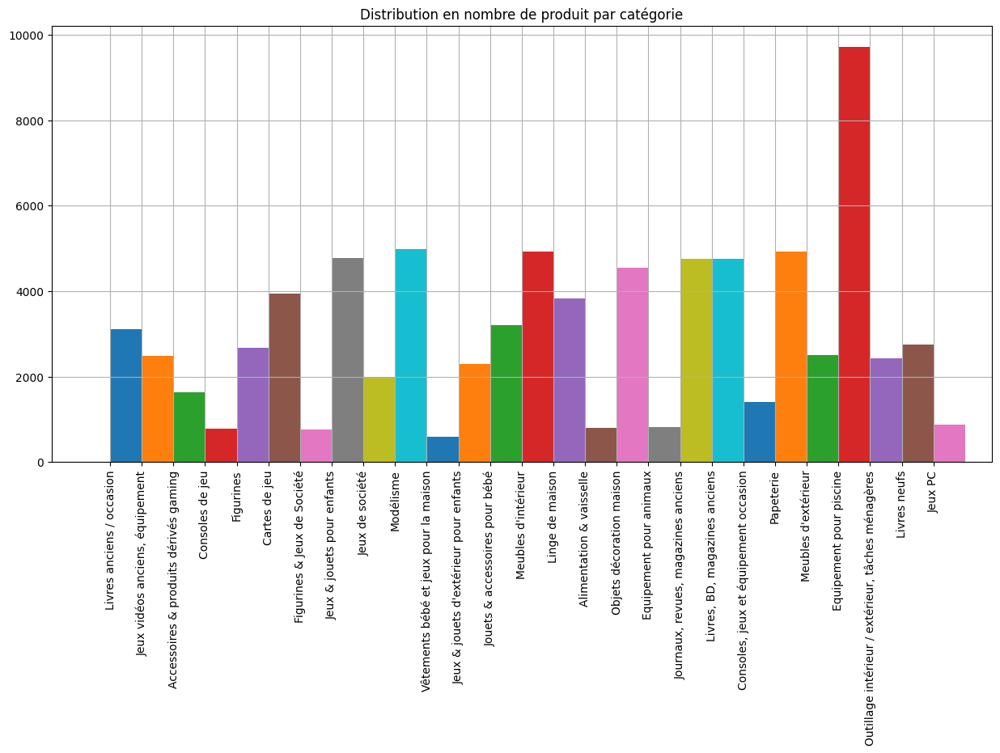

In [64]:

data_cleaned_with_prdtypelabel_guess.groupby(['prdtypecode'])['prdtypelabelguess'].hist(grid=True, xrot='vertical', figsize=(15,7), width=1)
plt.title("Distribution en nombre de produit par catégorie")
plt.show()

## D2. **Words cloud** de 'designation', 'description' et 'desi_desc' (combinaison de designation et description)

>Les cartographies des mots permettent d'une manière simple et efficace d'écarter tous les mots parasites qui n'apportent pas de valeur et d'information sur les variables descriptives (designation & description)

C:\Users\abdel\AppData\Local\Temp\ipykernel_20448\2811075144.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(all_designation_df[0])


(-0.5, 1199.5, 799.5, -0.5)

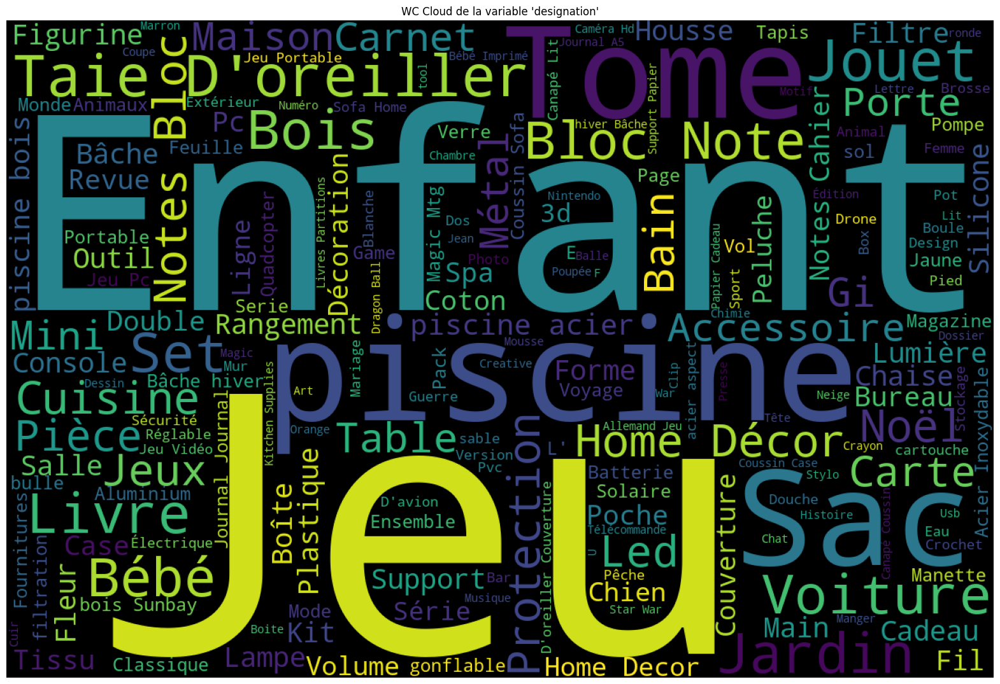

In [19]:
from wordcloud import WordCloud, STOPWORDS
#import nltk
# nltk.download()
from nltk.corpus import stopwords

# wc = WordCloud(width=1200, height=800)
my_stopwords = set(STOPWORDS).union(set(get_excluded_words(f'{data_root_folder}/config/excluded_words.txt')[0])).union(stopwords.words('french'))
wc = WordCloud(width=1200, height=800, stopwords= my_stopwords)
# make merge of all designation column content
all_designation_df = data_cleaned.iloc[:, 0:1].fillna('').apply(lambda x: "".join(x.astype(str)), axis=0)
#display("all_designation_df=", all_designation_df[0])

wc.generate(all_designation_df[0])
plt.figure(figsize=(20, 20))
plt.title("WC Cloud de la variable 'designation'")
plt.imshow(wc)
plt.axis('off')

**On note :**
>- Les **mots clés** se rapportent au type de l'article et non à ses fonctionnalités et carctéristiques en conformité avec la colonne qui porte le jeu de mots, à quelques exceptions près comme les **couleurs**, la **matière** etc.
>- Les 3 mots dominants **"Jeu", "Enfant", "piscine", "Sac" et "Tome"** etc. révèlent les types d'articles majoritaires dans le dataset que l'on peut quantifier. En particulier, les mots que l'on peut qualifier commmuns à plusieurs catégories indiquant un ensemble de caractéristiques, sont finalement sans trop d'importance.

C:\Users\abdel\AppData\Local\Temp\ipykernel_20448\1583795192.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(all_description_df[0])


(-0.5, 1199.5, 799.5, -0.5)

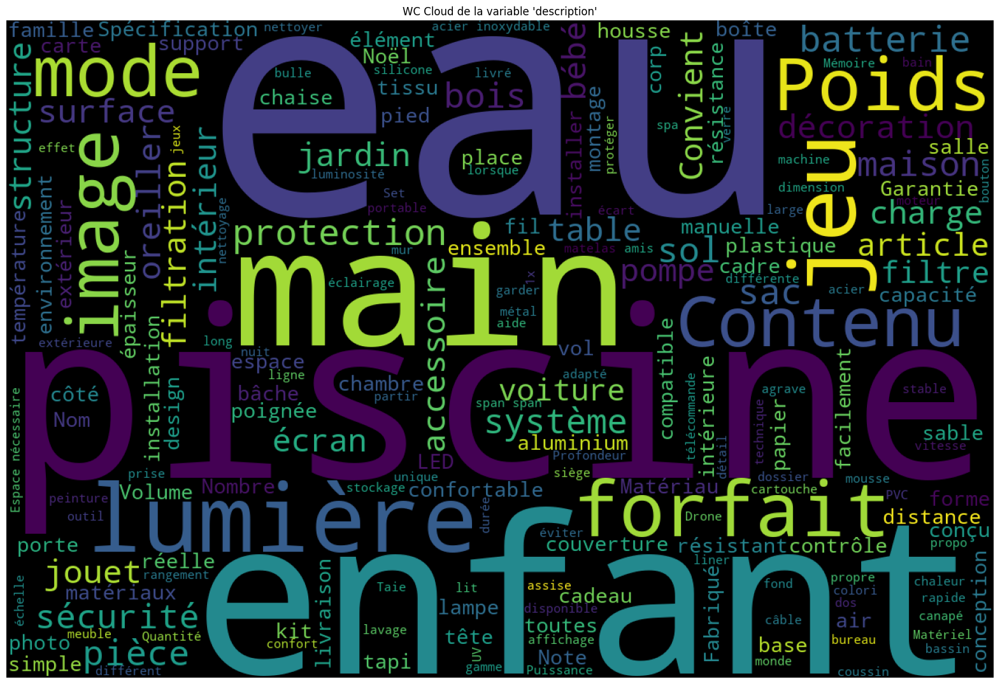

In [20]:
from wordcloud import WordCloud, STOPWORDS
import nltk
from nltk.corpus import stopwords

wc = WordCloud(width=1200, height=800, stopwords= my_stopwords)

# make merge of all designation column content
all_description_df = data_cleaned.iloc[:, 1:2].fillna('').apply(lambda x: "".join(x.astype(str)), axis=0)
#display("all_designation_df=", all_designation_df[0])

wc.generate(all_description_df[0])
plt.figure(figsize=(20, 20))
plt.title("WC Cloud de la variable 'description'")
plt.imshow(wc)
plt.axis('off')

**On note :**
>- Les mots dominants porte plutôt sur le **descriptif**, les **caractéristiqus** et **fonctionnalités** des produits, comme les **dimensions**, les **couleurs**, **qualité**, **faciliés**, **à qui s'adresse ?**, l'**usage** etc.
>- Le mot **produit** est plutôt générique que l'on peut exclure
>- Le mot **eau** est particulier, car il peut se rapporter à plusieurs articles à la fois, comme les piscines, les outils qui utilisent ou traitent l'eau comme matière etc. 

Tous ces mots on été exclus via un fichier text avec d'autres et ne sont plus visibles !

C:\Users\abdel\AppData\Local\Temp\ipykernel_20448\1242765205.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(all_designation_df[0])


(-0.5, 1199.5, 799.5, -0.5)

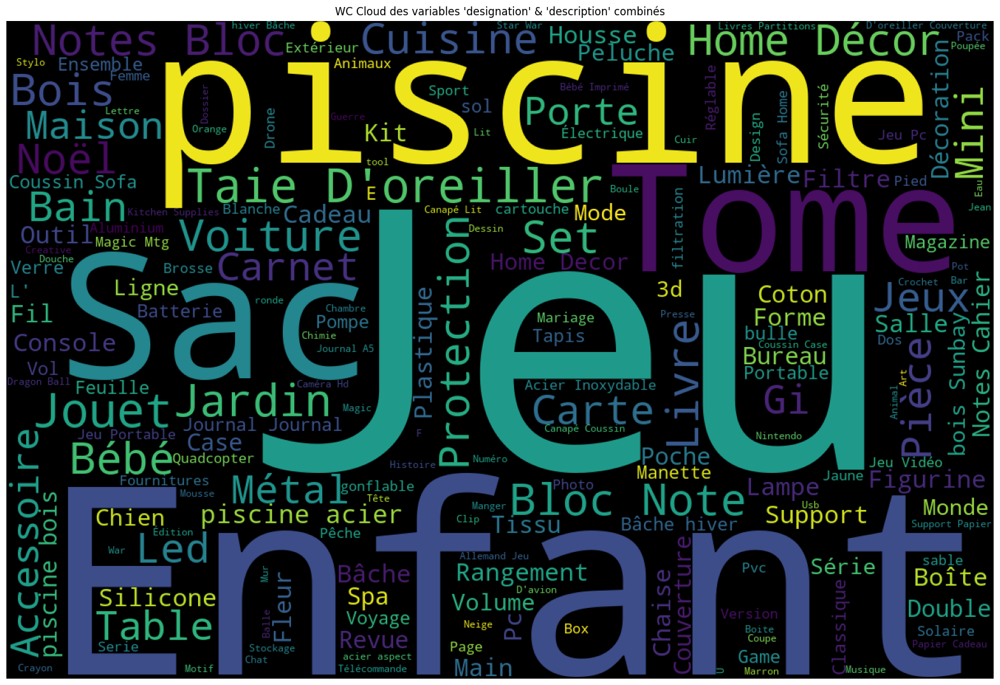

In [21]:
from wordcloud import WordCloud, STOPWORDS
#import nltk
# nltk.download()
from nltk.corpus import stopwords

# wc = WordCloud(width=1200, height=800)
my_stopwords = set(STOPWORDS).union(set(get_excluded_words(f'{data_root_folder}/config/excluded_words.txt')[0])).union(stopwords.words('french'))
wc = WordCloud(width=1200, height=800, stopwords= my_stopwords)
# make merge of all designation column content
all_desi_desc_df = data_cleaned.iloc[:, 3:-1].fillna('').apply(lambda x: "".join(x.astype(str)), axis=0)
#display("all_designation_df=", all_designation_df[0])

wc.generate(all_designation_df[0])
plt.figure(figsize=(20, 20))
plt.imshow(wc)
plt.title("WC Cloud des variables 'designation' & 'description' combinés")
plt.axis('off')

> On voit bien que cette carte reprend les mots importants des deux colonnes 'designation' et 'description' avec un equilibrage en termes d'importance, ce qui nous réconforte dans le choix de combiner les deux colonnes dans une 3ème colonne et ne travailler que sur cette dernière sur la partie texte 

> L'exclusion d'un nombre important de mots parasites n'apportant aucune valeur sémantique, a aussi apporté ses fruits

## D3. Analyse de la distribution de la nouvelle variable 'desi_desc' combinant la 'designation' et la 'desciption'

In [68]:
display(data_cleaned.head())

,designation,description,productid,imageid,prdtypecode
0,Olivia: Personalisiertes Notizbuch / Seiten /...,,3804725264,1263597046,10
1,Journal Des Arts (Le) N° Du // - L'art Et Son...,,436067568,1008141237,2280
2,Grand Stylet Ergonomique Bleu Gamepad Nintendo...,PILOT STYLE Touch Pen de marque Speedlink est ...,201115110,938777978,50
3,Peluche Donald - Europe - Disneyland (Marionn...,,50418756,457047496,1280
4,La Guerre Des Tuques,Luc a des id&eacute;es de grandeur. Il veut or...,278535884,1077757786,2705


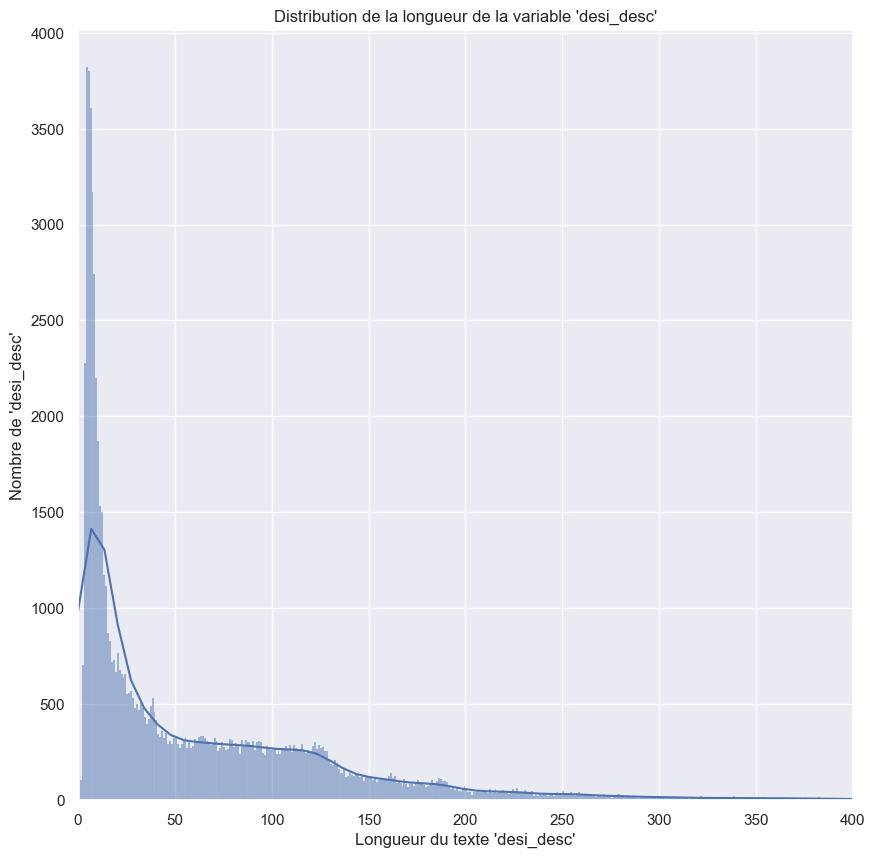

In [98]:
%matplotlib inline 

sns.set_theme(rc={'figure.figsize': (10, 10)})
fig, ax = plt.subplots(nrows= 1, ncols= 1)
g1 = sns.histplot(x=data_cleaned['desi_desc'].str.split().map(lambda x: len(x)), ax=ax, kde=True, bins=range(0,400))
#g2 = sns.histplot(y=data_cleaned['description'].str.split().map(lambda x: len(x)), ax=ax[1], kde= True)

ax.set_xlim(0,400)
plt.xlabel("Longueur du texte 'desi_desc'")
plt.ylabel("Nombre de 'desi_desc'")
plt.title("Distribution de la longueur de la variable 'desi_desc'")
plt.grid(True)
plt.show()           


<Axes: >

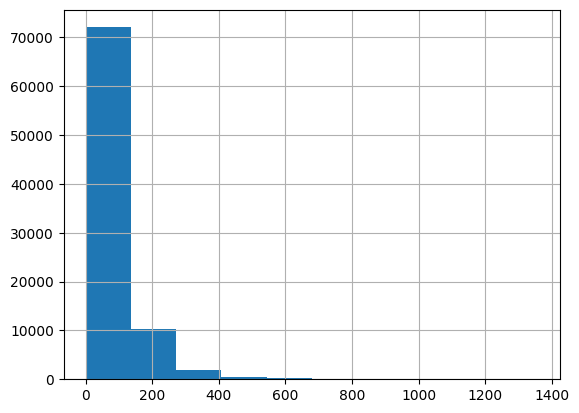

In [ ]:
data_cleaned['desi_desc'].str.split().map(lambda x: len(x)).hist()

'designation' range from 10 to 250 characters and generally, it is between 75 to 100 characters

<Axes: >

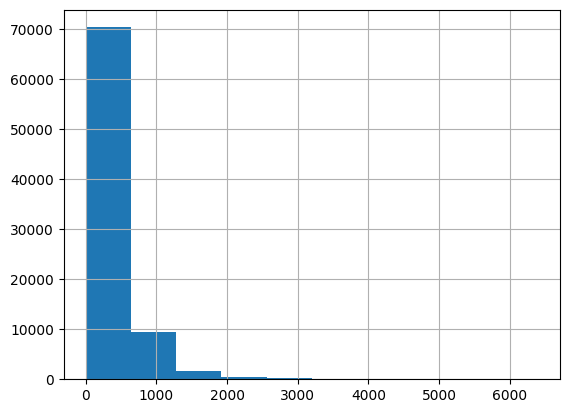

In [66]:
data_cleaned['desi_desc'].str.len().hist()

Number of words in designation ranges from 3 to 50 and mostly falls between 3 to 18 words.

d:\Python312\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Python312\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


0        3.166667
6        3.666667
46       3.833333
131      3.428571
188      2.000000
           ...   
84114    4.300000
84168    5.428571
84258    3.258333
84522    2.833333
84655    3.500000
Name: desi_desc, Length: 82265, dtype: float64

Quartiles de la moyenne des longueurs de la colonne 'desi_desc' obtenus  Q1, Q2, Q3, Q4 = 2.7222222222222223 3.066666666666667 3.4 14.5
IQR = 0.6777777777777776
Indicateur de dispertion supérieur : 4.416666666666666
Indicateur de dispertion inférieur : 1.705555555555556


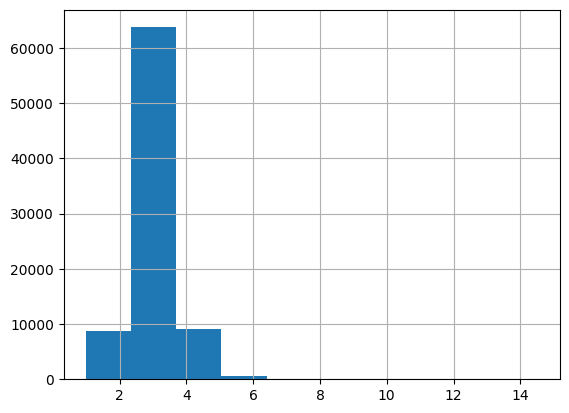

In [56]:
data_design_desc_len_mean = data_cleaned_with_prdtypelabel_guess['desi_desc'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))
display(data_design_desc_len_mean)
data_design_desc_len_mean.hist()

Q1, Q2, Q3, Q4 = data_design_desc_len_mean.quantile(q=[.25, .50, .75, 1])
print("Quartiles de la moyenne des longueurs de la colonne 'desi_desc' obtenus  Q1, Q2, Q3, Q4 =", Q1, Q2, Q3, Q4 )

IQR = Q3 - Q1
print("IQR =", IQR) 

Q_max = Q3 + 1.5*IQR
print("Indicateur de dispertion supérieur :", Q_max)

Q_min = Q1 - 1.5*IQR
print("Indicateur de dispertion inférieur :", Q_min)

#print(data_cleaned_with_prdtypelabel_guess.columns)


The average word length ranges between 2 to 8 with 5 being the most common length

QUARTILES for 'designation_length':
Q1, Q2, Q3, Q4  =  43.0 63.0 90.0 250.0
IQR = 47.0
Indicateur de dispertion supérieur : 160.5
Indicateur de dispertion inférieur : -27.5

QUARTILES for 'description_length':
Q1, Q2, Q3, Q4  =  3.0 210.0 794.0 12451.0
IQR = 791.0
Indicateur de dispertion supérieur : 1980.5
Indicateur de dispertion inférieur : -1183.5


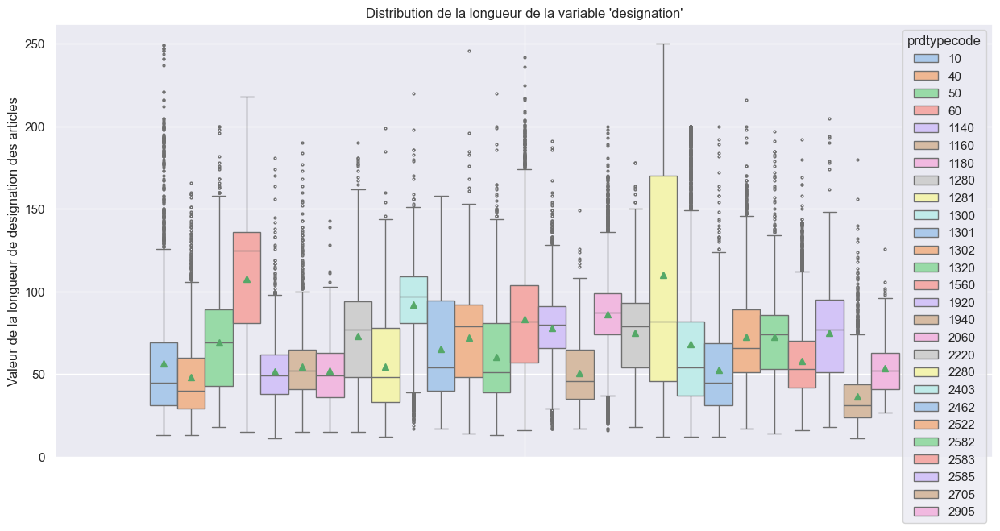

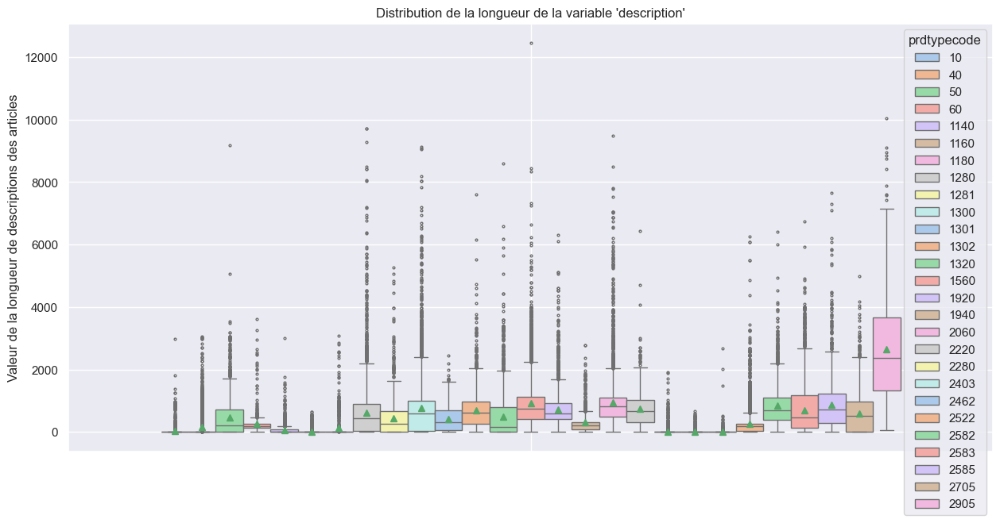

In [42]:
data_byprdtype_length=data
data_byprdtype_length['designation_length'] = data_byprdtype_length['designation'].apply(lambda x: len(str(x)))
data_byprdtype_length['description_length'] = data_byprdtype_length['description'].apply(lambda x: len(str(x)))

print("QUARTILES for 'designation_length':\n===========================================")
Q1, Q2, Q3, Q4 = data_byprdtype_length['designation_length'].quantile(q=[.25, .5, .75, 1.0])
print("Q1, Q2, Q3, Q4  = ", Q1, Q2, Q3, Q4 )

IQR = Q3 - Q1
print("IQR =", IQR) 

Q_max = Q3 + 1.5*IQR
print("Indicateur de dispertion supérieur :", Q_max)

Q_min = Q1 - 1.5*IQR
print("Indicateur de dispertion inférieur :", Q_min)

print("\nQUARTILES for 'description_length':\n===========================================")
Q1, Q2, Q3, Q4 = data_byprdtype_length['description_length'].quantile(q=[.25, .5, .75, 1.0])
print("Q1, Q2, Q3, Q4  = ", Q1, Q2, Q3, Q4 )

IQR = Q3 - Q1
print("IQR =", IQR) 

Q_max = Q3 + 1.5*IQR
print("Indicateur de dispertion supérieur :", Q_max)

Q_min = Q1 - 1.5*IQR
print("Indicateur de dispertion inférieur :", Q_min)



sns.set_theme(rc={'figure.figsize': (15, 7)})
fig, ax = plt.subplots(nrows= 1, ncols= 1)
g1 = sns.boxplot(data=data_byprdtype_length,  y= 'designation_length', ax=ax, hue='prdtypecode', gap=2, fliersize=2, showmeans=True, palette='pastel')
plt.ylabel('Valeur de la longueur de designation des articles')
plt.title("Distribution de la longueur de la variable 'designation'")
plt.grid(True)
plt.show()  


fig, ax = plt.subplots(nrows= 1, ncols= 1)
g2 = sns.boxplot(data=data_byprdtype_length,  y= 'description_length', ax=ax, hue='prdtypecode', gap=2, fliersize=2, showmeans=True, palette='pastel')
plt.ylabel('Valeur de la longueur de descriptions des articles')
plt.title("Distribution de la longueur de la variable 'description'")
plt.grid(True)
plt.show()           


>- **description**: beaucoup d'outliers supérieurs à Q3, la majorté ne dépasse pas les 1000 de longeur (à l'exceptio de la cat n° 2905, jeux videos/PC) qui a moins d'outiliers que le reste des catégories

>- **designation**: la catégorie coddée **1281** semble être la seule qui ne possède pas d'outliers ni inliers; il suffit d'examiner à quel type d'articles est associée (catégorie descriptive : 'Jeux de société') ?

>- Le calcul des quartiles, montre que la variable 'description' possèdent un Q3 et Q4 assez élevés par rapport au champ 'designation' indiquant ainsi une richesse très importante en termes de nombre de mots utilisés dans la description

*Il faut aller plus loin et examiner les mots que ces deux colonnes contiennent, faire une analyse sémantique, statistique et voir si une corrélation existe entre ces deux champs ?*

# E. **1ères expérimentations de modélisation**

## E1. Fonctions communes de support

### 🚀E1.1 Helper functions

In [9]:


def run_experiments_via_mlflow(experiment_name="rakuten", run_name='rakuten_run', params={}, metrics={}, sk_model=neighbors.KNeighborsClassifier(),  
                               input_example=pd.DataFrame(), artifact_path='rakuten'):
    # Define tracking_uri
    # client = MlflowClient(tracking_uri="http://127.0.0.1:5000")
    mlflow.set_tracking_uri("http://127.0.0.1:5000")
    mlflow.autolog()
    # Define experiment name, run name and artifact_path name
    experiment = mlflow.set_experiment(experiment_name=experiment_name)
    

    # set experiment details here
    


    # Store information in tracking server
    with mlflow.start_run(run_name=run_name) as run:
        mlflow.log_params(params)
        mlflow.log_metrics(metrics)
        mlflow.sklearn.log_model(
            sk_model=sk_model, input_example=input_example, artifact_path=artifact_path
        )
        print(f"Run ID: {run.info.run_id}")
        


def load_data(from_csv, csv_file_path, dataframe, from_pickle, pickle_file_path):
    try:
        df = None
        csv_source = from_csv and True
        pickle_source = from_pickle and True
        if csv_source == True:
            # read produced CSV OR
            print(f'read CSV file {confusion_matrix}')
            df = pd.read_csv(csv_file_path, sep=',', index_col=0)
        elif pickle_source == True:
            print(f'read pickle file {pickle_file_path}')
            df = pd.DataFrame(pd.read_pickle(pickle_file_path))
        else:
            if isinstance(dataframe, pd.DataFrame):
                df = dataframe
                
        # modify all columns data type to int (less memory cunsumption)
        for col in df.columns:
            if not col in ['prdtypelabelguess']:
                df[col] = df[col].astype(int) 
        print(df.info())
    except:
        print('Erreur produite lors de la récupération des données')
        return None
        
    return df


def get_category_code_dummies_columns(X):
    if not isinstance(X, pd.DataFrame):
        return []

    ret_cols = []
    if len(X.columns) > 0:
        for col in X.columns:
            if 'category_code_' in col:
                ret_cols.append(col)
                
    return ret_cols



def define_X_target(dataframe=pd.DataFrame(None), columns_to_drop_from_X=[], target_columns=[]):
    if isinstance( dataframe, pd.DataFrame):
        X = dataframe.drop(columns_to_drop_from_X, axis = 1)
        target = dataframe[target_columns]
    return pd.DataFrame(X), pd.DataFrame(target) 
        

def get_train_test_split(X, y, test_size=.2, random_state=0, scale=False, scaler=preprocessing.StandardScaler()):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    if scale == True:
        # apply the scaler to X_train by transform method to get X_train_scaled
        X_train = pd.DataFrame( scaler.fit_transform(X_train), columns=X_train.columns )
        X_test = pd.DataFrame( scaler.fit_transform(X_test), columns=X_test.columns )

    return  X_train, X_test, y_train, y_test    
    

def get_X_with_weak_features_variance(X, dev_threshold=1):
    
    sel = VarianceThreshold(threshold=dev_threshold)
    sel.fit(X)

    # get mask returned by sel to see which features have been deselected
    mask = sel.get_support()
    false_mask = mask[mask==False]
    display(false_mask)
    print("number of words with weak variance:", len(false_mask))

    # get the list of features with weak variance
    list_words_good_variance = X.columns[mask]
    print("words to keep :")
    display(list_words_good_variance)

    # corresponding variance array
    words_good_variance = np.var( X[X.columns[mask]], axis=0 )
    print("words to keep variance :")
    display(words_good_variance)

    
    return X[X.columns[mask]]
    


def get_conf_matrix(y_test, y_pred, xlabel, ylabel, target, title): 
    #display(pd.crosstab(index=y_pred, columns=y_test, rownames='valeurs Prédites', colnames='Valeurs Réelles'))
    plt.figure(figsize=(15,15))
    conf_matrix = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(1,1,figsize=(17,15))
    disp = ConfusionMatrixDisplay.from_predictions(y_true=y_test,y_pred=y_pred, display_labels=target, 
                                                   xticks_rotation='vertical', ax=ax, cmap='seismic')
    disp.ax_.set_title(title)
    plt.show()
    return
    
    print("============================CONFUSION MATRIX=======================================") 
    #Use the confusion matrix of sklearn.metrics 
    print("Confusion matrix as graph with Seaborn :") 
    plt.figure(figsize=(15,15))  
    sns.heatmap(data=pd.DataFrame(confusion_matrix(y_true=y_test, y_pred=y_pred)), 
                annot=True, cmap='Blues', xticklabels= target, yticklabels= target, cbar=False,  
                square=True, fmt=".0f") 
    plt.xlabel(xlabel) 
    plt.ylabel(ylabel) 
    plt.title(title) 
    plt.show() 
    
    
def get_conf_matrix_1(cnf_matrix, classes_list , title): 
    classes = sorted(classes_list)

    plt.figure(figsize=(10,10))

    plt.imshow(cnf_matrix, interpolation='nearest',cmap='Blues')
    plt.title(title)
    plt.colorbar()
    tick_marks = classes
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
        plt.text(j, i, cnf_matrix[i, j],
                horizontalalignment="center",
                color="white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

    plt.ylabel('Classes réelles')
    plt.xlabel('Classes prédites')
    plt.show()


def display_conf_matrix(y_test, y_pred, xlabel, ylabel):
    ConfusionMatrixDisplay.from_predictions(y_true=y_test, y_pred=y_pred, labels=[xlabel, ylabel])


def roc_auc_curve(y_test, y_probas, title ):
    """
    Plot ROC-AUC curve () : Receiver Operating Characteristic) - Area Under the Curve
    """
    if title == '':
        title = 'courbe ROC-AUC'
    skplt.metrics.plot_roc(y_test, y_probas, title=title, figsize=(20,20))
    plt.show()


def plot_cumulative_gain(y_test, y_probas, title ):
    """
    Plot cumulative gains
    """
    plt.figure(figsize=(12,8))
    if title == '':
        title = 'Courbe des gains cumulatifs cumulés'
    plot_cumulative_gain(y_test, y_probas, title= title) 
    plt.ylim(0, 1.01) 
    plt.show()
    plt.show()   


def get_pobas(estimator, X_test):
    probas = estimator.predict_proba(X_test)
    print(f'{estimator} :\n {probas}')
    return probas

def plot_3D_graph_of_features_reduction(df, x, y, width=800, height=600, title="3D graph"):
    if not isinstance(df, pd.DataFrame):
        return
    
    # graphe 3D
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(x= x, y= y, z=np.zeros(df.shape[0]), 
                    mode='markers', marker=dict(size=3, color=target, 
                    colorscale='Spectral')))

    fig.update_layout(scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='manual',
        aspectratio=dict(x=2, y=0.5, z=1) 
    ))

    fig.update_layout(title= title, width= width, height= height)

    fig.show()


def plot_2D_graph_of_features_reduction( x, y, target, width=800, height=600, title="3D graph"):
    # graphe 2D
    fig, ax = plt.subplots(1, 1, figsize=(width, height))
    ax.scatter(x= x, y= y,  c = target, cmap=plt.cm.Spectral)
    ax.set_title(title)
    plt.show()
    
    
def plot_f1_scores(train_f1_score, test_f1_score, model, categories):
       mean_train_f1_score = train_f1_score.mean()
       mean_test_f1_score = test_f1_score.mean()
       print("mean_train_f1_score=", mean_train_f1_score)
       print("mean_test_f1_score=", mean_test_f1_score)
       
       fig, ax = plt.subplots(1,1, figsize=(15,7))
       g1 = sns.lineplot(y=train_f1_score, x=range(1, 1+len(train_f1_score)), ax=ax)
       g1.set_label('f1-score train')
       g2 = sns.lineplot(y=test_f1_score, x=range(1, 1+len(test_f1_score)), ax=ax)
       g2.set_label('f1-score test')
       g3 = plt.axhline(y=mean_train_f1_score, color='b', linestyle='-.')
       g3.set_label('Moyenne f1-score train')
       g4 = plt.axhline(y=mean_test_f1_score, color='orange', linestyle='-.')
       g4.set_label('Moyenne f1-score test')
       plt.title("Courbes des f1-score pour les ensembles d'entraînement et de test - " + str(model))
       plt.grid(True)
       plt.legend()
       plt.yticks(np.arange(0, 1.01, 0.1))
       # set x axis labels as categories
       if isinstance(categories, list):
              ax.set_xticklabels(labels=categories, rotation=90)
              plt.xticks(range(1, 1+len(categories)))
       else:
              ax.set_xticklabels(labels=range(1, 1+len(train_f1_score)))
              
       plt.show()
       
def preprocess_text_sting(text):
    stop_words = set(stopwords.words('french'))
    tokens = word_tokenize(text)
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word.isalpha() and word not in stop_words]
    return ' '.join(tokens)


def get_text_vectorized(text):
    # Utilisation de TfidfVectorizer
    tfidf_vectorizer = TfidfVectorizer()
    X_tfidf = tfidf_vectorizer.fit_transform(text.split())

    # Création du DataFrame associé à X_tfidf
    df_tfidf = pd.DataFrame(X_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
    
    return df_tfidf


def get_predictions(best_estimator, df, text_list=list(), print_dataframes=False, drop_categories=True):
    '''
    Objectif : Réaliser des tests avec une liste de textes descriptifs pour prédire la catégorie de produit
    Paramètres :
         best_estimator (modèle) : le modèle corresndant au meilleur estimateur
         df (pd.DataFrame): dataset
         text_list (list) : Liste des textes à tester la prédiction
         print_dataframes (bool) : indiquer si OUI/NON d'imprimer la tokenisation des texte par rapport au contenu du dataset (intersection)
    '''
    probas = []
    if isinstance(df, pd.DataFrame):
        if len(text_list) > 0:
            print(f"{len(text_list)} texts to be predicted:" )
            for text in text_list:
                my_text_cleaned = preprocess_text_sting(text)
                my_text_df = get_text_vectorized(my_text_cleaned)

                # get intersection of dataset columns and text vecotor words
                #print("df.shape=", df.shape)
                df1 = df.drop(['prdtypelabelguess', 'prdtypecode'], axis=1) if (drop_categories==True) else df
                #print("df1.shape=", df1.shape)
                intersect = set(df1.columns).intersection(my_text_df.columns)
                
                
                # takeoff cols not in df (le modèle na va pas les reconnaître)
                my_text_df = my_text_df[list(intersect)]
                if print_dataframes==True:
                    print("my_text_df after intersection:")
                    display("my_text_df=", my_text_df)
                #print("len(df.columns)=", len(df1.columns))
                #print("len(my_text_df.columns)=", len(my_text_df.columns))


                # replace existing column by those of my_text_df with the same name
                # set to zero all entries before replacing cols
                df1[:]=0
                for col in my_text_df.columns:
                    total_cats = data_prdtypecode_label_guess.shape[0] # total categories
                    col_proba = np.full(shape=my_text_df[col].shape, fill_value= np.array(my_text_df[col]).sum()/total_cats) 
                    new_col = np.concatenate( [np.array(col_proba), np.zeros(shape=df1.shape[0]-my_text_df.shape[0])], axis=0)
                    #print(new_col.shape)
                    df1[col] = new_col
                
                if print_dataframes==True:
                    display(df1.head(10))
                probas.append(best_estimator.predict_proba(df1))
                '''
                display("probas=", probas)
                print(probas.shape)
                print("probas sum, min", probas.sum(), probas.mean())
                for i in range(0, 27):
                    print(probas[i].sum())
                '''
                    

                # B. predict category from text
                my_category_pred = best_estimator.predict(df1)
                cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
                print("="*100)
                print(f"La prédiction pour mon texte \n{text}\nest la catégorie :\n{cat_desc}")
                
    return probas

### 🚀E1.2 Load dataframe **df** from CVS/DataFrame or a pickle saved file

In [4]:

# passer from_csv = False, évite de charger le csv qui peut être volumneux, passer dans ce cas words_count_dataset
load_from_csv = False # set True to load from CSV, otherwise False
csv_file_name = 'words_count_dataset-15-09-24.csv'
load_from_pickle = True
pickle_file_name = 'words_count_dataset.pkl'
load_encoded = False # load words_count_dataset_encoded if True else words_count_dataset

if load_encoded == False:
    print("Loading non-encoded dataframe...")
    df = load_data(from_csv=load_from_csv, csv_file_path= f'{data_root_folder}/' + csv_file_name, 
                dataframe=None if ((load_from_csv==True) or (load_from_pickle==True)) else words_count_dataset,
                from_pickle=load_from_pickle, pickle_file_path=f"{data_root_folder}/{pickle_file_name}")
else:
    print("Loading encoded dataframe...")
    df = load_data(from_csv=load_from_csv, csv_file_path= f'{data_root_folder}/' + csv_file_name, 
                dataframe=None if ((load_from_csv==True) or (load_from_pickle==True)) else words_count_dataset_encoded,
                from_pickle=load_from_pickle, pickle_file_path=f"{data_root_folder}/{pickle_file_name}")
    
print(type(df))
display(df.head())


Loading non-encoded dataframe...
read pickle file ../data/words_count_dataset.pkl
<class 'pandas.core.frame.DataFrame'>
Index: 82265 entries, 0 to 82264
Columns: 8102 entries, actes to prdtypelabelguess
dtypes: int32(8101), object(1)
memory usage: 2.5+ GB
None
<class 'pandas.core.frame.DataFrame'>


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,wars,way,windows,écran,édition,éléments,épique,équipe,île,prdtypelabelguess
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Livres anciens / occasion
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Livres anciens / occasion
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Livres anciens / occasion
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Livres anciens / occasion
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Livres anciens / occasion


In [33]:
print(df.columns)

Index(['actes', 'age', 'american', 'ammareal', 'amour', 'ancien', 'annee',
       'applications', 'art', 'associationsltbrgt',
       ...
       'unique_x', 'version_x', 'video_x', 'vidéo_x', 'ville_x', 'vista',
       'vive', 'vram', 'windows', 'prdtypelabelguess'],
      dtype='object', length=2702)


### E1.3 Get dataset basic infos

In [34]:
# get_df_basic_elements(df= words_count_dataset, infos_types=['shape', 'head', 'tail', 'info', 'describe'], actions=['print'])

get_df_basic_elements(df= df, infos_types=['shape', 'head', 'tail', 'info', 'describe'], actions=['print'])

shape------------------------------------------------------
(82265, 2702)
head------------------------------------------------------


,actes,age,american,ammareal,amour,ancien,annee,applications,art,associationsltbrgt,...,unique_x,version_x,video_x,vidéo_x,ville_x,vista,vive,vram,windows,prdtypelabelguess
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Livres anciens / occasion


tail------------------------------------------------------


,actes,age,american,ammareal,amour,ancien,annee,applications,art,associationsltbrgt,...,unique_x,version_x,video_x,vidéo_x,ville_x,vista,vive,vram,windows,prdtypelabelguess
82260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,Jeux PC
82261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,Jeux PC
82262,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,Jeux PC
82263,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Jeux PC
82264,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,Jeux PC


<class 'pandas.core.frame.DataFrame'>
Index: 82265 entries, 0 to 82264
Columns: 2702 entries, actes to prdtypelabelguess
dtypes: float64(2700), int64(1), object(1)
memory usage: 1.7+ GB
info------------------------------------------------------


None

describe------------------------------------------------------


,actes,age,american,ammareal,amour,ancien,annee,applications,art,associationsltbrgt,...,télécharger,unique_x,version_x,video_x,vidéo_x,ville_x,vista,vive,vram,windows
count,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,...,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000,82265.000000
mean,0.000182,0.000170,0.000158,0.000972,0.000194,0.000340,0.000158,0.000158,0.000608,0.000498,...,0.003258,0.002297,0.005969,0.002030,0.006029,0.002042,0.003294,0.003258,0.002735,0.024956
std,0.013502,0.013945,0.012570,0.043814,0.014791,0.019094,0.013502,0.013502,0.029578,0.022319,...,0.057409,0.061245,0.117102,0.071509,0.126240,0.073768,0.071292,0.104894,0.090676,0.350424
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,4.000000,1.000000,...,2.000000,6.000000,8.000000,6.000000,6.000000,7.000000,4.000000,6.000000,6.000000,18.000000


{'data': {'shape': '', 'head': '', 'tail': '', 'info': '', 'describe': ''}}

### 🚀E1.4 Définir X & target

In [5]:
load_from_pickle = True
load_encoded = False
X_target_file = 'X_target.pkl'
X_target_encoded_file = 'X_target_encoded.pkl'


if load_from_pickle == False:
    if load_encoded == False:
        print("load non encoded data...")
        X, target = define_X_target(df, ['prdtypecode', 'prdtypelabelguess'], 'prdtypecode')
        print(f'writting to pickle file {data_root_folder}/{X_target_file}')
        pd.to_pickle((X, target), f'{data_root_folder}/{X_target_file}')
    else:
        print("load encoded data...")
        target_cols = get_category_code_dummies_columns(df)
        display(target_cols)
        X, target = define_X_target(df, ['prdtypelabelguess'], target_cols)
        print(f'writting to pickle file {data_root_folder}/{X_target_encoded_file}')
        pd.to_pickle((X, target), f'{data_root_folder}/{X_target_encoded_file}')
else:
    if load_encoded == False:
        print(f"load non encoded data from pickle file {f'{data_root_folder}/{X_target_file}'}...")
        X, target = pd.read_pickle(f'{data_root_folder}/{X_target_file}')
    else:
        print(f"load encoded data from pickle file {f'{data_root_folder}/{X_target_encoded_file}'}...")
        X, target = pd.read_pickle(f'{data_root_folder}/{X_target_encoded_file}')
        
    
print("X.shape=", X.shape)
print("target.shape=", target.shape)


load non encoded data from pickle file ../data/X_target.pkl...
X.shape= (82265, 8100)
target.shape= (82265, 1)


### 🚀E1.5 X_train, X_test, y_train, y_test

In [6]:
# selectionner un des scalers les plus communs en fonction des modèles : StandardScaler, MinMaxScaler, MaxAbsScaler, RobustScaler or Normalizer

scale = True
X_train, X_test, y_train, y_test = get_train_test_split(X=X, y=target, test_size=.2, random_state=0, scale=scale, scaler=preprocessing.Normalizer())
print("X_train.shape=", X_train.shape)
print("X_test.shape=", X_test.shape)
print(type(X_train))
print(type(X_test))
display(X_train.head())
display(X_test.head())
display(y_train)
display(y_test)


X_train.shape= (65812, 8100)
X_test.shape= (16453, 8100)
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,véhicules,wars,way,windows,écran,édition,éléments,épique,équipe,île
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,véhicules,wars,way,windows,écran,édition,éléments,épique,équipe,île
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,prdtypecode
74707,2583
52823,2280
19573,1280
39080,1920
66873,2583
...,...
21243,1281
45891,2060
42613,1940
43567,2060


,prdtypecode
30318,1320
11659,1160
4162,40
31544,1320
14653,1180
...,...
33042,1320
45411,2060
35213,1560
42551,1940


## E2. **GridSearchCV** : Simulation/Exécution des modèles

### 🚀E2.1.1 **GridSeachCV** helper functions

In [7]:


#/////////////////////////////////////////////////
# create tuned model for one estimator at time
#/////////////////////////////////////////////////
def create_model_tuned(X_train, X_test, y_train, y_test, target, cv= 3, 
                       estimator_name='KNN', estimator=neighbors.KNeighborsClassifier(), params={'n_neighbors' : [10]}):
    # liste des valeurs des colonnes à reporter dans le DataFrame à retourner
    train_mse_results = []
    test_mse_results = []
    train_r2_scores = []
    test_r2_scores = []
    train_f1_score = []
    test_f1_score = []
    best_params = []
    
    
    print("\n-----------------------------------------------------------------------")
    print('X_train.shape - X_test.shape - len(y_train) - len(y_test)')
    print(f'{X_train.shape} - {X_test.shape} - {len(y_train)} - {len(y_test)}')
    
    print("\n-----------------------------------------------------------------------")
    print( pd.DataFrame.from_dict({
        'name':  f'{estimator_name}',
        'estimator': f'{estimator}',
        'params': f'{params}'
        }, orient='index') 
    )
    print("-----------------------------------------------------------------------\n")
    

    # on fixe cv à 3
    gs_best = GridSearchCV(estimator, params, cv=cv, n_jobs=-1, verbose= 2).fit(X_train, y_train)

    final_model = estimator.set_params(**gs_best.best_params_).fit(X_train, y_train)

    train_r2_score = final_model.score(X_train, y_train)
    test_r2_score = final_model.score(X_test, y_test)
    train_r2_scores.append(train_r2_score)
    test_r2_scores.append(test_r2_score)

    print("train_r2_score = ", train_r2_score)
    print("test_r2_score =", test_r2_score)

    best_params.append(gs_best.best_params_)

    print("type(X_train), type(X_test) =\n", type(X_train), ",", type(X_test))
    print("X_train.columns, X_test.columns =\n", X_train.columns, "\n" , X_test.columns)
    y_train_pred = final_model.predict(X_train)
    y_test_pred = final_model.predict(X_test)
    
    # f1_score
    precision, recall, fscore, support = score(y_train, y_train_pred)
    train_f1_score.append(fscore)
    print(f'train_f1_score = {train_f1_score}')
    precision, recall, fscore, support = score(y_test, y_test_pred)
    test_f1_score.append(fscore)
    print(f'test_f1_score = {test_f1_score}')
    
    # get categories names and plot f1_score graph
    data_prdtypecode_label_guess =get_cat_codes_description('category_code_desription.csv')
    cat_descriptions = list(data_prdtypecode_label_guess['prdtypelabelguess'])
    #print(cat_descriptions)
    plot_f1_scores(train_f1_score=np.array(train_f1_score).reshape(-1), test_f1_score=np.array(test_f1_score).reshape(-1), 
                   model=estimator_name, categories=cat_descriptions)
    
    
    # MSE
    train_mse_result = mean_squared_error(y_train.astype(float), y_train_pred)
    test_mse_result = mean_squared_error(y_test.astype(float), y_test_pred)
    train_mse_results.append(train_mse_result)
    test_mse_results.append(test_mse_result)
    
    print("train_mse_result = ", train_mse_result)
    print("test_mse_result =", test_mse_result)
    
    print("best_params:", best_params)
    
    # fpr = False Positive rates, tps = true positive rates 
    #fpr, tpr, seuils = roc_curve(y_true=y_test, y_score= test_f1_score, pos_label=1) 
    # plot the roc_auc_curve
    roc_auc_curve(y_test=y_test, y_probas= final_model.predict_proba(X_test), title='Courbes ROC-AUC - ' + estimator_name) 
    #plot_cumulative_gain(y_test=y_test, y_probas= final_model.predict_proba(X_test), title='Courbes ROC-AUC - ' + estimator_name)
    
    # afficher la matrice de confusion associée au modèle traité
    print("------Confusion Matrix-----------")
    cols = sorted(list(target['prdtypecode'].unique()))
    print('liste des product codes:', cols )
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    display(pd.DataFrame(confusion_matrix(y_true=y_test, y_pred=y_test_pred), columns=cols, index=cols))

    get_conf_matrix(y_test= y_test, y_pred= y_test_pred, xlabel='Valeurs réelles', ylabel="Valeurs prédites",
                   target= target['prdtypecode'].unique() , title="Matrice de confusion-" + estimator_name)
        
    model_tuned_results = pd.DataFrame({'Model_Name': estimator_name,
                                    'R2_score_Train': train_r2_scores,
                                    'R2_score_Test': test_r2_scores,
                                    'f1_score_Train': train_f1_score,
                                    'f1_score_Test': test_f1_score,
                                    'MSE_train': train_mse_results,
                                    'MSE_test': test_mse_results,
                                    'best_params': best_params
                                    }).set_index("Model_Name")
    model_tuned_results=model_tuned_results.sort_values(by="R2_score_Test", ascending=True)
  
    return model_tuned_results, gs_best.cv_results_, final_model


# create tuned model for many estimators
def create_many_models_tuned(X_train, X_test, y_train, y_test, target, cv= 3, list_models = list(dict({'name': '', 'estimator': None, 'params': {} }))):
    
    """
    Examples :
    knn_params = {'n_neighbors' : np.arange(2, 500, 1)}
    
    svc_params = {'C': [0.05, 0.1, 0.2, 0.3, 0.5, 1.0, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, 35.0, 40.0, 45.0, 50.0], 
                    'kernel': ['linear', 'sigmoid', 'rbf']}
    
    rf_params = {'max_features': ["sqrt", "log2", None],
                'min_samples_split': np.arange(2, 28, 1)}   # 27 code category
    
    elasticnet_params = {'l1_ratio': list(np.arange(0.0, 1.05, 0.05)),
                   'alpha': [0.01, 0.02, 0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
                   }
    list_models = [ ("ELASTIC_NET", sklearn.linear_model.ElasticNetCV(), elasticnet_params ),
                  ("KNN", neighbors.KNeighborsClassifier(), knn_params),
                ("RF", ensemble.RandomForestClassifier(), rf_params),
                  ("SVC", svm.SVC(), svc_params)
                ]
    list_models = [("KNN", neighbors.KNeighborsClassifier(), knn_params),
                ("SVC", svm.SVC(), svc_params),
                ("RF", ensemble.RandomForestClassifier(), rf_params)]
    
    """
    model_tuned_results = pd.DataFrame({'Model_Name': '',
                                    'R2_score_Train': '',
                                    'R2_score_Test': '',
                                    'f1_score_Train': '',
                                    'f1_score_Test': '',
                                    'MSE_train': '',
                                    'MSE_test': '',
                                    "best_params": ''},
                                    index=[0] )
    if len(list_models) > 0:
      for model in list_models:
        m, gs_best, best_estim = create_model_tuned(X_train, X_test, y_train, y_test, target, cv=cv, 
                           estimator_name= model['name'], estimator= model['estimator'], params= model['params'])
        
        model_tuned_results = model_tuned_results.add({'Model_Name': m['Model_Name'],
                                    'R2_score_Train': m['R2_score_Train'],
                                    'R2_score_Test': m['R2_score_Test'],
                                    'f1_score_Train': m['f1_score_Train'],
                                    'f1_score_Test': m['f1_score_Test'],
                                    'MSE_train': m['MSE_train'],
                                    'MSE_test': m['MSE_test'],
                                    "best_params": m['best_params']
                                    })
    
    return model_tuned_results
  
  
def execute_tuned_models(df, scale, X_train, X_test, y_train, y_test, target, cv=3,
                                  estimator_name='KNN', estimator=neighbors.KNeighborsClassifier(), params={'n_neighbors' : [10]}):
    print("df.shape :", df.shape)
    display(X_train)
    
    if scale == True:
        scaler = preprocessing.StandardScaler()
        print('X_train BEFORE scaling :')
        display(X_train.head())
        # apply the scaler to X_train by transform method to get X_train_scaled
        X_train_scaled = scaler.fit_transform(X_train)
        print('X_train_scaled (after scaling):')
        display(pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index).head())

        X_test_scaled = scaler.transform(X_test)
        print('X_test_scaled (after scaling):')
        display(pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index).head())

        model_tuned, best_cv_results, gs_best  = create_model_tuned(X_train=X_train_scaled, X_test=X_test_scaled, y_train=y_train, y_test=y_test, target= target, cv=3,
                                  estimator_name=estimator_name, estimator=estimator, params=params)
    else:
        model_tuned, best_cv_results, gs_best  =  create_model_tuned(X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test, target= target, cv=3,
                                  estimator_name=estimator_name, estimator=estimator, params=params)

    return model_tuned, best_cv_results, gs_best


### E2.2 **GridSearchCV** : Exécution 1 simulation à la fois (ressources insuffisantes !)

#### E2.2.1 Lancement d'**1 simulation à la fois**

>Load model from pickle file and make test oredictions

In [17]:
model_RFC = load_model_from_pickle(f"{data_root_folder}/RFC.pkl")

> ou exécuter la simulation puis la sauvegarder dans un pickle

df.shape : (82265, 8102)


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,véhicules,wars,way,windows,écran,édition,éléments,épique,équipe,île
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65807,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65808,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65809,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65810,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



-----------------------------------------------------------------------
X_train.shape - X_test.shape - len(y_train) - len(y_test)
(65812, 8100) - (16453, 8100) - 65812 - 16453

-----------------------------------------------------------------------
                         0
name          NAIVE BAYES 
estimator  MultinomialNB()
params      {'alpha': [1]}
-----------------------------------------------------------------------

Fitting 3 folds for each of 1 candidates, totalling 3 fits


d:\Python312\Lib\site-packages\sklearn\utils\validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
d:\Python312\Lib\site-packages\sklearn\utils\validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train_r2_score =  0.9032547255819607
test_r2_score = 0.9036649851090987
type(X_train), type(X_test) =
 <class 'pandas.core.frame.DataFrame'> , <class 'pandas.core.frame.DataFrame'>
X_train.columns, X_test.columns =
 Index(['actes', 'action', 'adventures', 'afrique', 'age', 'album', 'allemand',
       'america', 'american', 'amis',
       ...
       'véhicules', 'wars', 'way', 'windows', 'écran', 'édition', 'éléments',
       'épique', 'équipe', 'île'],
      dtype='object', length=8100) 
 Index(['actes', 'action', 'adventures', 'afrique', 'age', 'album', 'allemand',
       'america', 'american', 'amis',
       ...
       'véhicules', 'wars', 'way', 'windows', 'écran', 'édition', 'éléments',
       'épique', 'équipe', 'île'],
      dtype='object', length=8100)
train_f1_score = [array([0.74422111, 0.8510882 , 0.98532819, 0.99435939, 0.96924556,
       0.95236531, 0.91637011, 0.94477509, 0.93386243, 0.92702379,
       0.97002141, 0.94998587, 0.93879256, 0.99446945, 0.99491553,
       0.95

C:\Users\abdel\AppData\Local\Temp\ipykernel_16648\3256921910.py:242: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels=categories, rotation=90)


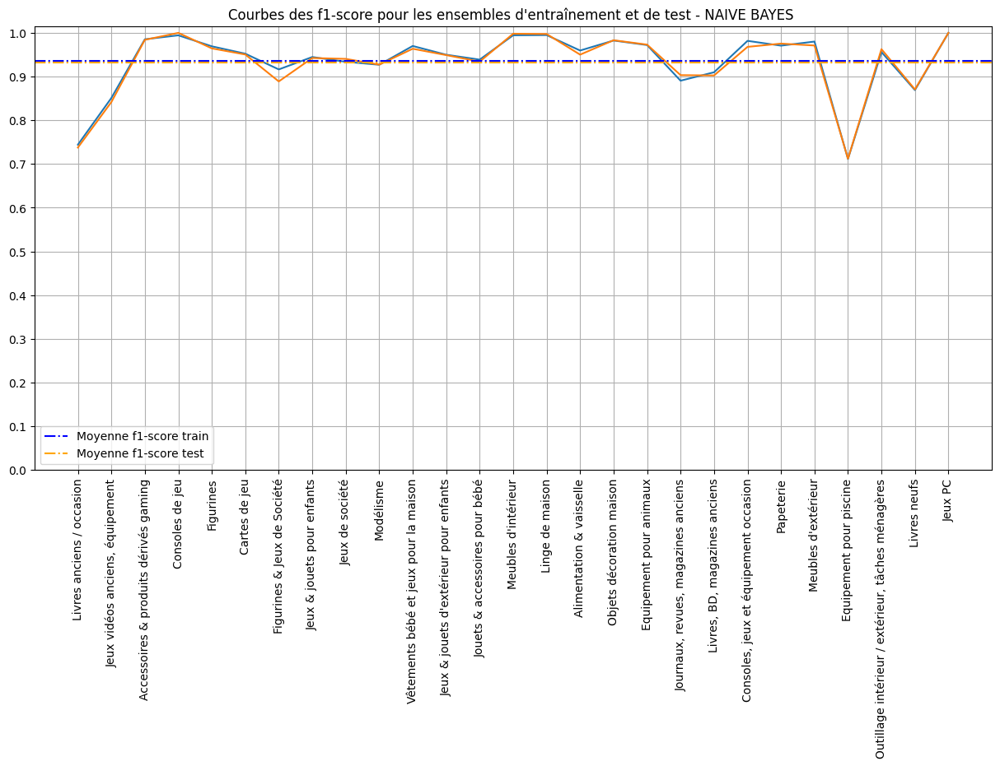

train_mse_result =  217826.98228286635
test_mse_result = 217974.60760955448
best_params: [{'alpha': 1}]


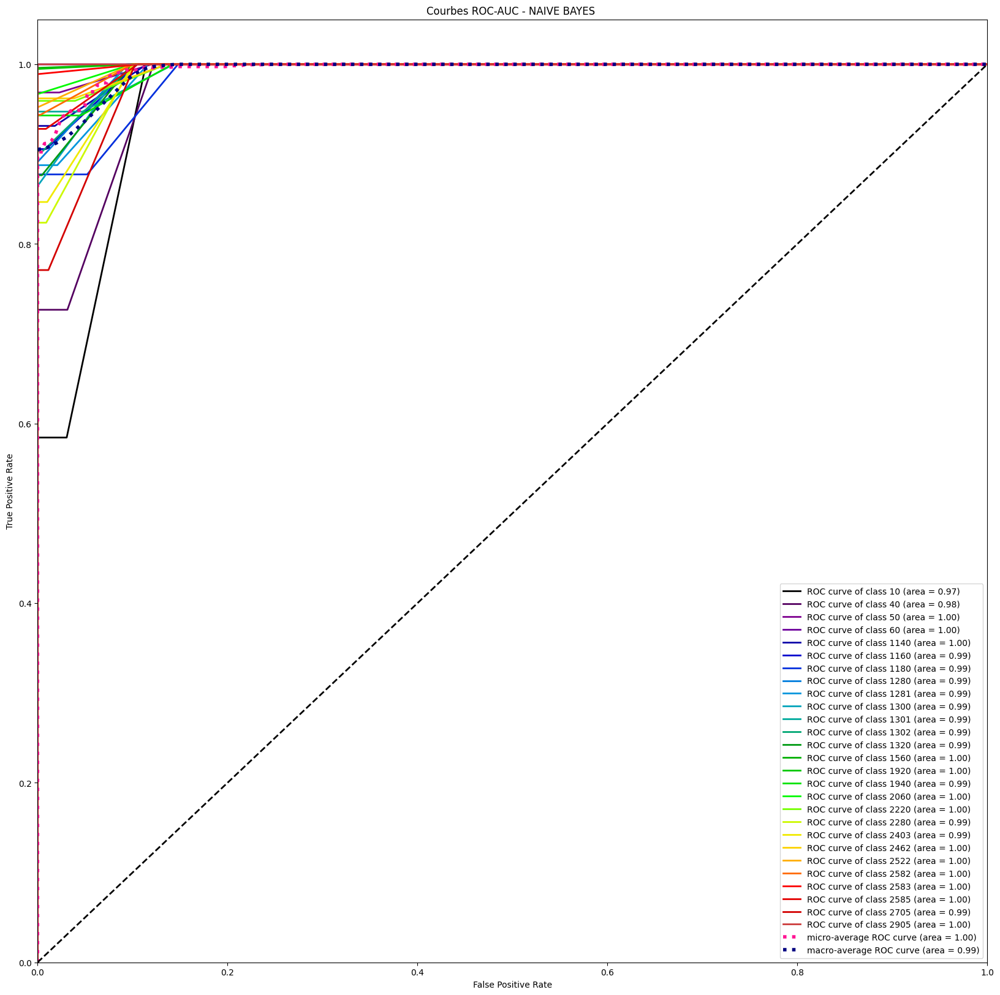

------Confusion Matrix-----------
liste des product codes: [10, 40, 50, 60, 1140, 1160, 1180, 1280, 1281, 1300, 1301, 1302, 1320, 1560, 1920, 1940, 2060, 2220, 2280, 2403, 2462, 2522, 2582, 2583, 2585, 2705, 2905]


,10,40,50,60,1140,1160,1180,1280,1281,1300,1301,1302,1320,1560,1920,1940,2060,2220,2280,2403,2462,2522,2582,2583,2585,2705,2905
10,360,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,256,0,0,0
40,0,343,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,129,0,0,0
50,0,0,309,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,0,0,0
60,0,0,0,150,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1140,0,0,0,0,489,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,36,0,0,0
1160,0,0,0,0,0,691,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,72,0,0,0
1180,0,0,0,0,0,0,124,0,0,0,0,0,0,0,0,0,0,0,0,12,0,0,0,19,0,0,0
1280,0,0,0,0,0,0,0,860,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,105,0,0,0
1281,0,0,0,0,0,0,0,0,332,0,0,0,0,0,0,0,0,0,0,0,0,0,0,42,0,0,0
1300,0,0,0,0,0,0,0,0,0,823,0,0,0,0,0,0,0,0,0,0,0,0,0,129,0,0,0


<Figure size 1500x1500 with 0 Axes>

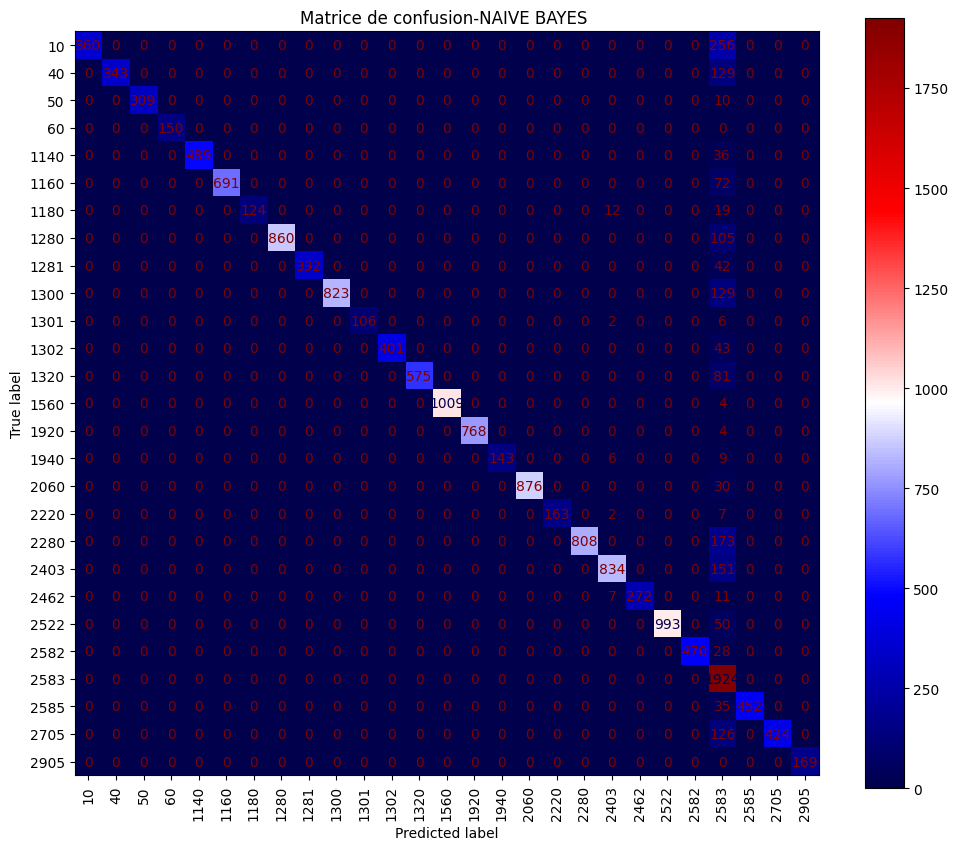

shape------------------------------------------------------
(1, 7)
head------------------------------------------------------


,R2_score_Train,R2_score_Test,f1_score_Train,f1_score_Test,MSE_train,MSE_test,best_params
Model_Name,,,,,,,
NAIVE BAYES,0.903255,0.903665,"[0.7442211055276382, 0.8510882016036655, 0.985...","[0.7377049180327869, 0.8417177914110429, 0.984...",217826.982283,217974.60761,{'alpha': 1}


tail------------------------------------------------------


,R2_score_Train,R2_score_Test,f1_score_Train,f1_score_Test,MSE_train,MSE_test,best_params
Model_Name,,,,,,,
NAIVE BAYES,0.903255,0.903665,"[0.7442211055276382, 0.8510882016036655, 0.985...","[0.7377049180327869, 0.8417177914110429, 0.984...",217826.982283,217974.60761,{'alpha': 1}


<class 'pandas.core.frame.DataFrame'>
Index: 1 entries, NAIVE BAYES  to NAIVE BAYES 
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   R2_score_Train  1 non-null      float64
 1   R2_score_Test   1 non-null      float64
 2   f1_score_Train  1 non-null      object 
 3   f1_score_Test   1 non-null      object 
 4   MSE_train       1 non-null      float64
 5   MSE_test        1 non-null      float64
 6   best_params     1 non-null      object 
dtypes: float64(4), object(3)
memory usage: 64.0+ bytes
info------------------------------------------------------


None

BEST RESULT:
{'mean_fit_time': array([22.57463185]), 'std_fit_time': array([0.2031634]), 'mean_score_time': array([3.89201919]), 'std_score_time': array([0.4118791]), 'param_alpha': masked_array(data=[1],
             mask=[False],
       fill_value='?',
            dtype=object), 'params': [{'alpha': 1}], 'split0_test_score': array([0.89971739]), 'split1_test_score': array([0.90212882]), 'split2_test_score': array([0.90025983]), 'mean_test_score': array([0.90070201]), 'std_test_score': array([0.00103292]), 'rank_test_score': array([1])}


In [8]:
    
# The scaling is aleady choosen before calling execute_tuned_models  
#estim_params = { 'estimator_name' : 'SVC', 'estimator': svm.SVC(), 'params' : {'kernel':('linear', 'rbf'), 'C':[10, 20]}  }

#estim_params = { 'estimator_name' : 'RFC ', 'estimator': RandomForestClassifier() , 'params' : {'max_features': ['sqrt'], 'min_samples_split': [10]}  }

#estim_params = { 'estimator_name' : 'LREG ', 'estimator': LogisticRegression() , 
#                'params' : {'C': [50]}  }

#estim_params = { 'estimator_name' : 'RFC ', 'estimator': RandomForestClassifier() , 
#                'params' : {'max_features': ['sqrt'], 'min_samples_split': [27]} }

#estim_params = { 'estimator_name' : 'KNN ', 'estimator': neighbors.KNeighborsClassifier() , 
#               'params' :  {'n_neighbors': [10]}
#                }

# estim_params = { 'estimator_name' : 'RFC ', 'estimator': RandomForestClassifier() , 'params' : {'max_features': ['sqrt'], 'min_samples_split': [10]}  }

estim_params = { 'estimator_name' : 'NAIVE BAYES ', 'estimator': MultinomialNB() , 'params' : {'alpha': [1]}  }


# autolog model tuning
#mlflow.autolog()
model_tuned, best_cv_results, best_estimator = execute_tuned_models(df, False, X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test, target= target, cv=3,
                                                    estimator_name=estim_params['estimator_name'], estimator=estim_params['estimator'], params=estim_params['params'] )       

get_df_basic_elements( model_tuned, infos_types=['shape', 'head', 'tail', 'info'], actions=['print'])
print("BEST RESULT:")
print(best_cv_results)

In [13]:
# save model to a pickle file
save_model_to_pickle(estim_params['estimator_name'], best_estimator)

In [22]:
# get confusion matrix
y_pred = best_estimator.predict(X_test)
cnf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
n_classes = 27
get_conf_matrix_1(cnf_matrix, n_classes , 'Matrice de confusion-' + estim_params['estimator_name'])


#### E2.2.2 **Tests de prédiction**

1. Exécution du modèle **best_estimator** retourné par la simulation

In [11]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)

# get descrptive cat
data_prdtypecode_label_guess =get_cat_codes_description('category_code_desription.csv')

# TEST #1
# A. Vectorize and transform to Dataframe
my_text_list = []

my_text_list.extend(["<div id='fp_info'>  <div class='prdDesc spacerTopM'> <div class='lnkLightprt'></div>  <span></span>   </div>    <ul class='contributors'><li class='sub'><span class='label'>Editeur&nbsp;: </span><em class='value'>Editions Albert René</em></li><li class='sub'><span class='label'>Saga&nbsp;: </span><em class='value'>Astérix</em></li> <li class='sub'><span class='label'>Parution&nbsp;: </span><em class='value'>22/10/2015</em></li><li class='sub'><span class='label'>Nombre de pages&nbsp;: </span><em class='value'>128</em></li> <li class='sub'><span class='label'>Nombre de livres&nbsp;: </span><em class='value'>1</em></li><li class='sub'><span class='label'>Expédition&nbsp;: </span><em class='value'>1030</em></li><li class='sub'><span class='label'>Dimensions&nbsp;: </span><em class='value'>36.5 x 26 x 1.2</em></li></ul>        <p class='fullDescription clearfix'><strong>Résumé :</strong><br><span class='edito'>Cette édition en grand format (26 x 36,5 cm) du nouvel album LE PAPYRUS DE CESAR comprend 128 pages, avec dos carré toilé et tranchefile. Deux types de papier différents sont utilisés pour réserver le plus bel écrin à une grande variété de créations graphiques. Au programme : l'album en couleur, l'intégrale des crayonnés originaux, et un dossier de 33 pages permettant de découvrir les coulisses de la création du nouvel album avec de nombreux dessins et documents de travail inédits signés Jean-Yves Ferri et Didier Conrad.</span></p>   </div>", 
"Baskets style chaussettes avec finitions en cuir suédé 49. Marque : Boss. Des baskets style chaussettes emblématiques BOSS, confectionnées dans un mélange de matières comprenant du tissu structuré, de la toile et des finitions en cuir suédé. Pour nos articles BETTER BOSS, nous utilisons au moins 60 % de matières premières responsables. Cette pièce est confectionnée dans un tissu contenant au moins 60 % de polyester recyclé. Le polyester recyclé est une fibre synthétique fabriquée à partir de déchets du pétrole tels que les bouteilles usagées en PET." ,
"Figurine Mario + The Lapins Crétins : Sparks Of Hope : Lapin Mario",
"Figurines Mini pingouin en résine 9mm,50 pièces,accessoires de manucure,bricolage,Scrapbook de mariage. Edito Figurines Mini Pingouin En Résine 9mm,50 Pièces,Accessoires De Manucure,Bricolage,Scrapbook De Mariage - Figurine Pingouin. Fabricant : General brand <br/> Description: La livraison effective est soumise au la première image prévaudra; En raison de trop de styles,Les autres photos sont pour référence seulement,Si vous spécifiez les spécifications et les couleurs, Si vous avez des questions, vous pouvez également nous contacter.·Est dispositif intelligent:no;",
"Présentation Couette Chaude 600gr / M² 140x200cm Lavable Ultra Gonflant Douceur Extrême - Couette", 
"Plongez dans le monde mystérieux et palpitant des livres policiers avec Rakuten, votre marketplace privilégiée. Nous avons en effet, pour vous amateurs de suspense et d'intrigue, une sélection impressionnante de romans policiers passionnants, aussi variés que captivants. La catégorie des livres policiers sur notre boutique en ligne est diversifiée afin de satisfaire tous les goûts et tous les lecteurs.Que vous préfériez les thrillers psychologiques, les romans à énigmes, les polars noirs ou les enquêtes de détective, vous n'aurez que l'embarras du choix sur Rakuten.Nos collections comprennent des livres de tous les sous-genres du roman policier pour vous garantir des heures d'évasion et de frisson. Les nouvelles sorties, les best-sellers,les classiques du genre, Rakuten les a tous. Des œuvres incontournables de Sir Arthur Conan Doyle, créateur du légendaire Sherlock Holmes, aux thrillers haletants d'Agatha Christie,reine incontestée du crime. Sans oublier les romans de Mary Higgins Clark et Patricia Cornwell, sans parler des contemporains comme Jo Nesbo et Harlan Coben. Notre sélection comprendégalement une myriade d'auteurs talentueux moins connus, mais tout aussi captivants. Rakuten, c'est aussi l'opportunité d'acheter des livres neufs ou d'occasion. Vous êtes donc sûr detrouver le livre de vos rêves, quels que soient votre budget et vos préférences. Chaque livre d'occasion vendu sur notre site est soigneusement vérifié pour vous assurer une expérience de lecture agréable. Rakuten est le lieu de rencontre par excellence pour tous ceux qui aiment les livres et le mystère. Nous nous engageons à vous offrir une plateforme fiable et pratique pour acheter vos livres policiers préférés. Avec Rakuten, plongez dans un univers de suspense et de mystère, offrez-vous une évasion littéraire, le livre parfait n'est qu'à un clic de distance.Parce que chez Rakuten, chaque histoire compte, et chaque histoire a sa place. ",
"Fabricant : Habitat et jardin  Type de produit : Abri de jardin Matière : Bois Abri de jardin bois 9.4 m²  Lys  - 28 mm : Découvrez l'abri de jardin en épicéa d 'europe du nord en 28 mm  Lys , idéal pour vos espaces extérieurs. Avec ses dimensions de 320 x 298 x 225 cm, cet abri offre un espace généreux pour ranger vos outils et équipements de jardin. Doté d'une porte double avec fenêtre, il combine praticité et esthétique. Fabriqué en Europe, cet abri garantit qualité et durabilité. Ajoutez une touche de charme et de fonctionnalité à votre jardin avec l'abri  Lys . : Abri de jardin en bois Lys. Plancher : Non. Type de montage : Principe d'assemblage par emboitement. Surface intérieure (m²) : 7,42m2. Surface extérieure (m²) : 9,53m2. Intérieures : 272 x 272 cm. Extérieures : 320 x 298 cm. Hors tout : 7,42m2. Hauteur des murs : 184 cm. Hauteur faîtage : 440 cm. Dimensions : 143 x 174 cm. Type : Double. Fenêtre : Oui. Vitrage : Verre de 4 mm. Épaisseur : 28 mm. Origine : Europe. Épaisseur des panneaux de particules / des voliges : OSB de 12 mm. Type de toiture : Panneaux OSB / toitures en feutre bitumineux. : Double porte avec fenêtres intégrées Structure en madriers. Conseils pratiques : Abris à placer sur dalle de béton pour assurer la stabilité structurelle. Les dimensions recommandées de la dalle sont de 310 x 310cm. - Surface à teindre 28 m² - Fournir un traitement fongicide pour chaque pièce avant le montage et l'application de la teinture hydrofuge et résistante aux UV à l'intérieur et à l'extérieur de l'abri. Le feutre bitumineux fourni est une couverture de base temporaire. . Colisage : 1 colis : - 3 x 0,48 x 1,2 m, 450 kg.",
"Console Sony PlayStation 5 Slim Edition Standard Découvrez la nouvelle Console Sony PlayStation 5 Slim Edition Standard. Conçue par Sony, cette console de salon est parfaite pour les amateurs de jeux vidéo recherchant une expérience de jeu de haute qualité.  Fabricant : Sony Gamme de Produits : Sony PlayStation Capacité de stockage : 1 To Couleur : Blanc Poids : 3200 g EAN : 4948872415934 Disponible à partir du : 8 novembre 2023 Offrant une capacité de stockage de 1 To, la PlayStation 5 Slim Edition Standard vous permet de télécharger et de sauvegarder une multitude de jeux. Son design élégant et compact en blanc s'intégrera facilement dans votre espace de vie.  Ne manquez pas l'occasion de vivre une expérience de jeu immersive et puissante avec la PlayStation 5 Slim Edition Standard, la console iconique qui continue de redéfinir les standards du jeu vidéo.",
"Canapé 3/4 places beige sable. Fabricant : Maisons du monde. Type de produit : Canapé. Si vous rêvez d'un salon contemporain et confortable, le canapé 3/4 places beige sable LILO est fait pour vous !Ce canapé est un produit volumineux. Assurez-vous qu'il est adapté au passage des portes de votre intérieur (dimensions du colis: 242x104x77 cm)On adore son look original, associé à un coloris sobre qui trouvera facilement sa place dans votre intérieur.Tout en tissu et robuste, ce canapé sera la pièce maîtresse de votre salon. L'assise moelleuse de ce canapé beige vous enveloppera pour de délicieux moments de détente.A vous les soirées tout confort !Découvrez nos conseils pour bien choisir votre canapé.",
"Proscenic 850T - Aspirateur Robot Laveur de Sol connecté 2 en 1 - Aspiration puissante 3000Pa - Débit d'eau Réglable - Autonomie 110 min - Navigation Gyroscope - Contrôle avec Alexa/App/Siri. Aspirateur robot laveur 2 en 1 – Aspiration et lavage – 3000 Pa – Détection du Tapis – 110 min d'autonomie  – Bande magnétique – Contrôle avec Alexa/App/Siri/IFTT",
"Brandt BPI6315B - Table de cuisson à induction - 3 plaques de cuisson - Niche - largeur : 56 cm - profondeur : 49 cm - noir. Fabricant : Brandt Référence fabricant : BPI6315B Type de produit : Plaque de cuisson Energie : Induction Couleur : Noir Nb foyers table de cuisson : 3 - Foyer de 28cm Avec son foyer de 28cm auto-adaptable et sa puissance maximum de 3600W, toutes les cuissons sont possibles, du mijotage le plus doux aux fritures les plus vives.  - Minuterie Votre table vous offre 3 minuteries de 1 à 99 minutes avec arrêt automatique.C'est la garantie du juste temps de cuisson et de réussite pour toutes les préparations.  - Sécurité 10 points Sécurité intégrale : anti-surchauffe, anti-débordement, témoins de chaleur résiduelle, verrouillage du clavier, automatique-stop, détection des récipients, des petits objets,de la faible intensité du survoltage et d'une mauvaise connexion.  Les + produit  UNE EXPERTISE AVANT-GARDISTE  L'induction : Le meilleur de la cuisson Brandt a développé et lancé la technologie de l'induction à la fin des années 1980 et a bouleversé le marché des plaques de cuisson puisque, aujourd'hui, l'induction représente près de 60 % des ventes en valeur (Source GFK).  Une répartition optimale de la chaleur dans la casserole Brandt a doté ses inducteurs d'une technologie exclusive qui rend la cuisson parfaitement homogène sur toute la surface du récipient. L'eau bout uniformément dans la casserole.  L'ALLIANCE DE L'EFFICACITÉ ET DU CONFORT Efficacité et précision du résultat de cuisson Les touches sensitives de notre plaque induction et les différentes allures de chauffe vous permettent de réaliser vos plats avec la même efficacité et précision que les professionnels. Pour gagner en rapidité, la fonction Booster vous permet d’accéder directement à la puissance maximale.  Pour une cuisson maîtrisée Les tables induction Brandt sont dotées d’une minuterie par foyer pour programmer la durée de cuisson et couper automatiquement le foyer à la fin du temps imparti sans surveillance.  UNE SÉCURITÉ SANS FAILLES LE PACK 10 SÉCURITÉS Toutes nos plaques induction disposent du pack 10 sécurités et vous assurent une cuisine sereine et sans danger pour passer des moments de pur plaisir.  Ce pack comprend :  - L’indicateur de chaleur résiduelle pour vous éviter de toucher les zones encore chaudes (après une utilisation intensive). - La sécurité « petits objets » qui permet de ne pas chauffer un objet de petite dimension (cuillère, bague...). - La protection en cas de débordement qui éteint automatiquement la table - L’Auto-Stop system qui coupe automatiquement une zone de cuisson que vous avez oublié d’éteindre. - Le verrouillage clavier possible à l’arrêt ou en cours de cuisson. - La détection automatique de casseroles. - L’anti-surchauffe récipient : cette sécurité brevetée et exclusive limite la température sous le foyer à 300 °C. Elle permet de réguler la chaleur d’un récipient vide pour ne pas le détériorer. Elle évite par exemple tout risque d’auto-inflammation de l’huile. - La détection faible voltage, mauvaise connexion et surtension.     Caractéristiques techniques     Caractéristiques techniques principales  Type de table Induction Largeur en cm 60 Type d'énergie Electricité   Les foyers  Nombre de foyers 3 Position de l'élément chauffant Avant Gauche Position de l'élément chauffant N°2 Arrière Gauche Position de l'élément chauffant N°3 Centre Droit Type d'élément chauffant Induction Type d'élément chauffant foyer N°2 Induction Type d'élément chauffant foyer N°3 Induction Dimension de l'élément chauffant (mm) 180 Dimension de l'élément chauffant en mm du foyer N°2 160 Dimension de l'élément chauffant en mm du foyer N°3 280 Puissance maximum de l'élément chauffant en W 2800 Puissance maximum de l'élément chauffant en Wdu foyer N°2 2000 Puissance maximum de l'élément chauffant en w du foyer N°3 3600 Minuterie Electronique 99 min Minuterie sur foyer N°2 Electronique 99 min Minuterie sur foyer N°3 Electronique 99 min   Commandes  Type de commandes Touches Type de régulation d'énergie Electronique Minuterie Oui   Branchements Electriques  Puissance maxi électrique en kW 7.2 Intensité en A 32 Tension en V 220-240 Fréquence en Hz 50/60 Longueur du cordon en cm 130 Type de prise électrique Sans   Sécurités  Témoin de mise sous tension Oui Témoin de chaleur Résiduelle Individuel Verrouillage centralisé 1 Touche centralisée Arrêt d'urgence Pack 10 sécurités Détection de récipients Oui   Dimensions  Dimensions du produit emballé en mm 140X750X600 Dimensions d'encastrement en mm 560X490 Dimensions hors tout HxLxP au dessus du plan de travail en mm 4X580X510 Dimensions hors tout HxLxP au dessous du plan de travail en mm 56X558X488 Poids net en kg 10.1 Poids brut en kg 11 Description table induction : 3 foyers dont 1 zone ø 28 cm 3,6 kw 9 niveaux de puissance 3 minuteries 10 niveaux de sécurité : anti-surchauffe, verrouillage, clavier, auto-stop, anti-débordement, témoins de chaleur résiduelle, détection de récipients, détection de petits ustensiles, détection faible voltage, détection mauvaise connexion et détection surtension Commandes sensitives Barette avant inox sérigraphiée.  Caractéristiques : 3 foyer(s) : droit ø 28 cm 3,6 kW / gauche avant ø 18 cm 2,8 kW / gauche arrière ø 16 cm 2 kW bandeau : frontal commandes : sensitives puissance de raccordement : 7200 w alimentation : 220-240 V / 50 Hz / 32 A connecté : non disponibilité des pièces détachées : 10 ans (donnée constructeur) cordon électrique : fourni (130 cm) sans fiche coloris table : noir bordure : profil avant inox dimensions hors tout (lxhxp) : 58 x 5,9 x 51 cm dimensions encastrement (lxhxp) : 56 x 5,5 x 49 cmpoids net : 10,1 kg lieu de fabrication : origine France Avec son foyer de 28 cm auto-adaptable et sa puissance maximum de 3600 W, toutes les cuissons sont possibles, du mijotage le plus doux aux fritures les plus vives.  Garantie du juste temps de cuisson et de réussite pour toutes les préparations Sécurité intégrale: anti-surchauffe, anti-débordement, témoins de chaleur résiduelle, verrouillage du clavier, automatique-stop, détection des récipients, des petits objets,de la faible intensité du survoltage et d'une mauvaise connexion  Informations complémentaires BRANDT Plaque induction BPI6315B",
"Astérix aux Jeux Olympiques - Édition 2 DVD. Réalisateur : Frédéric Forestier Editeur : Pathé Parution : 22/08/2008 Nombre de DVD/VHS : 2 Classification : Fantastique - Péplum - Comédie Saga : Astérix Acteurs : Gérard Depardieu - Clovis Cornillac - Benoît Poelvoorde - Alain Delon - Vanessa Hessler - Franck Dubosc - José Garcia - Stéphane Rousseau - Jean-Pierre Cassel - Élie Semoun - Alexandre Astier Synopsis: Nous sommes en 50 avant Jésus-Christ, toute la Gaule est occupée par les romains... Toute ? Non ! Pour ces nouvelles aventures, nos irréductibles gaulois ont fait le déplacement jusqu'en Grèce pour participer aux Jeux Olympiques. Une occasion de plus pour Astérix et Obélix de mettre une bonne raclée aux romains. Mais le machiavélique Brutus, fils de César, a plus d'un tour dans son sac... il va y avoir du sport !  Bonus : DVD 1 : - Galerie de photos - Teasers - Bandes-annonces  DVD 2 : - Making of (90') - AvéTV, la télé de l'empire - Les sportifs (10') - Avant-première - Bêtisier - Galerie des personnages (30')   Descriptif technique Astérix Aux Jeux Olympiques - Édition 2 Dvd de Frédéric Forestier - DVD Zone 2 Oeuvre Nationalité de l'oeuvre	France Année de sortie en salles	2007 Public	Tous Couleur	Couleur Durée de la vidéo	112 Support Type de support	DVD Zone 2 Zone	Zone 2 Format d'image	2.35 Format vidéo	16/9 Langues Audio Dolby Digital	Français 5.1 Langues Audio DTS	Français 5.1 Sous-titres malentendants	Français"
])

# test a saved model into a pickle (ça ne fonctionne pas ?)
#get_predictions(model_RFC, df, my_text_list)

probas = get_predictions(best_estimator, df, my_text_list)




12 texts to be predicted:
La prédiction pour mon texte 
<div id='fp_info'>  <div class='prdDesc spacerTopM'> <div class='lnkLightprt'></div>  <span></span>   </div>    <ul class='contributors'><li class='sub'><span class='label'>Editeur&nbsp;: </span><em class='value'>Editions Albert René</em></li><li class='sub'><span class='label'>Saga&nbsp;: </span><em class='value'>Astérix</em></li> <li class='sub'><span class='label'>Parution&nbsp;: </span><em class='value'>22/10/2015</em></li><li class='sub'><span class='label'>Nombre de pages&nbsp;: </span><em class='value'>128</em></li> <li class='sub'><span class='label'>Nombre de livres&nbsp;: </span><em class='value'>1</em></li><li class='sub'><span class='label'>Expédition&nbsp;: </span><em class='value'>1030</em></li><li class='sub'><span class='label'>Dimensions&nbsp;: </span><em class='value'>36.5 x 26 x 1.2</em></li></ul>        <p class='fullDescription clearfix'><strong>Résumé :</strong><br><span class='edito'>Cette édition en grand f

In [58]:
probas_1 = np.asarray(probas)
print(probas)

[array([[0.11838596, 0.05561756, 0.02533901, ..., 0.0273737 , 0.03894898,
        0.02869983],
       [0.11838596, 0.05561756, 0.02533901, ..., 0.0273737 , 0.03894898,
        0.02869983],
       [0.11838596, 0.05561756, 0.02533901, ..., 0.0273737 , 0.03894898,
        0.02869983],
       ...,
       [0.0379566 , 0.03048076, 0.01996596, ..., 0.0294931 , 0.03347414,
        0.01068194],
       [0.0379566 , 0.03048076, 0.01996596, ..., 0.0294931 , 0.03347414,
        0.01068194],
       [0.0379566 , 0.03048076, 0.01996596, ..., 0.0294931 , 0.03347414,
        0.01068194]])]


2. Test

In [80]:
print(X_train.shape)

(65812, 2700)


In [84]:


my_text ="Je souhaite acheter un cadeau pour l'anniversaire de ma fille comme une poupée, un jouet manuel ou un jeu de console par exemple."

vect = CountVectorizer()
# get extracted tokens
X_train_vectorized = vect.fit_transform(X)
#X_test_vectorized = vect.transform(X_test)
# get corresponding vocabulary
vocab = vect.vocabulary_
print("Vocabulary :-----------------------------------")
print(len(vocab), vocab)


Vocabulary :-----------------------------------
1907 {'actes': 12, 'age': 26, 'american': 48, 'ammareal': 50, 'amour': 51, 'ancien': 57, 'annee': 67, 'applications': 79, 'art': 93, 'associationsltbrgt': 109, 'audio': 120, 'aventures': 134, 'best': 168, 'bibliothèque': 172, 'bibliothèques': 174, 'business': 221, 'caritatives': 266, 'caritativesltbrgt': 267, 'catalogue': 284, 'chemins': 311, 'children': 316, 'coeur': 343, 'commentaire': 361, 'cours': 425, 'couverture': 431, 'design': 460, 'droit': 514, 'editeur': 552, 'education': 554, 'empire': 560, 'etat': 594, 'europe': 598, 'fournis': 690, 'guerre': 755, 'guide': 758, 'histoire': 787, 'homme': 794, 'illustrations': 810, 'international': 842, 'jean': 864, 'journal': 880, 'law': 908, 'lettres': 920, 'ligne': 928, 'livre': 944, 'livres': 946, 'louis': 959, 'love': 961, 'magazine': 974, 'maison': 987, 'management': 990, 'manuel': 1000, 'marcel': 1004, 'moderne': 1082, 'monde': 1092, 'mort': 1104, 'musique': 1124, 'net': 1142, 'notebook':

### E2.3  **GridSearchCV** : Exécution de plusieurs simulations

In [15]:

# Exemple :
list_models = [
            {'name': 'NAIVE BAYES', 
                'estimator': MultinomialNB(), 
                'params': {'alpha': [1]}
                }
            ]

''''
list_models = [{'name': 'SVC', 
                'estimator': svm.SVC(), 
                'params': {'kernel':['rbf'], 'C':[10]}  
                },
            {'name': 'NAIVE BAYES', 
                'estimator': MultinomialNB(), 
                'params': {'alpha': [1, 5]}
                },
                {'name': 'RBF', 
                'estimator': ensemble.RandomForestClassifier(), 
                'params': {'max_features': ["sqrt"],
                        'min_samples_split': [10]}
                }
            ]
'''

tuned_models = create_many_models_tuned(X_train, X_test, y_train, y_test, target, cv= 3, list_models = list_models)

display(tuned_models)


-----------------------------------------------------------------------
X_train.shape - X_test.shape - len(y_train) - len(y_test)
(65812, 8100) - (16453, 8100) - 65812 - 16453

-----------------------------------------------------------------------
                                        0
name                                  SVC
estimator                           SVC()
params     {'kernel': ['rbf'], 'C': [10]}
-----------------------------------------------------------------------

Fitting 3 folds for each of 1 candidates, totalling 3 fits


KeyboardInterrupt: 

### E2.4 CrossValidation using K-Folds

## E3. **LCEClassifier** : Simulation/Exécution des modèles

In [5]:
from Lce import LCEClassifier
from sklearn.metrics import accuracy_score

clf = LCEClassifier(n_estimators=2, n_jobs=-1, random_state=0)
clf.fit(X_train, y_train)

def excute_LCEClassifier(df, X_train, X_test, y_train, y_test):
    df = df.dropna()
    print("df.shape :", df.shape)
    X = df.drop(['prdtypecode', 'prdtypelabelguess'], axis = 1)
    target = df['prdtypecode']
    X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=.2)

    if scale == True:
        print("/////////////X_train a X_test scaled/////////////////////////////")
        scaler = preprocessing.StandardScaler()
        print('X_train BEFORE scaling :')
        display(X_train.head())
        # apply the scaler to X_train by transform method to get X_train_scaled
        X_train_scaled = scaler.fit_transform(X_train)
        print('X_train_scaled (after scaling):')
        display(pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index).head())

        X_test_scaled = scaler.transform(X_test)
        print('X_test_scaled (after scaling):')
        display(pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index).head())

        # proceed now to apply LCEClassifier
        clf = LCEClassifier(n_estimators=2, n_jobs=-1, random_state=0)
        clf.fit(X_train_scaled, y_train)
        y_pred = clf.predict(X_test_scaled)
        LCE_accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
        print("accuracy of LCE Classifier={:.f}%", round(LCE_accuracy*100, 2))
        get_conf_matrix(y_pred=y_pred, y_test=y_test, title="CONF Matrix - LCE Classifier")
    else:
        print("/////////////X_train a X_test NOT scaled/////////////////////////////")
        #proceed now to apply LCEClassifier
        clf = LCEClassifier(n_estimators=2, n_jobs=-1, random_state=0)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        LCE_accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)
        print("accuracy of LCE Classifier={:.f}%", round(LCE_accuracy*100, 2))
        get_conf_matrix(y_pred=y_pred, y_test=y_test, title="CONF Matrix - LCE Classifier")
        

excute_LCEClassifier(df=df, scale=True)


ModuleNotFoundError: No module named 'lce'

## E4.  **GradientBoostingClassifier** : Simulation/Exécution des modèles


### E4.1 Helper functions

In [7]:


print("ref: https://xgboost.readthedocs.io/en/stable/parameter.html")

def execute_gboost(df, scale= False):
    df = df.dropna()
    print("df.shape :", df.shape)
    X = df.drop(['prdtypecode', 'prdtypelabelguess'], axis = 1)
    target = df['prdtypecode']
    
    print('X=')
    display(X)
    
    
    # liste des colonnes à dichotomiser :
    features_matrix = pd.get_dummies(X)
    display(features_matrix)
    
    # get 10% for validation set and put the 90% in (X, y) set
    X, X_valid, y, y_valid = train_test_split(features_matrix, target, test_size=.1)
    # select from  the (X, y) set, 20% for testing set and 80% for training set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
    print("X_train.shape", X_train.shape)
    print("X_test.shape", X_test.shape)
    print("X_valid.shape", X_valid.shape)
    
    print('X_train=')
    display(X_train)
    
    # defione corresponding DMatrix
    train = xgboost.DMatrix(X_train, label=y_train)
    test =  xgboost.DMatrix(X_test, label=y_test)
    valid =  xgboost.DMatrix(X_valid, label=y_valid)
    
    #params = {'booster' : 'gbtree', 'learning_rate' : 1, 'objective' : 'binary:logistic'}
    params = {'booster' : 'gblinear', 'learning_rate' : 1, 'lambda': 10, 'alpha': 10}
    xgb  = xgboost.train(params=params, dtrain=train, num_boost_round=700, early_stopping_rounds=15, 
                        evals=[(train, 'train'), (test, 'eval')])
    
    # plot importance of each feature
    
    plot_importance(xgb, height=100, title="XGB features importance curves for each word", max_num_features=30, grid=True);
    plt.figure(figsize=(100, 20))
    plt.show()
    
    
    bst_cv = xgboost.cv(params= params, dtrain= train, nfold=3, num_boost_round=100, early_stopping_rounds=50)
    display(bst_cv)
    
    
    preds = xgb.predict(test)
    display(preds, len(preds))
    xgbpreds = pd.Series(np.where(preds > .5, 1, 0))
    print("Prdictions scores:")
    display(xgbpreds, len(xgbpreds))
    
    get_conf_matrix(y_pred= xgbpreds, y_test= pd.Series(y_test), xlabel='Real values', ylabel='True values',
                    target= target, title="Matrice de confusion entre xgbpreds et les labels de l'ensemble de test")
    
    print("Erreur du modèle:", xgb.eval(valid))



def execute_gboost_bis(X_train, X_test, y_train, y_test, target):
    # before encode y_train and y_test 
    # réf. https://stackoverflow.com/questions/71996617/invalid-classes-inferred-from-unique-values-of-y-expected-0-1-2-3-4-5-got
    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    y_train = le.fit_transform(y_train)
    y_test = le.fit_transform(y_test)
    
    
    print('X_train=')
    display(X_train.head())
    print('y_train=')
    display(y_train)
    
    xgb_model = xgboost.XGBClassifier()
    xgb_model.fit(X_train, y_train)
    
   
    # plot importance of each feature  
    plt.figure(figsize=(20, 15))
    fg, ax =plt.subplots(1,1, figsize=(20,15))
    plot_importance(xgb_model, height=100, title="XGB features importance curves for each word", 
                    max_num_features=30, grid=True, ax=ax)
    plt.show()

    
    y_pred = xgb_model.predict(X_test)
    display("len(y_pred)=", len(y_pred))
    xgbpreds = pd.Series(np.where(y_pred > .5, 1, 0))
    print("Predictions scores:")
    display(xgbpreds)
    
    get_conf_matrix(y_pred= xgbpreds, y_test= pd.Series(y_test), xlabel='Real values', ylabel='True values',
                    target= target, title="Matrice de confusion entre xgbpreds et les labels de l'ensemble de test")



execute_gboost_bis(X_train, X_test, y_train, y_test, target=target)


ref: https://xgboost.readthedocs.io/en/stable/parameter.html
X_train=


d:\Python312\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
d:\Python312\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,actes,action,adventures,afrique,age,album,allemand,america,american,amis,...,véhicules,wars,way,windows,écran,édition,éléments,épique,équipe,île
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


y_train=


array([23, 18,  7, ..., 15, 16, 23], dtype=int64)

AttributeError: 'DataFrame' object has no attribute 'dtype'

### E4.2 Execution

In [30]:
X = df.drop(['prdtypecode', 'prdtypelabelguess'], axis = 1)
target = df['prdtypecode']
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=.2)


print("/////////////X_train a X_test scaled/////////////////////////////")
scaler = preprocessing.StandardScaler()
print('X_train BEFORE scaling :')
display(X_train.head())
# apply the scaler to X_train by transform method to get X_train_scaled
X_train_scaled = scaler.fit_transform(X_train)
print('X_train_scaled (after scaling):')
display(pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index).head())

X_test_scaled = scaler.transform(X_test)
print('X_test_scaled (after scaling):')
display(pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index).head())

# Define the hyperparameter grid
#param_grid = {'booster' : 'gblinear', 'learning_rate' : 1, 'lambda': 2, 'alpha': .5}

param_grid = {
    'learning_rate' : 1, 
    'lambda': 2, 
    'alpha': .5,
    'min_child_weight': [4, 5],
    'gamma': [i / 10.0 for i in range(3, 6)],
    'subsample': [i / 10.0 for i in range(6, 11)],
    'colsample_bytree': [i / 10.0 for i in range(6, 11)],
    'max_depth': [2, 3, 4]
}

# Create the XGBoost model object
xgb_model = xgboost.XGBClassifier( n_jobs=1, nthread=None,
       objective='multi:softprob', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

# Create the GridSearchCV object
grid_search = GridSearchCV(xgb_model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train_scaled, y_train)

# Print the best set of hyperparameters and the corresponding score
print("Best set of hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

y_pred = grid_search.predict(y_test)

get_conf_matrix(y_pred= y_pred, y_test= y_test, xlabel='Real values', ylabel='True values',
                target= target, title="Matrice de confusion XGBOOST")
    

/////////////X_train a X_test scaled/////////////////////////////
X_train BEFORE scaling :


,actes,afrique,age,american,ammareal,amour,analysis,ancien,annee,applications,...,vidéo_x.5,ville_x.1,vista,vive,vram,windows,xp,édition_x.3,également_x.9,équipe
43925,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
81202,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13474,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11273,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45595,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


X_train_scaled (after scaling):


,actes,afrique,age,american,ammareal,amour,analysis,ancien,annee,applications,...,vidéo_x.5,ville_x.1,vista,vive,vram,windows,xp,édition_x.3,également_x.9,équipe
43925,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
81202,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
13474,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
11273,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
45595,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017


X_test_scaled (after scaling):


,actes,afrique,age,american,ammareal,amour,analysis,ancien,annee,applications,...,vidéo_x.5,ville_x.1,vista,vive,vram,windows,xp,édition_x.3,également_x.9,équipe
78644,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
68357,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
33014,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
80704,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017
22793,-0.014056,-0.008335,-0.013085,-0.012328,-0.021622,-0.014702,-0.012328,-0.017508,-0.012328,-0.011253,...,-0.047666,-0.028523,-0.050751,-0.03091,-0.025908,-0.07059,-0.049496,-0.027541,-0.035553,-0.027017


TypeError: Parameter grid for parameter 'booster' needs to be a list or a numpy array, but got 'gblinear' (of type str) instead. Single values need to be wrapped in a list with one element.

#### B. Hyperparameters tuning

In [13]:

#////////////////////////////////////////////////////////////
# B. Hyperparameters tuning
#////////////////////////////////////////////////////////////

param_grid = {
    'learning_rate': [0.1, 1],
    'max_depth': [3, 5, 7],
    'n_estimators': [10, 50]
}

# Create the XGBoost model object
xgb_model = xgboost.XGBClassifier()

# Use stratified k-fold cross-validation to tune the hyperparameters
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
grid_search = GridSearchCV(xgb_model, param_grid, cv=cv)
# we have to start target labeling from 0, otherwise XGBOOST doesn't work !
# (https://stackoverflow.com/questions/71996617/invalid-classes-inferred-from-unique-values-of-y-expected-0-1-2-3-4-5-got)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(target)

grid_search.fit(X=X, y=y_train)

# Print the best hyperparameters
print(f'Best learning rate: {grid_search.best_params_["learning_rate"]}')
print(f'Best max depth: {grid_search.best_params_["max_depth"]}')
print(f'Best number of estimators: {grid_search.best_params_["n_estimators"]}')



Best learning rate: 1
Best max depth: 7
Best number of estimators: 50


#### C. Model evaluation based on best params

In [16]:

#////////////////////////////////////////////////////////////
# C. Model evaluation based on best params to pass as parameters below
#////////////////////////////////////////////////////////////
# Define the model
model = xgboost.XGBClassifier(learning_rate=10, max_depth=20, n_estimators=100)

# Fit the model to the training data
model.fit(X_train_scaled, y_train)

# Make predictions on the test data
le = LabelEncoder()
y_train = le.fit_transform(y_train)
model.fit(X_train_scaled, y_train)

# Print the classification report
print(classification_report(y_test, y_pred))

# CM
get_conf_matrix(y_pred= y_pred, y_test= y_test, xlabel='Real values', ylabel='True values',
                target= target, title="Matrice de confusion XGBOOST")

XGBoostError: [18:46:27] C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\data\data.cc:508: Check failed: this->labels.Size() % this->num_row_ == 0 (16453 vs. 0) : Incorrect size for labels.

In [ ]:
#////////////////////////////////////////////////////////////
# D. variable importance graphic
#////////////////////////////////////////////////////////////


## E5. Réduction de dimensions

### E5.1 variance threshold

>set threshold value and test - ***Les résultats obtenus basé sur le seuil de variance, ne sont pas concluants - à abandonner***

In [40]:
# display(X.describe())
THRESHOLD = 0.04
new_X = get_X_with_weak_features_variance(X, dev_threshold=THRESHOLD)
X = new_X
print("X.shape=", X.shape)
print("target.shape=", target.shape)
display(X)
print(type(X))
print(type(target))


array([False, False, False, ..., False, False, False])

number of words with weak variance: 2505
words to keep :


Index(['charge_x', 'console_x', 'jeu_x', 'nintendo_x', 'batterie_x', 'bois_x',
       'bébé', 'cadeau_x', 'drone', 'enfant_x',
       ...
       'disque', 'espace_x', 'ghz_x', 'intel', 'jeu_x', 'mémoire_x',
       'processeur', 'ram', 'système_x', 'windows'],
      dtype='object', length=195)

words to keep variance :


charge_x     0.044236
charge_x     0.000729
charge_x     0.029228
charge_x     0.074630
charge_x     0.014256
               ...   
système_x    0.013136
système_x    0.042107
système_x    0.013437
système_x    0.051094
windows      0.122795
Length: 704, dtype: float64

X.shape= (82265, 704)
target.shape= (82265,)


,charge_x,charge_x,charge_x,charge_x,charge_x,charge_x,console_x,console_x,console_x,jeu_x,...,mémoire_x,mémoire_x,processeur,ram,système_x,système_x,système_x,système_x,système_x,windows
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82260,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0
82261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0
82262,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
82263,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


>Plot Graph

In [41]:

# plot variances graph
X.plot(grid=True, figsize=(40, 15))
plt.legend(loc='best')
plt.show()


KeyboardInterrupt: 

### E5.2 LLE reduction

In [34]:
lle = LocallyLinearEmbedding(n_components=2, n_neighbors=10, max_iter=3, random_state=42, method='modified' )
X_LLE = lle.fit_transform(X)

display(X_LLE)
print(X_LLE.shape[0], ',', X_LLE.shape[1])

x = X_LLE[:,0]
y = X_LLE[:,1]

#plot_3D_graph_of_features_reduction(X, x= x, y= y, width=800, height=600, title="3D graph of base data X")

d:\Python312\Lib\site-packages\sklearn\manifold\_locally_linear.py:444: RuntimeWarning: divide by zero encountered in divide
  tmp[:, :nev] /= evals + reg[:, None]
d:\Python312\Lib\site-packages\sklearn\manifold\_locally_linear.py:454: RuntimeWarning: invalid value encountered in divide
  rho = evals[:, n_components:].sum(1) / evals[:, :n_components].sum(1)
d:\Python312\Lib\site-packages\sklearn\manifold\_locally_linear.py:462: RuntimeWarning: invalid value encountered in divide
  eta_range = evals_cumsum[:, -1:] / evals_cumsum[:, :-1] - 1


MemoryError: Unable to allocate 50.4 GiB for an array with shape (82265, 82265) and data type float64

### E5.3 UMAP reduction (max : 2 dims !)

In [55]:
import umap.umap_ as umap

umap_model = umap.UMAP(n_neighbors=15, min_dist=.01, n_components=2)
embedding = umap_model.fit_transform(X)


In [53]:
display(embedding)
display(embedding.shape)

array([[ 3.0566654 ,  4.998656  , -3.3881092 , ..., -0.94875705,
         5.5261846 ,  7.5427847 ],
       [ 3.1529076 ,  4.213211  , -3.1690447 , ...,  0.04254115,
         5.4258895 ,  6.8172746 ],
       [ 2.3204362 ,  3.4957254 , -3.5688164 , ..., -0.11255435,
         5.0904975 ,  6.9220486 ],
       ...,
       [ 7.7686963 ,  4.346167  ,  5.0628223 , ...,  1.1542557 ,
         4.8811493 ,  2.7273211 ],
       [ 6.6866364 ,  4.9882455 ,  5.8825917 , ...,  3.364884  ,
         4.8429284 ,  1.2250286 ],
       [ 7.639985  ,  4.3473945 ,  5.0696287 , ...,  1.3990464 ,
         4.8198504 ,  2.755313  ]], dtype=float32)

(82265, 10)

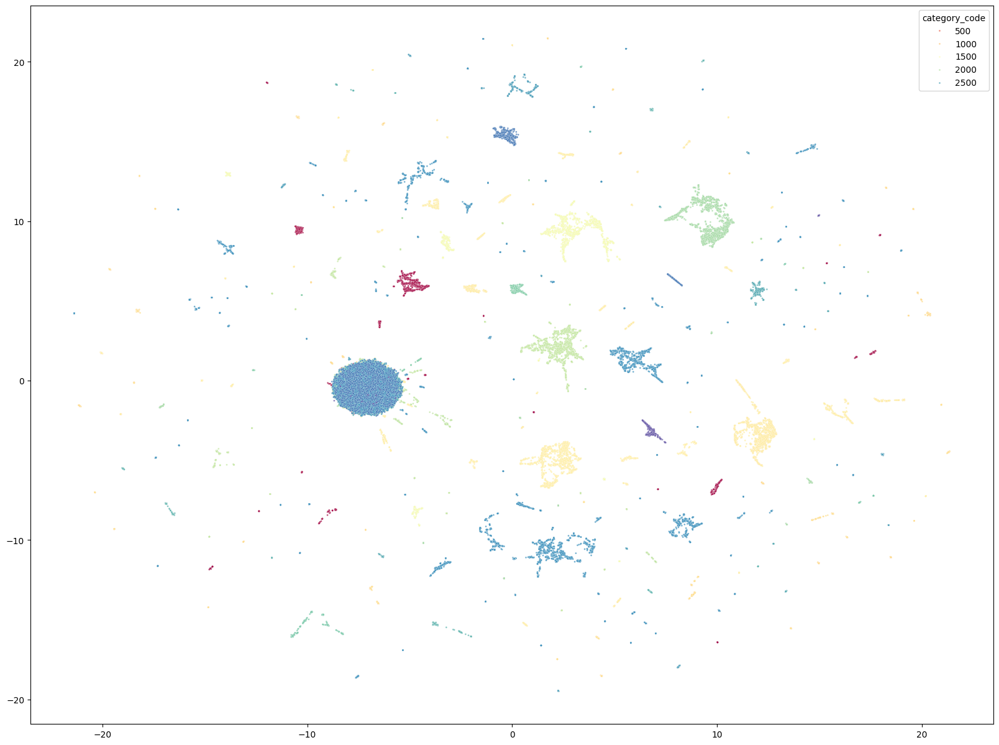

In [45]:
fig, ax = plt.subplots(1, 1, figsize = (20,15))
g = sns.scatterplot(x=embedding[:,0], y=embedding[:,1], hue=target, alpha=.7, s=4, palette=plt.cm.Spectral, ax=ax)
plt.show()

ValueError: Plotting is currently only implemented for 2D embeddings

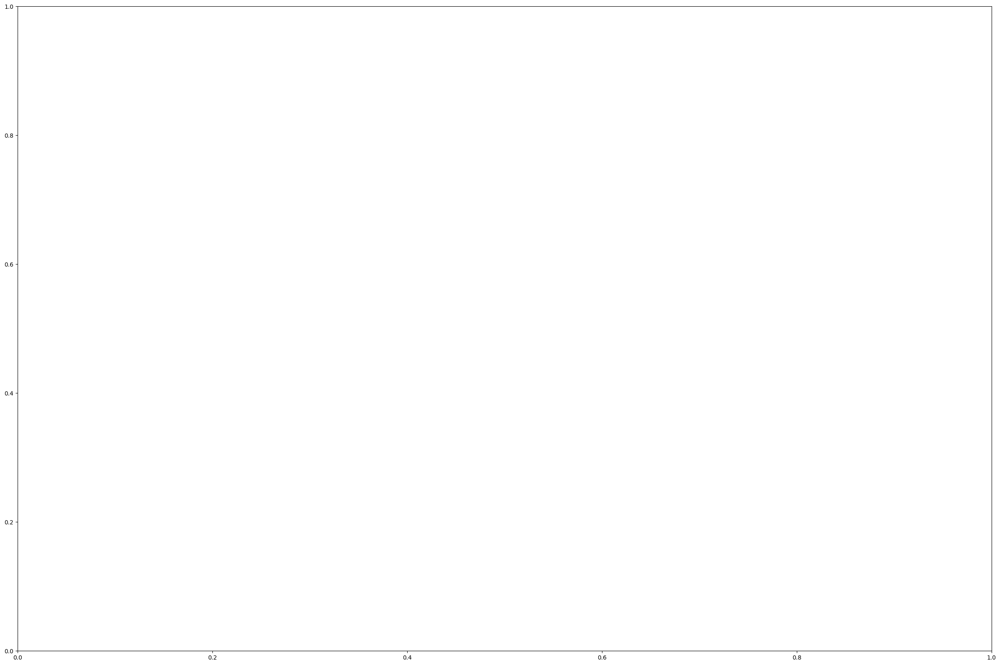

In [54]:
# using umap plot
import umap.plot


fig, ax = plt.subplots(1,1, figsize=(30,20))
umap.plot.points(umap_model, labels=target, width=1000, height=800, ax=ax)
plt.show()

In [63]:
print(embedding.shape)
print(X.shape)
plot_3D_graph_of_features_reduction(X, x= embedding[:, 0], y=embedding[:, 1], width=1200, height=1000, title="3D componantes graph")

(82265, 2)
(82265, 270)


### E5.3 RFE (Recursive Feature Elimination)

#### E5.3.1 with LinearRegression

In [35]:
crossval = KFold(n_splits = 5, random_state = 2, shuffle = True) 
lm = LinearRegression() 
rfecv = RFECV(estimator=lm, cv=crossval, step=1) 

display(X.head())
display(target.shape)

X_train,  X_test, y_train, y_test = get_train_test_split(X, target, test_size=.2, random_state=42, scale=True)
display(X_train.head())

rfecv.fit(X_train, y_train) 
mask = rfecv.get_support() 
#display(mask) 

print("true masks number:", len(mask[mask==True])) 
#plt.matshow(mask.reshape(1,-1), cmap = 'gray_r') 
#plt.xlabel('Axe des features'); 

,ammareal,ancien,année,ans,art,associations,auteur,bibliothèque,bibliothèques,bon,...,téléchargementnote,télécharger,utiliser_x.11,valide,version_x.3,vidéo_x.4,vista,vive,windows,xp
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


(84916,)

,0,1,2,3,4,5,6,7,8,9,...,2690,2691,2692,2693,2694,2695,2696,2697,2698,2699
0,-0.021281,-0.017232,-0.025482,-0.015051,-0.02084,-0.022082,-0.023027,-0.018403,-0.021709,-0.024273,...,-0.052115,-0.054077,-0.077337,-0.058286,-0.049243,-0.044907,-0.048135,-0.029646,-0.067411,-0.04823
1,-0.021281,-0.017232,-0.025482,-0.015051,-0.02084,-0.022082,-0.023027,-0.018403,-0.021709,-0.024273,...,-0.052115,-0.054077,-0.077337,-0.058286,-0.049243,-0.044907,-0.048135,-0.029646,-0.067411,-0.04823
2,-0.021281,-0.017232,-0.025482,-0.015051,-0.02084,-0.022082,-0.023027,-0.018403,-0.021709,-0.024273,...,-0.052115,-0.054077,-0.077337,-0.058286,-0.049243,-0.044907,-0.048135,-0.029646,-0.067411,-0.04823
3,-0.021281,-0.017232,-0.025482,-0.015051,-0.02084,-0.022082,-0.023027,-0.018403,-0.021709,-0.024273,...,-0.052115,-0.054077,-0.077337,-0.058286,-0.049243,-0.044907,-0.048135,-0.029646,-0.067411,-0.04823
4,-0.021281,-0.017232,-0.025482,-0.015051,-0.02084,-0.022082,-0.023027,-0.018403,-0.021709,-0.024273,...,-0.052115,-0.054077,-0.077337,-0.058286,-0.049243,-0.044907,-0.048135,-0.029646,-0.067411,-0.04823


KeyboardInterrupt: 

243 features selected

////////Scores means for selected features///////////
[0.00208564 0.00206778 0.04948236 0.08075525 0.0978391  0.11180733
 0.12578216 0.13679122 0.14065928 0.14780124 0.15140227 0.15659344
 0.16092922 0.16714808 0.17579947 0.18228678 0.18768355 0.19184978
 0.19690717 0.20232205 0.20816449 0.21243704 0.21748775 0.2215802
 0.22547027 0.22817923 0.23070696 0.2335199  0.23507893 0.23730265
 0.23990153 0.24209845 0.24403081 0.24657559 0.24914751 0.25087128
 0.25323232 0.25537789 0.25664849 0.2586612  0.26039367 0.26272995
 0.26413031 0.26489313 0.26577621 0.26766523 0.26973476 0.2711068
 0.27294283 0.27460258 0.2763365  0.27824176 0.27977836 0.28127516
 0.28271657 0.28340384 0.28433268 0.2854713  0.28673382 0.28823629
 0.28969778 0.29101915 0.29217694 0.29335615 0.29445244 0.29562715
 0.29668589 0.29781498 0.29880209 0.29990452 0.30109523 0.30201607
 0.30256052 0.30373252 0.30485315 0.30573853 0.30584599 0.30636788
 0.30716331 0.30761155 0.30826496 0.30923301 0.3100129

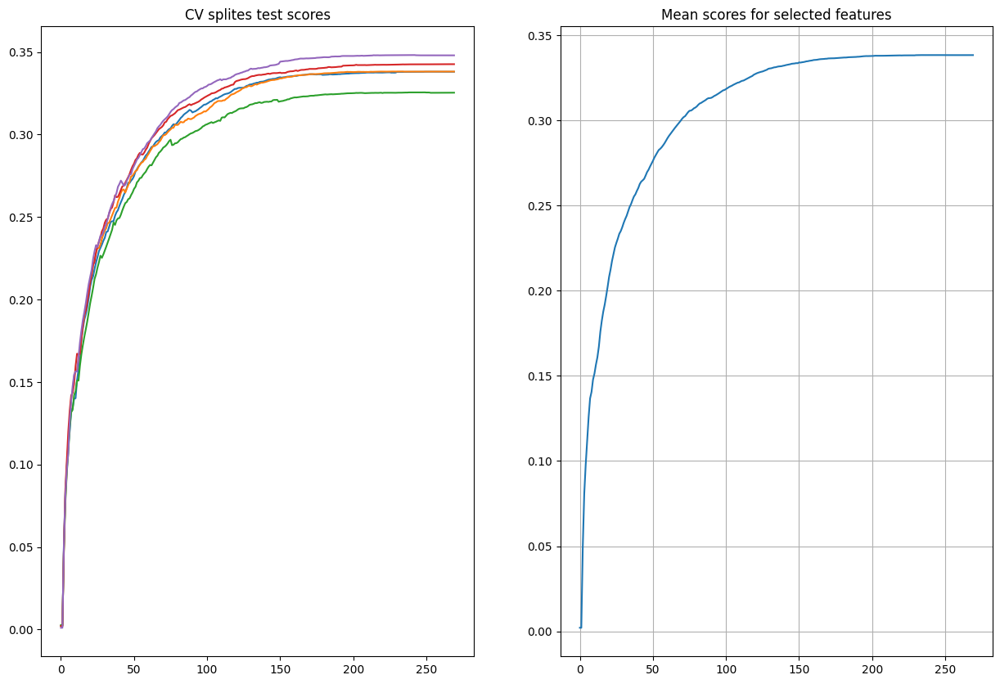

In [34]:
n_feature = rfecv.n_features_ 
cv_results_scores_mean = rfecv.cv_results_['mean_test_score'] 
 
print(n_feature, "features selected") 
print("\n////////Scores means for selected features///////////") 
print(cv_results_scores_mean) 
print("\n////////Test scores for 5 splites (cv=5)///////////") 
print(rfecv.cv_results_['split0_test_score']) 
print(rfecv.cv_results_['split1_test_score']) 
print(rfecv.cv_results_['split2_test_score']) 
print(rfecv.cv_results_['split3_test_score']) 
print(rfecv.cv_results_['split4_test_score']) 
 
fig, ax = plt.subplots(1, 2, figsize=(15, 10)) 
plt.grid(True) 
for i in range(5): 
    ax[0].plot( rfecv.cv_results_['split' + str(i) + '_test_score']) 
    ax[0].set_title('CV splites test scores') 
 
ax[1].plot(cv_results_scores_mean)  
ax[1].set_title('Mean scores for selected features') 
plt.show() 

### E5.4 **PCA**

#### E5.1.1 Etablir le min de composants (axes PCA) 

In [18]:

sel = VarianceThreshold(threshold= .01)
sel.fit(X_train)
sel.fit(X_test)

X_train_var = sel.transform(X_train)
X_test_var = sel.transform(X_test)

mask = sel.get_support()
#display(mask)
print(len(mask))


8100


##### E5.1.1.1 sur X_train not scaled avec seuil = 0.9

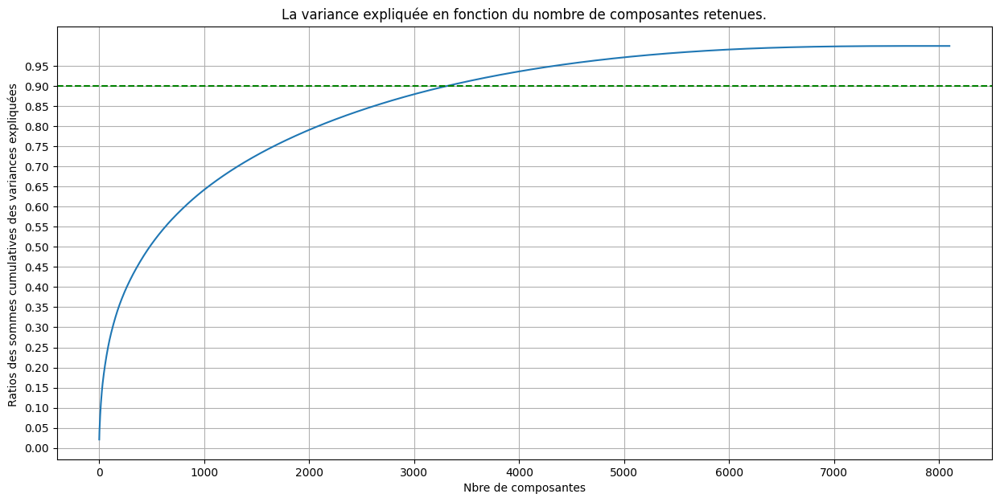

In [19]:
pca = PCA()

# définir le set train en appliquant la PCA
X_train_pca = pca.fit_transform(X_train)

# Obtenir les explications des rations des variances et réalsier une somme cumulative
var_ratios = pca.explained_variance_ratio_
var_ratios_cum = var_ratios.cumsum()

#display(var_ratios_cum)

# graph
fig, ax = plt.subplots(1,1, figsize=(15, 7))
sns.lineplot(x=range(0, len(var_ratios_cum)), y=var_ratios_cum, ax=ax)
# on vise un min de .9
plt.axhline(y = 0.9, color ='g', linestyle = '--')
ax.grid(True)
ax.set_yticks(np.arange(0, 1, 0.05))
ax.set_title('La variance expliquée en fonction du nombre de composantes retenues.')
ax.set_xlabel('Nbre de composantes')
ax.set_ylabel('Ratios des sommes cumulatives des variances expliquées ')

plt.show()


>   - (a) Définir X_train_pca et X_test_pca en fonction du nombre de composantes retenues

In [20]:
# set n_composnantes value to correspond to the previous result for a threshold of 90% 
n_composnantes = 3500
print(f"Un minimum de {n_composnantes} pour le # de composantes après réduction de dimensions PCA donnant un pourcentage de réduction de :", 
      100-round(100*n_composnantes/df.shape[1],0), "%")
print("Un minimum de 270 variables explicatives est nécessaire pour atteindre le plancher de 50% !")


# tracer la distrubution des variables issues de la PCA avec n_components = 850
pca = PCA(n_components= n_composnantes)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

display(X_train_pca)
print(X_train_pca.shape)

Un minimum de 3500 pour le # de composantes après réduction de dimensions PCA donnant un pourcentage de réduction de : 57.0 %
Un minimum de 270 variables explicatives est nécessaire pour atteindre le plancher de 50% !


NameError: name 'X_train' is not defined

> - (b) graphe des points sur les 2 1ers axes des composantes

Un minimum de 3500 pour le # de composantes après réduction de dimensions PCA donnant un pourcentage de réduction de : 57.0 %
Un minimum de 100 variables explicatives est nécessaire pour atteindre le plancher de 50% !


array([[ 5.85497764e-01,  4.81634219e-02,  1.49975418e-02, ...,
        -1.12820716e-03, -5.52192999e-04, -7.98058353e-04],
       [-3.36286066e-02, -2.10452643e-02, -5.78416004e-03, ...,
         5.75408365e-04, -6.15012437e-04, -7.97416590e-04],
       [-4.86855291e-02, -3.85443489e-02, -2.55935730e-02, ...,
         1.26615429e-02,  1.73308108e-02,  2.01258079e-03],
       ...,
       [-3.29499006e-02, -2.03876242e-02, -5.43076154e-03, ...,
        -2.70784682e-03, -1.12998782e-03,  1.12352872e-02],
       [-4.31217761e-02, -3.23961077e-02, -2.15425781e-02, ...,
        -3.16306410e-03,  9.01936168e-04,  3.46073305e-04],
       [ 5.14359747e-01,  3.91149321e-02,  1.31283918e-02, ...,
        -4.78553073e-04, -1.05901323e-03, -9.44473361e-04]])

(65812, 3500)


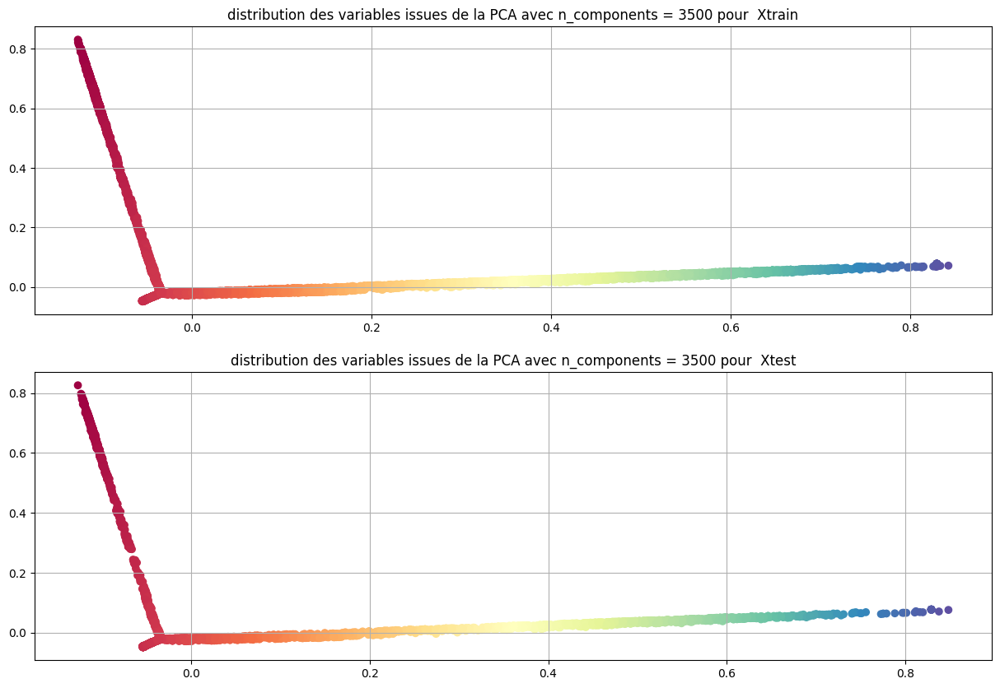

In [20]:


fig, ax = plt.subplots(2,1, figsize=(15,10))
ax[0].scatter(x=X_train_pca[:,0], y=X_train_pca[:,1], c=X_train_pca[:,0], cmap=plt.cm.Spectral )
ax[0].grid(True)
ax[0].set_title("distribution des variables issues de la PCA avec n_components = " + str(n_composnantes) + " pour  Xtrain")

ax[1].scatter(x=X_test_pca[:,0], y=X_test_pca[:,1], c=X_test_pca[:,0], cmap=plt.cm.Spectral )
ax[1].grid(True)
ax[1].set_title("distribution des variables issues de la PCA avec n_components = " + str(n_composnantes) + " pour  Xtest")

plt.show()



##### E5.1.1.2 sur X_train_scaled **scaled**

In [7]:
X_train_scaled, X_test_scaled, y_train, y_test = get_train_test_split(X=X, y=target, test_size=.2, random_state=0, scale=True)
print(type(X_train_scaled), type(X_test_scaled))
print(type(y_train), type(y_test))

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'>


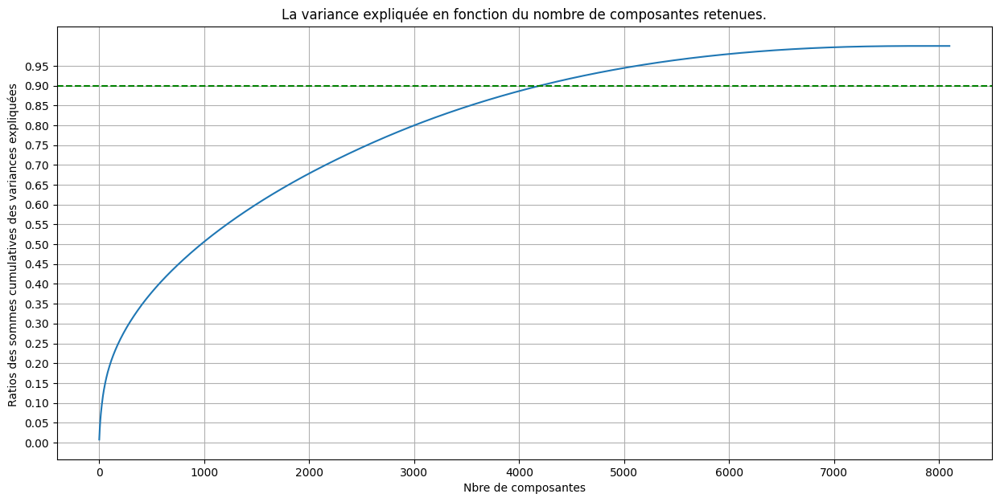

In [19]:
pca = PCA()

# définir le set train en appliquant la PCA
X_train_scaled_pca = pca.fit_transform(X_train_scaled)

# Obtenir les explications des rations des variances et réalsier une somme cumulative
var_ratios = pca.explained_variance_ratio_
var_ratios_cum = var_ratios.cumsum()

#display(var_ratios_cum)

# graph
fig, ax = plt.subplots(1,1, figsize=(15, 7))
sns.lineplot(x=range(0, len(var_ratios_cum)), y=var_ratios_cum, ax=ax)
# on vise un min de .9
plt.axhline(y = 0.9, color ='g', linestyle = '--')
ax.grid(True)
ax.set_yticks(np.arange(0, 1, 0.05))
ax.set_title('La variance expliquée en fonction du nombre de composantes retenues.')
ax.set_xlabel('Nbre de composantes')
ax.set_ylabel('Ratios des sommes cumulatives des variances expliquées ')

plt.show()


> graphe des points sur les 2 1ers axes des composantes

>   - (a) Définir **X_train_scaled_pca** et **X_test_scaled_pca** en fonction du nombre de composantes retenues

In [10]:
min_n_composantes = 4300
min_n_comp_per = 100-round(100*min_n_composantes/df.shape[1],0)
print(f"Un minimume de {min_n_composantes} pour le nbre de composantes après réduction de dimensions PCA donnant un pourcentage de réduction de\
      {min_n_comp_per} %")
print(f"Un minimum de {.5*df.shape[1]} variables explicatives est nécessaire pour atteindre le plancher de 50% !")

n_composnantes = min_n_composantes

# Réaliser la PCA avec le nbre retenu de composantes 
pca = PCA(n_components= n_composnantes)
X_train_scaled_pca = pca.fit_transform(X_train_scaled)
X_test_scaled_pca = pca.transform(X_test_scaled)

Un minimume de 4300 pour le nbre de composantes après réduction de dimensions PCA donnant un pourcentage de réduction de      47.0 %
Un minimum de 4051.0 variables explicatives est nécessaire pour atteindre le plancher de 50% !


MemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64


MemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64


MemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64


MemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64


MemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64


MemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64


MemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64


MemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64

Exception ignored in: 'scipy.linalg._decomp_lu_cython.lu_decompose'
Traceback (most recent call last):
  File "d:\Python312\Lib\site-packages\scipy\linalg\_decomp_lu.py", line 313, in lu
    lu_dispatcher(a1, u, p, permute_l)
numpy.core._exceptions._ArrayMemoryError: Unable to allocate 266. MiB for an array with shape (8100, 4310) and data type float64


MemoryError: Unable to allocate 2.11 GiB for an array with shape (65812, 4310) and data type float64

>   - (a) Réaliser le graphe des 2 premières composantes de **X_train_scaled_pca** & **X_test_scaled_pca**

Un minimume de 4300 pour le nbre de composantes après réduction de dimensions PCA donnant un pourcentage de réduction de      47.0 %
Un minimum de 4051.0 variables explicatives est nécessaire pour atteindre le plancher de 50% !


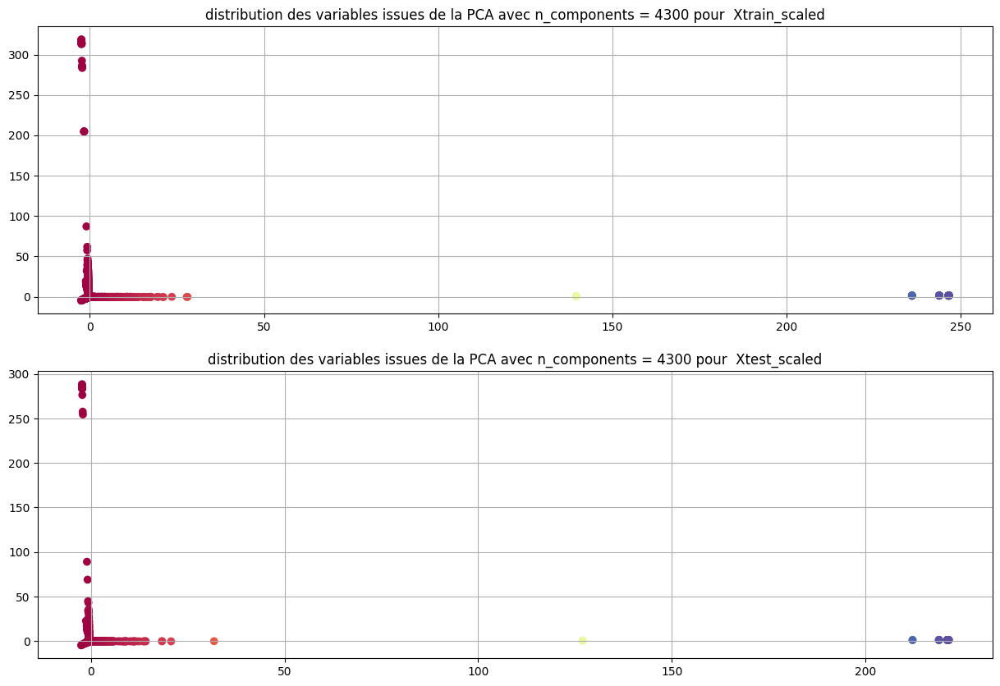

In [28]:

# tracer la distrubution des variables issues de la PCA avec n_components
fig, ax = plt.subplots(2,1, figsize=(15,10))
ax[0].scatter(x=X_train_scaled_pca[:,0], y=X_train_scaled_pca[:,1], c=X_train_scaled_pca[:,0], cmap=plt.cm.Spectral )
ax[0].grid(True)
ax[0].set_title("distribution des variables issues de la PCA avec n_components = " + str(n_composnantes) + " pour  Xtrain_scaled")

ax[1].scatter(x=X_test_scaled_pca[:,0], y=X_test_scaled_pca[:,1], c=X_test_scaled_pca[:,0], cmap=plt.cm.Spectral )
ax[1].grid(True)
ax[1].set_title("distribution des variables issues de la PCA avec n_components = " + str(n_composnantes) + " pour  Xtest_scaled")

plt.show()


>Dans le cas de données PCA d'entraînement et de test normalisées, on constate une conecentration de la distribution des données (uniquement les 2 premières composantes). A voir si cela est le cas pour toutes les autres composantes dont le nombre reste trop important pour les illustrer via un sacatter ! 

### E5.1.2 Tests sur **X_train_pca** et **X_test_pca** & **X_train_scaled_pca, X_test_scaled_pca**

- Réaliser une modélisation **KNN** avec les **ensembles normalisés**

In [22]:
print(f"Test avec un nombre de composantes PCA : {n_composnantes} sur un total de features de {data_cleaned.shape[0]}---------")

estim_params = { 'estimator_name' : 'KNN_PCA ', 'estimator': neighbors.KNeighborsClassifier() , 
                'params' : {'n_neighbors': [10]} }


# set this variable if PCA scaled or not scaled train/test
scaled_pca = True 
if scaled_pca == False:
    # Redéfinir df pour le faire correspondre au features de la PCA
    X_pca = pd.concat([pd.DataFrame(X_train_pca, columns=pca.get_feature_names_out()), 
                        pd.DataFrame(X_test_pca, columns=pca.get_feature_names_out())], axis=0)
    y_pca = pd.concat([pd.DataFrame(y_train, columns=['prdtypecode']), 
                        pd.DataFrame(y_test, columns=['prdtypecode'])], axis=0)
    # reset index in order to merge (indexes not corresponding one to one)
    X_pca.reset_index(inplace=True, drop=True)
    y_pca.reset_index(inplace=True, drop=True)
    df_pca = pd.concat([X_pca, y_pca], axis=1)
    
    print("test d'hyper-paramètres de modélisation pour PCA avec données non normalisées :")
    model_tuned, best_cv_results, best_estimator  = execute_tuned_models(df_pca, False, X_train=X_train_pca, X_test=X_test_pca, 
                                                        y_train=y_train, y_test=y_test, target= target, cv=3,
                                                        estimator_name=estim_params['estimator_name'], 
                                                        estimator=estim_params['estimator'], params=estim_params['params'] )       
else:
    # Redéfinir df pour le faire correspondre au features de la PCA
    X_pca = pd.concat([pd.DataFrame(X_train_scaled_pca, columns=pca.get_feature_names_out()), 
                        pd.DataFrame(X_test_scaled_pca, columns=pca.get_feature_names_out())], axis=0)
    y_pca = pd.concat([pd.DataFrame(y_train, columns=['prdtypecode']), 
                        pd.DataFrame(y_test, columns=['prdtypecode'])], axis=0)
    X_pca.reset_index(inplace=True, drop=True)
    y_pca.reset_index(inplace=True, drop=True)
    df_pca = pd.concat([X_pca, y_pca], axis=1)

    print("test d'hyper-paramètres de modélisation pour PCA avec données normalisées :")
    model_tuned, best_cv_results, best_estimator  = execute_tuned_models(df_pca, False, X_train=X_train_scaled_pca, X_test=X_test_scaled_pca, 
                                                        y_train=y_train, y_test=y_test, target= target, cv=3,
                                                        estimator_name=estim_params['estimator_name'], 
                                                        estimator=estim_params['estimator'], params=estim_params['params'] )    
    
get_df_basic_elements( model_tuned, infos_types=['shape', 'head', 'info'], actions=['print'])
print("BEST RESULT:")
display(best_cv_results)

Test avec un nombre de composantes PCA : 4300 sur un total de features de 82265---------
test d'hyper-paramètres de modélisation pour PCA avec données normalisées :
df.shape : (82265, 4301)


array([[-2.62446596e-01, -2.29047562e-01, -3.06230269e-01, ...,
         9.24096819e-02, -2.13038212e-01,  6.71970900e-02],
       [-2.71431462e-01, -2.37907462e-01, -3.18549171e-01, ...,
        -3.52854277e-01, -1.34071660e+00, -1.27375073e-01],
       [-3.31279742e-01, -3.07784730e-01, -4.46370871e-01, ...,
         7.47695197e-01, -1.18399924e+00,  8.88835401e-01],
       ...,
       [-3.11478018e-01, -2.83659700e-01, -4.00029534e-01, ...,
         4.00183049e-01, -1.35429742e+00, -2.16084392e-01],
       [-3.27747534e-01, -3.22340001e-01,  2.97744484e+00, ...,
        -7.42329023e-01,  3.08459175e-01, -8.52879145e-02],
       [-2.66683930e-01, -2.34016692e-01, -3.15634166e-01, ...,
        -1.30628101e-01,  1.65823292e-04, -1.88757497e-03]])


-----------------------------------------------------------------------
X_train.shape - X_test.shape - len(y_train) - len(y_test)
(65812, 4300) - (16453, 4300) - 65812 - 16453

-----------------------------------------------------------------------
                                0
name                     KNN_PCA 
estimator  KNeighborsClassifier()
params      {'n_neighbors': [10]}
-----------------------------------------------------------------------

Fitting 3 folds for each of 1 candidates, totalling 3 fits


d:\Python312\Lib\site-packages\sklearn\neighbors\_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
d:\Python312\Lib\site-packages\sklearn\neighbors\_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


train_r2_score =  0.9065519965963654
test_r2_score = 0.9008083632164346
type(X_train), type(X_test) =
 <class 'numpy.ndarray'> , <class 'numpy.ndarray'>


AttributeError: 'numpy.ndarray' object has no attribute 'columns'

#### Tests de prédiction

In [40]:
# afficher la matrice de confusion associée au modèle traité
y_test_pred = best_estimator.predict(X_test_scaled_pca)

display(y_test)
display(y_test_pred)

pd.crosstab(np.asarray (y_test.values), y_test_pred)



,prdtypecode
30318,1320
11659,1160
4162,40
31544,1320
14653,1180
...,...
33042,1320
45411,2060
35213,1560
42551,1940


array([1320, 1160,   40, ..., 1560, 2060, 1560])

ValueError: All arrays must be of the same length

In [68]:
print(X_test_scaled_pca.shape)

pca_features_out = pca.get_feature_names_out()
pca_features_in = pca.feature_names_in_
pca_features_in_out = {'pca_features_in': pca_features_in, 'pca_features_out': pca_features_out}

pca_features_map = pd.DataFrame.from_dict(pca_features_in_out, orient='index')
pca_features_map = pca_features_map[range(0, n_composnantes)]
display(pca_features_map.head())


(16453, 4300)


0       1         2           3        4     5     \
pca_features_in   actes  action  advances  adventures  afrique   age   
pca_features_out   pca0    pca1      pca2        pca3     pca4  pca5   

                      6         7     8         9      10         11    \
pca_features_in   allemand  american  amis  ammareal  amour  américain   
pca_features_out      pca6      pca7  pca8      pca9  pca10      pca11   

                     12        13      14       15     16            17    \
pca_features_in   analyse  analysis  ancien  ancient  annee  applications   
pca_features_out    pca12     pca13   pca14    pca15  pca16         pca17   

                       18            19     20     21     22           23    \
pca_features_in   apprendre  architecture  arrêt    art   arts  association   
pca_features_out      pca18         pca19  pca20  pca21  pca22        pca23   

                                24     25     26         27     28     29    \
pca_features_in   associationsltbrgt  atlas  audio  aventures   best  bible   
pca_features_out               pca24  pca25  pca26      pca27  pca28  pca29   

                          30            31             32       33    \
pca_features_in   bibliotheque  bibliothèque  bibliothèques  bonheur   
pca_features_out         pca30         pca31          pca32    pca33   

                      34        35        36        37      38       39    \
pca_features_in   bordeaux  building  bulletin  business  cahier  cahiers   
pca_features_out     pca34     pca35     pca36     pca37   pca38    pca39   

                    40           41                 42         43       44    \
pca_features_in   canada  caritatives  caritativesltbrgt  catalogue  century   
pca_features_out   pca40        pca41              pca42      pca43    pca44   

                     45     46       47       48        49         50    \
pca_features_in   chambre  chant  charles  chemins  children  christmas   
pca_features_out    pca45  pca46    pca47    pca48     pca49      pca50   

                        51     52      53     54           55    \
pca_features_in   chroniques   ciel  classe  coeur  commentaire   
pca_features_out       pca51  pca52   pca53  pca54        pca55   

                           56           57        58       59            60    \
pca_features_in   communication  composition  concours  conseil  construction   
pca_features_out          pca56        pca57     pca58    pca59         pca60   

                    61       62     63     64     65          66       67    \
pca_features_in   contes  control  corps   cour  cours  couverture  cuisine   
pca_features_out   pca61    pca62  pca63  pca64  pca65       pca66    pca67   

                   68     69     70     71      72           73     74    \
pca_features_in    dame   days  death    del  design  development  diary   
pca_features_out  pca68  pca69  pca70  pca71   pca72        pca73  pca74   

                        75            76     77         78        79     80    \
pca_features_in   dictionary  dictionnaire   dieu  direction  discours  droit   
pca_features_out       pca75         pca76  pca77      pca78     pca79  pca80   

                     81         82      83     84      85       86      87    \
pca_features_in   editeur  education  eglise    eme  empire  enfance  enfant   
pca_features_out    pca81      pca82   pca83  pca84   pca85    pca86   pca87   

                     88           89       90            91      92     93    \
pca_features_in   enfants  engineering  english  enseignement  esprit  essai   
pca_features_out    pca88        pca89    pca90         pca91   pca92  pca93   

                   94      95     96         97          98       99    \
pca_features_in    etat  europe  every  exercices  exposition  famille   
pca_features_out  pca94   pca95  pca96      pca97       pca98    pca99   

                    100     101     102     103      104     105     106   \
pca_features_in 

In [96]:
print( np.isin(pca_features_map.iloc[0, :], 'actes') )

mask = np.isin( pca_features_map.iloc[0, :], mots)
print(mask)
print(type(pca_features_map))


[ True False False ... False False False]
[False False False ... False False False]
<class 'pandas.core.frame.DataFrame'>


In [21]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)

'''
# reconstituer le dataset en combinant le train, le tast et le target
if scaled_pca == False:
    # Redéfinir df pour le faire correspondre au features de la PCA
    X_pca = pd.concat([pd.DataFrame(X_train_pca, columns=pca.get_feature_names_out()), 
                        pd.DataFrame(X_test_pca, columns=pca.get_feature_names_out())], axis=0)
    y_pca = pd.concat([pd.DataFrame(y_train, columns=['prdtypecode']), 
                        pd.DataFrame(y_test, columns=['prdtypecode'])], axis=0)
    # reset index in order to merge (indexes not corresponding one to one)
    X_pca.reset_index(inplace=True, drop=True)
    y_pca.reset_index(inplace=True, drop=True)
    df_pca = pd.concat([X_pca, y_pca], axis=1)   
else:
    # Redéfinir df pour le faire correspondre au features de la PCA
    X_pca = pd.concat([pd.DataFrame(X_train_scaled_pca, columns=pca.get_feature_names_out()), 
                        pd.DataFrame(X_test_scaled_pca, columns=pca.get_feature_names_out())], axis=0)
    y_pca = pd.concat([pd.DataFrame(y_train, columns=['prdtypecode']), 
                        pd.DataFrame(y_test, columns=['prdtypecode'])], axis=0)
    X_pca.reset_index(inplace=True, drop=True)
    y_pca.reset_index(inplace=True, drop=True)
    df_pca = pd.concat([X_pca, y_pca], axis=1)
'''


# TEST #1
# A. Vectorize and transform to Dataframe
my_text_list = []
my_text_list.extend(["Présentation Couette Chaude 600gr / M² 140x200cm Lavable Ultra Gonflant Douceur Extrême - Couette", 
"Plongez dans le monde mystérieux et palpitant des livres policiers avec Rakuten, votre marketplace privilégiée. Nous avons en effet, pour vous amateurs de suspense et d'intrigue, une sélection impressionnante de romans policiers passionnants, aussi variés que captivants. La catégorie des livres policiers sur notre boutique en ligne est diversifiée afin de satisfaire tous les goûts et tous les lecteurs.Que vous préfériez les thrillers psychologiques, les romans à énigmes, les polars noirs ou les enquêtes de détective, vous n'aurez que l'embarras du choix sur Rakuten.Nos collections comprennent des livres de tous les sous-genres du roman policier pour vous garantir des heures d'évasion et de frisson. Les nouvelles sorties, les best-sellers,les classiques du genre, Rakuten les a tous. Des œuvres incontournables de Sir Arthur Conan Doyle, créateur du légendaire Sherlock Holmes, aux thrillers haletants d'Agatha Christie,reine incontestée du crime. Sans oublier les romans de Mary Higgins Clark et Patricia Cornwell, sans parler des contemporains comme Jo Nesbo et Harlan Coben. Notre sélection comprendégalement une myriade d'auteurs talentueux moins connus, mais tout aussi captivants. Rakuten, c'est aussi l'opportunité d'acheter des livres neufs ou d'occasion. Vous êtes donc sûr detrouver le livre de vos rêves, quels que soient votre budget et vos préférences. Chaque livre d'occasion vendu sur notre site est soigneusement vérifié pour vous assurer une expérience de lecture agréable. Rakuten est le lieu de rencontre par excellence pour tous ceux qui aiment les livres et le mystère. Nous nous engageons à vous offrir une plateforme fiable et pratique pour acheter vos livres policiers préférés. Avec Rakuten, plongez dans un univers de suspense et de mystère, offrez-vous une évasion littéraire, le livre parfait n'est qu'à un clic de distance.Parce que chez Rakuten, chaque histoire compte, et chaque histoire a sa place. ",
"abricant : Habitat et jardin  Type de produit : Abri de jardin Matière : Bois Abri de jardin bois 9.4 m²  Lys  - 28 mm : Découvrez l'abri de jardin en épicéa d 'europe du nord en 28 mm  Lys , idéal pour vos espaces extérieurs. Avec ses dimensions de 320 x 298 x 225 cm, cet abri offre un espace généreux pour ranger vos outils et équipements de jardin. Doté d'une porte double avec fenêtre, il combine praticité et esthétique. Fabriqué en Europe, cet abri garantit qualité et durabilité. Ajoutez une touche de charme et de fonctionnalité à votre jardin avec l'abri  Lys . : Abri de jardin en bois Lys. Plancher : Non. Type de montage : Principe d'assemblage par emboitement. Surface intérieure (m²) : 7,42m2. Surface extérieure (m²) : 9,53m2. Intérieures : 272 x 272 cm. Extérieures : 320 x 298 cm. Hors tout : 7,42m2. Hauteur des murs : 184 cm. Hauteur faîtage : 440 cm. Dimensions : 143 x 174 cm. Type : Double. Fenêtre : Oui. Vitrage : Verre de 4 mm. Épaisseur : 28 mm. Origine : Europe. Épaisseur des panneaux de particules / des voliges : OSB de 12 mm. Type de toiture : Panneaux OSB / toitures en feutre bitumineux. : Double porte avec fenêtres intégrées Structure en madriers. Conseils pratiques : Abris à placer sur dalle de béton pour assurer la stabilité structurelle. Les dimensions recommandées de la dalle sont de 310 x 310cm. - Surface à teindre 28 m² - Fournir un traitement fongicide pour chaque pièce avant le montage et l'application de la teinture hydrofuge et résistante aux UV à l'intérieur et à l'extérieur de l'abri. Le feutre bitumineux fourni est une couverture de base temporaire. . Colisage : 1 colis : - 3 x 0,48 x 1,2 m, 450 kg.",
"Console Sony PlayStation 5 Slim Edition Standard Découvrez la nouvelle Console Sony PlayStation 5 Slim Edition Standard. Conçue par Sony, cette console de salon est parfaite pour les amateurs de jeux vidéo recherchant une expérience de jeu de haute qualité.  Fabricant : Sony Gamme de Produits : Sony PlayStation Capacité de stockage : 1 To Couleur : Blanc Poids : 3200 g EAN : 4948872415934 Disponible à partir du : 8 novembre 2023 Offrant une capacité de stockage de 1 To, la PlayStation 5 Slim Edition Standard vous permet de télécharger et de sauvegarder une multitude de jeux. Son design élégant et compact en blanc s'intégrera facilement dans votre espace de vie.  Ne manquez pas l'occasion de vivre une expérience de jeu immersive et puissante avec la PlayStation 5 Slim Edition Standard, la console iconique qui continue de redéfinir les standards du jeu vidéo.",
"Canapé 3/4 places beige sable. Fabricant : Maisons du monde. Type de produit : Canapé. Si vous rêvez d'un salon contemporain et confortable, le canapé 3/4 places beige sable LILO est fait pour vous !Ce canapé est un produit volumineux. Assurez-vous qu'il est adapté au passage des portes de votre intérieur (dimensions du colis: 242x104x77 cm)On adore son look original, associé à un coloris sobre qui trouvera facilement sa place dans votre intérieur.Tout en tissu et robuste, ce canapé sera la pièce maîtresse de votre salon. L'assise moelleuse de ce canapé beige vous enveloppera pour de délicieux moments de détente.A vous les soirées tout confort !Découvrez nos conseils pour bien choisir votre canapé.",
"Proscenic 850T - Aspirateur Robot Laveur de Sol connecté 2 en 1 - Aspiration puissante 3000Pa - Débit d'eau Réglable - Autonomie 110 min - Navigation Gyroscope - Contrôle avec Alexa/App/Siri. Aspirateur robot laveur 2 en 1 – Aspiration et lavage – 3000 Pa – Détection du Tapis – 110 min d'autonomie  – Bande magnétique – Contrôle avec Alexa/App/Siri/IFTT",
"Brandt BPI6315B - Table de cuisson à induction - 3 plaques de cuisson - Niche - largeur : 56 cm - profondeur : 49 cm - noir. Fabricant : Brandt Référence fabricant : BPI6315B Type de produit : Plaque de cuisson Energie : Induction Couleur : Noir Nb foyers table de cuisson : 3 - Foyer de 28cm Avec son foyer de 28cm auto-adaptable et sa puissance maximum de 3600W, toutes les cuissons sont possibles, du mijotage le plus doux aux fritures les plus vives.  - Minuterie Votre table vous offre 3 minuteries de 1 à 99 minutes avec arrêt automatique.C'est la garantie du juste temps de cuisson et de réussite pour toutes les préparations.  - Sécurité 10 points Sécurité intégrale : anti-surchauffe, anti-débordement, témoins de chaleur résiduelle, verrouillage du clavier, automatique-stop, détection des récipients, des petits objets,de la faible intensité du survoltage et d'une mauvaise connexion.  Les + produit  UNE EXPERTISE AVANT-GARDISTE  L'induction : Le meilleur de la cuisson Brandt a développé et lancé la technologie de l'induction à la fin des années 1980 et a bouleversé le marché des plaques de cuisson puisque, aujourd'hui, l'induction représente près de 60 % des ventes en valeur (Source GFK).  Une répartition optimale de la chaleur dans la casserole Brandt a doté ses inducteurs d'une technologie exclusive qui rend la cuisson parfaitement homogène sur toute la surface du récipient. L'eau bout uniformément dans la casserole.  L'ALLIANCE DE L'EFFICACITÉ ET DU CONFORT Efficacité et précision du résultat de cuisson Les touches sensitives de notre plaque induction et les différentes allures de chauffe vous permettent de réaliser vos plats avec la même efficacité et précision que les professionnels. Pour gagner en rapidité, la fonction Booster vous permet d’accéder directement à la puissance maximale.  Pour une cuisson maîtrisée Les tables induction Brandt sont dotées d’une minuterie par foyer pour programmer la durée de cuisson et couper automatiquement le foyer à la fin du temps imparti sans surveillance.  UNE SÉCURITÉ SANS FAILLES LE PACK 10 SÉCURITÉS Toutes nos plaques induction disposent du pack 10 sécurités et vous assurent une cuisine sereine et sans danger pour passer des moments de pur plaisir.  Ce pack comprend :  - L’indicateur de chaleur résiduelle pour vous éviter de toucher les zones encore chaudes (après une utilisation intensive). - La sécurité « petits objets » qui permet de ne pas chauffer un objet de petite dimension (cuillère, bague...). - La protection en cas de débordement qui éteint automatiquement la table - L’Auto-Stop system qui coupe automatiquement une zone de cuisson que vous avez oublié d’éteindre. - Le verrouillage clavier possible à l’arrêt ou en cours de cuisson. - La détection automatique de casseroles. - L’anti-surchauffe récipient : cette sécurité brevetée et exclusive limite la température sous le foyer à 300 °C. Elle permet de réguler la chaleur d’un récipient vide pour ne pas le détériorer. Elle évite par exemple tout risque d’auto-inflammation de l’huile. - La détection faible voltage, mauvaise connexion et surtension.     Caractéristiques techniques     Caractéristiques techniques principales  Type de table Induction Largeur en cm 60 Type d'énergie Electricité   Les foyers  Nombre de foyers 3 Position de l'élément chauffant Avant Gauche Position de l'élément chauffant N°2 Arrière Gauche Position de l'élément chauffant N°3 Centre Droit Type d'élément chauffant Induction Type d'élément chauffant foyer N°2 Induction Type d'élément chauffant foyer N°3 Induction Dimension de l'élément chauffant (mm) 180 Dimension de l'élément chauffant en mm du foyer N°2 160 Dimension de l'élément chauffant en mm du foyer N°3 280 Puissance maximum de l'élément chauffant en W 2800 Puissance maximum de l'élément chauffant en Wdu foyer N°2 2000 Puissance maximum de l'élément chauffant en w du foyer N°3 3600 Minuterie Electronique 99 min Minuterie sur foyer N°2 Electronique 99 min Minuterie sur foyer N°3 Electronique 99 min   Commandes  Type de commandes Touches Type de régulation d'énergie Electronique Minuterie Oui   Branchements Electriques  Puissance maxi électrique en kW 7.2 Intensité en A 32 Tension en V 220-240 Fréquence en Hz 50/60 Longueur du cordon en cm 130 Type de prise électrique Sans   Sécurités  Témoin de mise sous tension Oui Témoin de chaleur Résiduelle Individuel Verrouillage centralisé 1 Touche centralisée Arrêt d'urgence Pack 10 sécurités Détection de récipients Oui   Dimensions  Dimensions du produit emballé en mm 140X750X600 Dimensions d'encastrement en mm 560X490 Dimensions hors tout HxLxP au dessus du plan de travail en mm 4X580X510 Dimensions hors tout HxLxP au dessous du plan de travail en mm 56X558X488 Poids net en kg 10.1 Poids brut en kg 11 Description table induction : 3 foyers dont 1 zone ø 28 cm 3,6 kw 9 niveaux de puissance 3 minuteries 10 niveaux de sécurité : anti-surchauffe, verrouillage, clavier, auto-stop, anti-débordement, témoins de chaleur résiduelle, détection de récipients, détection de petits ustensiles, détection faible voltage, détection mauvaise connexion et détection surtension Commandes sensitives Barette avant inox sérigraphiée.  Caractéristiques : 3 foyer(s) : droit ø 28 cm 3,6 kW / gauche avant ø 18 cm 2,8 kW / gauche arrière ø 16 cm 2 kW bandeau : frontal commandes : sensitives puissance de raccordement : 7200 w alimentation : 220-240 V / 50 Hz / 32 A connecté : non disponibilité des pièces détachées : 10 ans (donnée constructeur) cordon électrique : fourni (130 cm) sans fiche coloris table : noir bordure : profil avant inox dimensions hors tout (lxhxp) : 58 x 5,9 x 51 cm dimensions encastrement (lxhxp) : 56 x 5,5 x 49 cmpoids net : 10,1 kg lieu de fabrication : origine France Avec son foyer de 28 cm auto-adaptable et sa puissance maximum de 3600 W, toutes les cuissons sont possibles, du mijotage le plus doux aux fritures les plus vives.  Garantie du juste temps de cuisson et de réussite pour toutes les préparations Sécurité intégrale: anti-surchauffe, anti-débordement, témoins de chaleur résiduelle, verrouillage du clavier, automatique-stop, détection des récipients, des petits objets,de la faible intensité du survoltage et d'une mauvaise connexion  Informations complémentaires BRANDT Plaque induction BPI6315B",
"Astérix aux Jeux Olympiques - Édition 2 DVD. Réalisateur : Frédéric Forestier Editeur : Pathé Parution : 22/08/2008 Nombre de DVD/VHS : 2 Classification : Fantastique - Péplum - Comédie Saga : Astérix Acteurs : Gérard Depardieu - Clovis Cornillac - Benoît Poelvoorde - Alain Delon - Vanessa Hessler - Franck Dubosc - José Garcia - Stéphane Rousseau - Jean-Pierre Cassel - Élie Semoun - Alexandre Astier Synopsis: Nous sommes en 50 avant Jésus-Christ, toute la Gaule est occupée par les romains... Toute ? Non ! Pour ces nouvelles aventures, nos irréductibles gaulois ont fait le déplacement jusqu'en Grèce pour participer aux Jeux Olympiques. Une occasion de plus pour Astérix et Obélix de mettre une bonne raclée aux romains. Mais le machiavélique Brutus, fils de César, a plus d'un tour dans son sac... il va y avoir du sport !  Bonus : DVD 1 : - Galerie de photos - Teasers - Bandes-annonces  DVD 2 : - Making of (90') - AvéTV, la télé de l'empire - Les sportifs (10') - Avant-première - Bêtisier - Galerie des personnages (30')   Descriptif technique Astérix Aux Jeux Olympiques - Édition 2 Dvd de Frédéric Forestier - DVD Zone 2 Oeuvre Nationalité de l'oeuvre	France Année de sortie en salles	2007 Public	Tous Couleur	Couleur Durée de la vidéo	112 Support Type de support	DVD Zone 2 Zone	Zone 2 Format d'image	2.35 Format vidéo	16/9 Langues Audio Dolby Digital	Français 5.1 Langues Audio DTS	Français 5.1 Sous-titres malentendants	Français"
])

#df_pca = pd.concat([pd.DataFrame(X_train_scaled_pca, columns=pca.get_feature_names_out()), 
#                    pd.DataFrame(X_test_scaled_pca, columns=pca.get_feature_names_out())], axis=0)
display(df_pca.head())
df_pca =df_pca.drop('prdtypecode', axis=1)
get_predictions(best_estimator, df_pca, my_text_list, drop_categories=False)


pca0      pca1      pca2      pca3      pca4      pca5      pca6  \
0 -0.262447 -0.229048 -0.306230 -0.169993 -0.148093 -0.659941 -0.393128   
1 -0.271431 -0.237907 -0.318549 -0.176782 -0.154004 -0.685165 -0.407337   
2 -0.331280 -0.307785 -0.446371 -0.250672 -0.218545 -1.005332 -0.612116   
3 -0.266377 -0.235790 -0.346829 -0.204982 -0.179674 -0.203945 -0.309578   
4 -0.267369 -0.234543 -0.315933 -0.175589 -0.152980 -0.684153 -0.408674   

       pca7      pca8      pca9     pca10     pca11     pca12     pca13  \
0 -0.351249 -0.196838 -0.041611 -0.175914 -0.045189 -0.117672 -0.628959   
1 -0.361791 -0.197718 -0.040535 -0.149683 -0.022926  0.201770 -1.025014   
2 -0.568021 -0.338620 -0.073078 -0.293918 -0.047800  0.437991 -2.421805   
3 -0.310275 -0.177294 -0.036739 -0.137580 -0.021291  0.188897 -0.980788   
4 -0.367213 -0.208953 -0.044794 -0.198576 -0.057121 -0.249568 -0.526919   

      pca14     pca15     pca16     pca17     pca18     pca19      pca20  \
0 -0.301687 -0.018761 -0.041057 -0.223946 -0.070874 -0.168380  -0.272559   
1 -0.376519 -0.023232 -0.050810 -0.274891 -0.086307 -0.204662  -0.328767   
2 -1.399866 -0.098426 -0.218133 -1.539642 -0.918903 -2.917883  15.528607   
3  0.441377 -0.010101 -0.023497 -0.182056 -0.063257 -0.151781  -0.249913   
4 -0.301114 -0.018845 -0.041263 -0.226863 -0.072498 -0.172669  -0.282214   

      pca21     pca22     pca23     pca24     pca25     pca26     pca27  \
0 -0.164981 -0.019454  0.149819  0.124844 -0.728045 -0.403649  0.430197   
1 -0.196741 -0.023054  0.175941  0.144616 -0.801900 -0.385294 -0.239113   
2  1.722603  0.154433 -0.936169 -0.627818  2.555767  0.984877  0.508555   
3 -0.151100 -0.017743  0.135638  0.111627 -0.619722 -0.297828 -0.184778   
4 -0.172820 -0.020490  0.158917  0.133730 -0.804719 -0.479408  0.864237   

      pca28     pca29     pca30     pca31     pca32     pca33     pca34  \
0  0.072020  0.010793 -0.017988 -0.057515 -0.042372  0.042362 -0.736152   
1  0.178397  0.015676 -0.025004 -0.079878 -0.058425  0.057337 -0.991557   
2 -0.346091 -0.022146  0.027976  0.088673  0.059996 -0.037729  0.332187   
3  0.137816  0.012087 -0.019240 -0.061460 -0.044918  0.043868 -0.753793   
4  0.026370  0.009998 -0.017336 -0.055474 -0.041149  0.041979 -0.736861   

      pca35     pca36     pca37     pca38     pca39     pca40     pca41  \
0 -0.065114  0.074868 -0.001036 -0.376684 -0.030158 -0.083027 -0.378388   
1 -0.088405  0.101747 -0.001414 -0.516264 -0.042017 -0.116528 -0.537080   
2 -0.337686 -3.501532  0.000787  0.126354 -0.014491 -0.061039 -0.425624   
3 -0.065376  0.074970 -0.407561 -0.389677 -0.030420 -0.083366 -0.377154   
4 -0.065879  0.075770 -0.001049 -0.381678 -0.030489 -0.083713 -0.379106   

      pca42     pca43     pca44     pca45     pca46     pca47     pca48  \
0  0.177456  0.082069 -0.046466 -0.443021  0.146020  0.008179 -0.040205   
1  0.253635  0.117806 -0.066817 -0.659525  0.225648  0.019416 -0.023627   
2  0.245321  0.127305 -0.075385 -1.473212  0.797382  0.174072 -0.339125   
3  0.175970  0.081100 -0.045850 -0.422079  0.134015  0.292391 -0.013856   
4  0.176827  0.081449 -0.046033 -0.414846  0.123288 -0.007032 -0.116208   

      pca49     pca50     pca51     pca52     pca53     pca54     pca55  \
0 -0.215019  0.038936  0.326008  0.174962 -0.022909 -0.432539 -0.062198   
1 -0.234451  0.048117  0.438907  0.249121 -0.032860 -0.631743 -0.092809   
2 -5.648515  4.159113 -8.581198 -1.373614  0.155585  2.095086  0.218717   
3 -0.120502  0.021470  0.099493  0.758611 -0.060191 -0.761410 -0.107647   
4 -0.396304  0.060133  0.432392  0.208620 -0.026970 -0.494267 -0.068646   

      pca56     pca57     pca58     pca59     pca60     pca61     pca62  \
0 -0.190720  0.125099  0.016314 -0.260862  0.337808 -0.185448  0.041404   
1 -0.285309  0.189565  0.028338 -0.378015  0.494965 -0.290701  0.065246   
2  0.650877 -0.378858 -0.044449  0.515412 -0.658517  0.244394 -0.052231   
3 -0.343567 -0.310729  0.020712 -0.284493  0.373151 -0.218549  0.049067   
4 -0.209526  0.133

8 texts to be predicted:


d:\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


La prédiction pour mon texte 
Présentation Couette Chaude 600gr / M² 140x200cm Lavable Ultra Gonflant Douceur Extrême - Couette
est la catégorie :
Equipement pour piscine


d:\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


La prédiction pour mon texte 
Plongez dans le monde mystérieux et palpitant des livres policiers avec Rakuten, votre marketplace privilégiée. Nous avons en effet, pour vous amateurs de suspense et d'intrigue, une sélection impressionnante de romans policiers passionnants, aussi variés que captivants. La catégorie des livres policiers sur notre boutique en ligne est diversifiée afin de satisfaire tous les goûts et tous les lecteurs.Que vous préfériez les thrillers psychologiques, les romans à énigmes, les polars noirs ou les enquêtes de détective, vous n'aurez que l'embarras du choix sur Rakuten.Nos collections comprennent des livres de tous les sous-genres du roman policier pour vous garantir des heures d'évasion et de frisson. Les nouvelles sorties, les best-sellers,les classiques du genre, Rakuten les a tous. Des œuvres incontournables de Sir Arthur Conan Doyle, créateur du légendaire Sherlock Holmes, aux thrillers haletants d'Agatha Christie,reine incontestée du crime. Sans oublier 

d:\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


KeyboardInterrupt: 

### E5.1.3 Effectuer un test de prédiction sur le meilleur modèle avec PCA

In [102]:
def stop_words_filtering(liste = list()):
    stop_words = set(stopwords.words('french'))
    ret_liste = []
    if len(liste)>0:
        for w in liste:
            if w in list(stop_words):
                print ("remove", w)
            else:
                ret_liste.append(w)
                
    return ret_liste

def get_pca_features_map(words_list = list()):
    '''
       Obtenir la liste des features PCA qui correspondent à la liste des mots dans words_list 
    '''
    pca_features_list = []
    pca_features_in_line = pca_features_map.iloc[0, :]
    pca_features_out_line = pca_features_map.iloc[1, :]
    print(type(pca_features_in_line))
    if len(words_list) > 0:
        mask = np.isin( pca_features_map.iloc[0, :], words_list)
        pca_features_map.loc['mask'] = mask
                
    return pca_features_map
        

my_text ="Je souhaite acheter un cadeau pour l'anniversaire de ma fille comme une poupée, un jouet manuel ou un jeu de console par exemple."

to_ignore = set(get_excluded_words(f'{data_root_folder}/config/excluded_words.txt')[0])
my_stopwords = set(STOPWORDS).union(to_ignore).union(stopwords.words('french')).union(stopwords.words('english')).union(stopwords.words('german'))
final_stopwords_list =  list(my_stopwords)
vect = TfidfVectorizer()



#vect = CountVectorizer(lowercase=True, stop_words=final_stopwords_list, preprocessor=preprocessor_func)


# Tokenize words
tokenzer = PunktSentenceTokenizer()
tokens = tokenzer.tokenize(my_text)
#display(tokens)
mots = word_tokenize(tokens[0], language='french')
#display(mots)
mots = stop_words_filtering(mots)
display("Liste des mots après suppression des stop words:")
print(mots)

trans = vect.fit_transform(mots)


print(trans)
print(trans.toarray())
print(vect.vocabulary_)
for k,v in vect.vocabulary_.items():
    print(f'{k}: {v}')


pca_features_map = get_pca_features_map(mots)
display(pca_features_map)
#pca_test_set = pd.DataFrame( columns= pca_features_map['pca_features_out'])


# prediction
#model_tuned.predict(trans)


ValueError: Iterable over raw text documents expected, string object received.

## E6. **Naive Bayes** pour un modèle multi-classes

### E6.1 Appliqué directement au dataset sans transformation matricielle

In [70]:
X, target = data_cleaned['desi_desc'], data_cleaned['prdtypecode']

X_train, X_test, y_train, y_test  = get_train_test_split(X=X, y=target, test_size=.2, random_state=0, scale=False)

print("X_train.shape", X_train.shape)
display(X_train)
print("-------------------------------------------------")
print("X_test.shape", X_test.shape)
display(X_test)

vect = CountVectorizer()
# get extracted tokens
X_train_vectorized = vect.fit_transform(X_train)
X_test_vectorized = vect.transform(X_test)
# get corresponding vocabulary
vocab = vect.vocabulary_

print("Vocabulary :-----------------------------------")
print(len(vocab), "mots")

X_train.shape (65812,)


77033                                             you days
54209                             cassette recharge blanco
19852                             action man mission tokyo
39964    bâche bulles bordée ubbink bâche bulle piscine...
68850                                         mémoire arts
                               ...                        
21561                        colis complémentaire wave tri
47024    filtre huile moteur fcv tondeuse gazon john de...
43629                    séduction tentation norah lucilla
44611    leurres cuillère appâts pêche tackle métal leu...
70289    chemins école réforme école porte réformes cha...
Name: desi_desc, Length: 65812, dtype: object

-------------------------------------------------
X_test.shape (16453,)


30891    jésus dictionnaire historique évangiles histor...
11771    haie artificielle campovert rouleau haie artif...
4178     pack spa rond gonflable silver cloud places an...
32162    drapeau table saint david xcm drapeaux bureau ...
14820                                           homme yeux
                               ...                        
33719    pignon tondeuse gazon greatland tondeuse gazon...
46523    lampe led lumineux illusion optique bureau vei...
35962    lampe led lumineux illusion optique bureau vei...
43564                                 religieuse obscurité
36286    univers fevrier rupert rome feuilleton nouvell...
Name: desi_desc, Length: 16453, dtype: object

Vocabulary :-----------------------------------
132662 mots


### E6.2 **MultinominalNM** classifier

2024/09/14 20:09:40 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'fe7074dd368145f087c96843a8da90b0', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024/09/14 20:09:40 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: Unable to allocate 65.0 GiB for an array with shape (65812, 132662) and data type int64
d:\Python312\Lib\site-packages\sklearn\metrics\_classification.py:2922: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
  warnings.warn(
2024/09/14 20:09:47 WARNING mlflow.sklearn: Failed to log evaluation dataset information to MLflow Tracking. Reason: Unable to allocate 16.3 GiB for an array with shape (2182687886,) and data type int64


Score : 0.72
============================CONFUSION MATRIX=======================================
Confusion matrix as graph with Seaborn :


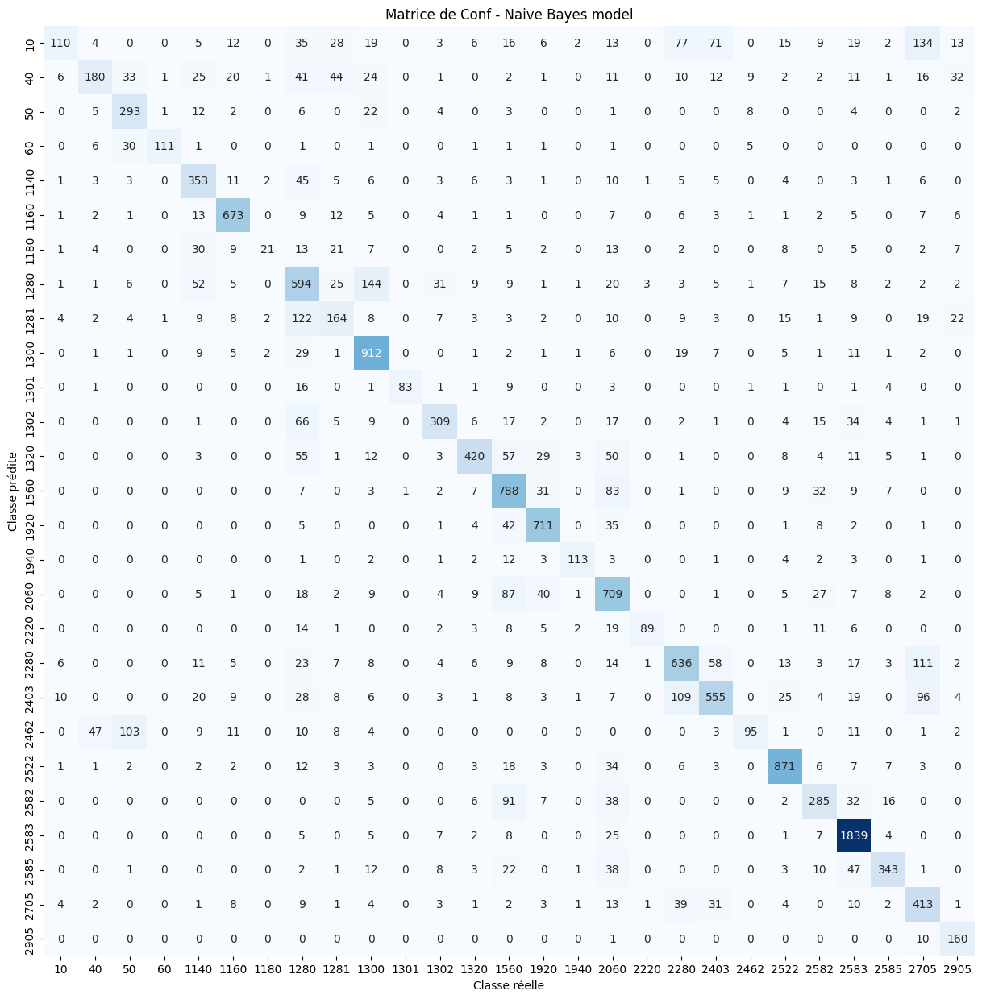

In [71]:
naive_bayes_model = MultinomialNB()
naive_bayes_model.fit(X_train_vectorized, y_train)
y_pred = naive_bayes_model.predict(X_test_vectorized)

print(f'Score : {round(naive_bayes_model.score(X_test_vectorized, y_test), 2)}')

#display(pd.DataFrame(y_pred))
#display(pd.DataFrame(y_test))

get_conf_matrix(y_test=y_test, y_pred=y_pred, xlabel='Classe réelle', ylabel='Classe prédite',
                target=target, title='Matrice de Conf - Naive Bayes model')


### E6.3 **ComplementNB** classifier (plus approprié pour les dataset désiquilibrés)
(https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.ComplementNB.html#sklearn.naive_bayes.ComplementNB)

>Les scores ne dépassent pas 72% peu importe les valaurs de alpha !

2024/09/14 20:11:32 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '34a6359db221487e89a97cf8215efde9', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024/09/14 20:11:32 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: Unable to allocate 65.0 GiB for an array with shape (65812, 132662) and data type int64



alpha = 1 -------------------------------------------------------------------------


d:\Python312\Lib\site-packages\sklearn\metrics\_classification.py:2922: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
  warnings.warn(
2024/09/14 20:11:38 WARNING mlflow.sklearn: Failed to log evaluation dataset information to MLflow Tracking. Reason: Unable to allocate 16.3 GiB for an array with shape (2182687886,) and data type int64


Score : 0.72
============================CONFUSION MATRIX=======================================
Confusion matrix as graph with Seaborn :


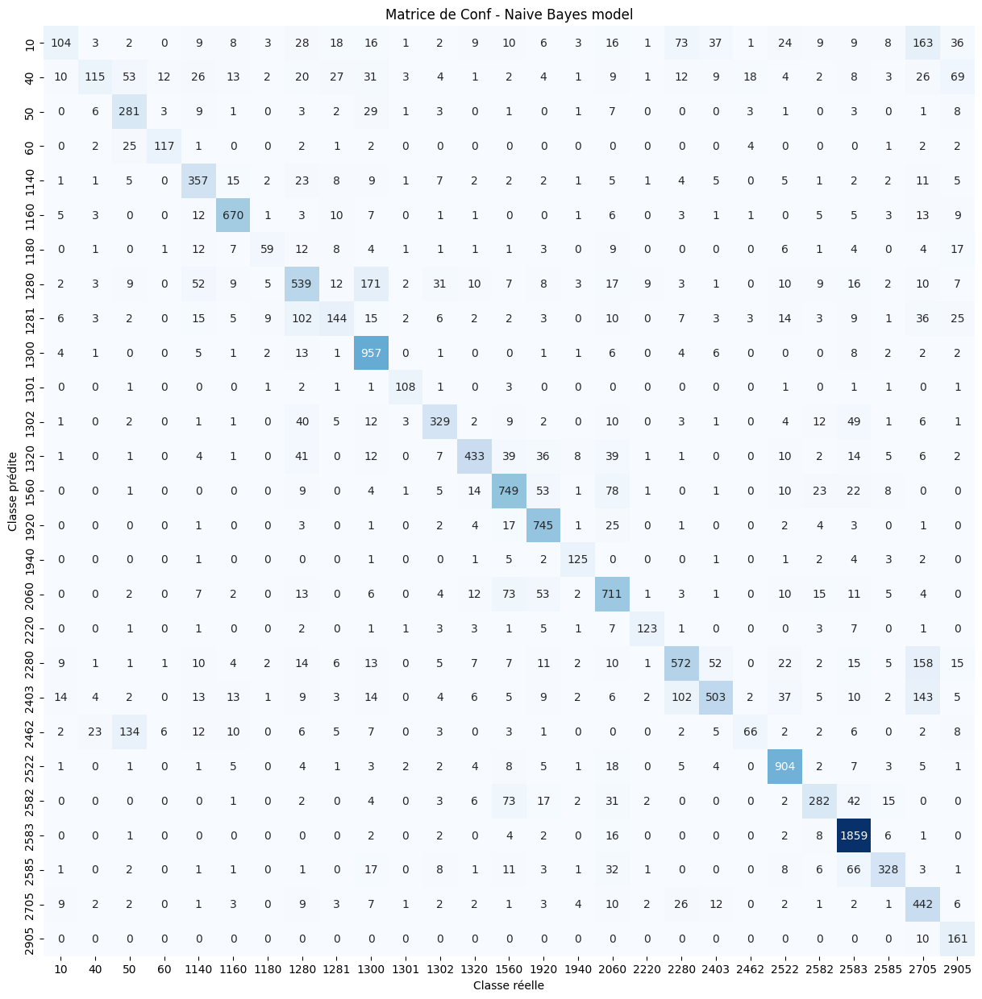

In [73]:
for alpha in range(1,2):     #alpha in np.arange(.0001, .5, .0002):
    print(f"\nalpha = {alpha} -------------------------------------------------------------------------")
    naive_bayes_model = ComplementNB(alpha=alpha)
    naive_bayes_model.fit(X_train_vectorized, y_train)
    y_pred = naive_bayes_model.predict(X_test_vectorized)

    print(f'Score : {round(naive_bayes_model.score(X_test_vectorized, y_test), 2)}')

    #display(pd.DataFrame(y_pred))
    #display(pd.DataFrame(y_test))

    get_conf_matrix(y_test=y_test, y_pred=y_pred, xlabel='Classe réelle', ylabel='Classe prédite',
                    target=target, title='Matrice de Conf - Naive Bayes model')

### E6.3 Effectuer un test de prédiction

In [94]:
my_text ="Je souhaite acheter un cadeau pour l'anniversaire de ma fille comme une poupée, un jouet manuel ou un jeu de console par exemple."

my_category_pred = naive_bayes_model.predict(vect.transform([my_text]))

cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{my_text}\nest la catégorie :\n{cat_desc}")

print("----------------------------------------------------------------------------------------------")

text_from_rakuten = "Plongez dans le monde mystérieux et palpitant des livres policiers avec Rakuten, votre marketplace privilégiée. Nous avons en effet, pour vous amateurs de suspense et d'intrigue, une sélection impressionnante de romans policiers passionnants, aussi variés que captivants. La catégorie des livres policiers sur notre boutique en ligne est diversifiée afin de satisfaire tous les goûts et tous les lecteurs. Que vous préfériez les thrillers psychologiques, les romans à énigmes, les polars noirs ou les enquêtes de détective, vous n'aurez que l'embarras du choix sur Rakuten. Nos collections comprennent des livres de tous les sous-genres du roman policier pour vous garantir des heures d'évasion et de frisson. Les nouvelles sorties, les best-sellers, les classiques du genre, Rakuten les a tous. Des œuvres incontournables de Sir Arthur Conan Doyle, créateur du légendaire Sherlock Holmes, aux thrillers haletants d'Agatha Christie, reine incontestée du crime. Sans oublier les romans de Mary Higgins Clark et Patricia Cornwell, sans parler des contemporains comme Jo Nesbo et Harlan Coben. Notre sélection comprend également une myriade d'auteurs talentueux moins connus, mais tout aussi captivants. Rakuten, c'est aussi l'opportunité d'acheter des livres neufs ou d'occasion. Vous êtes donc sûr de trouver le livre de vos rêves, quels que soient votre budget et vos préférences. Chaque livre d'occasion vendu sur notre site est soigneusement vérifié pour vous assurer une expérience de lecture agréable. Rakuten est le lieu de rencontre par excellence pour tous ceux qui aiment les livres et le mystère. Nous nous engageons à vous offrir une plateforme fiable et pratique pour acheter vos livres policiers préférés. Avec Rakuten, plongez dans un univers de suspense et de mystère, offrez-vous une évasion littéraire, le livre parfait n'est qu'à un clic de distance. Parce que chez Rakuten, chaque histoire compte, et chaque histoire a sa place. "

my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))

cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("----------------------------------------------------------------------------------------------")

text_from_rakuten = "Présentation Couette Chaude 600gr / M² 140x200cm Lavable Ultra Gonflant Douceur Extrême - Couette"

my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))

cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("Ces 1ers tests simples semblent concluants et conformes à leur réalité !")


print("----------------------------------------------------------------------------------------------")

text_from_rakuten = "abricant : Habitat et jardin  Type de produit : Abri de jardin Matière : Bois Abri de jardin bois 9.4 m²  Lys  - 28 mm : Découvrez l'abri de jardin en épicéa d 'europe du nord en 28 mm  Lys , idéal pour vos espaces extérieurs. Avec ses dimensions de 320 x 298 x 225 cm, cet abri offre un espace généreux pour ranger vos outils et équipements de jardin. Doté d'une porte double avec fenêtre, il combine praticité et esthétique. Fabriqué en Europe, cet abri garantit qualité et durabilité. Ajoutez une touche de charme et de fonctionnalité à votre jardin avec l'abri  Lys . : Abri de jardin en bois Lys. Plancher : Non. Type de montage : Principe d'assemblage par emboitement. Surface intérieure (m²) : 7,42m2. Surface extérieure (m²) : 9,53m2. Intérieures : 272 x 272 cm. Extérieures : 320 x 298 cm. Hors tout : 7,42m2. Hauteur des murs : 184 cm. Hauteur faîtage : 440 cm. Dimensions : 143 x 174 cm. Type : Double. Fenêtre : Oui. Vitrage : Verre de 4 mm. Épaisseur : 28 mm. Origine : Europe. Épaisseur des panneaux de particules / des voliges : OSB de 12 mm. Type de toiture : Panneaux OSB / toitures en feutre bitumineux. : Double porte avec fenêtres intégrées Structure en madriers. Conseils pratiques : Abris à placer sur dalle de béton pour assurer la stabilité structurelle. Les dimensions recommandées de la dalle sont de 310 x 310cm. - Surface à teindre 28 m² - Fournir un traitement fongicide pour chaque pièce avant le montage et l'application de la teinture hydrofuge et résistante aux UV à l'intérieur et à l'extérieur de l'abri. Le feutre bitumineux fourni est une couverture de base temporaire. . Colisage : 1 colis : - 3 x 0,48 x 1,2 m, 450 kg."

my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))

cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("Ces 1ers tests simples semblent concluants et conformes à leur réalité !")


print("----------------------------------------------------------------------------------------------")

text_from_rakuten ="Console Sony PlayStation 5 Slim Edition Standard Découvrez la nouvelle Console Sony PlayStation 5 Slim Edition Standard. Conçue par Sony, cette console de salon est parfaite pour les amateurs de jeux vidéo recherchant une expérience de jeu de haute qualité.  Fabricant : Sony Gamme de Produits : Sony PlayStation Capacité de stockage : 1 To Couleur : Blanc Poids : 3200 g EAN : 4948872415934 Disponible à partir du : 8 novembre 2023 Offrant une capacité de stockage de 1 To, la PlayStation 5 Slim Edition Standard vous permet de télécharger et de sauvegarder une multitude de jeux. Son design élégant et compact en blanc s'intégrera facilement dans votre espace de vie.  Ne manquez pas l'occasion de vivre une expérience de jeu immersive et puissante avec la PlayStation 5 Slim Edition Standard, la console iconique qui continue de redéfinir les standards du jeu vidéo."

my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))

cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("Ces 1ers tests simples semblent concluants et conformes à leur réalité !")


print("----------------------------------------------------------------------------------------------")

text_from_rakuten ="Canapé 3/4 places beige sable. Fabricant : Maisons du monde. Type de produit : Canapé. Si vous rêvez d'un salon contemporain et confortable, le canapé 3/4 places beige sable LILO est fait pour vous !Ce canapé est un produit volumineux. Assurez-vous qu'il est adapté au passage des portes de votre intérieur (dimensions du colis: 242x104x77 cm)On adore son look original, associé à un coloris sobre qui trouvera facilement sa place dans votre intérieur.Tout en tissu et robuste, ce canapé sera la pièce maîtresse de votre salon. L'assise moelleuse de ce canapé beige vous enveloppera pour de délicieux moments de détente.A vous les soirées tout confort !Découvrez nos conseils pour bien choisir votre canapé."
my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))

cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("Ces 1ers tests simples semblent concluants et conformes à leur réalité !")


print("----------------------------------------------------------------------------------------------")

text_from_rakuten ="Brandt BPI6315B - Table de cuisson à induction - 3 plaques de cuisson - Niche - largeur : 56 cm - profondeur : 49 cm - noir. Fabricant : Brandt Référence fabricant : BPI6315B Type de produit : Plaque de cuisson Energie : Induction Couleur : Noir Nb foyers table de cuisson : 3 - Foyer de 28cm Avec son foyer de 28cm auto-adaptable et sa puissance maximum de 3600W, toutes les cuissons sont possibles, du mijotage le plus doux aux fritures les plus vives.  - Minuterie Votre table vous offre 3 minuteries de 1 à 99 minutes avec arrêt automatique.C'est la garantie du juste temps de cuisson et de réussite pour toutes les préparations.  - Sécurité 10 points Sécurité intégrale : anti-surchauffe, anti-débordement, témoins de chaleur résiduelle, verrouillage du clavier, automatique-stop, détection des récipients, des petits objets,de la faible intensité du survoltage et d'une mauvaise connexion.  Les + produit  UNE EXPERTISE AVANT-GARDISTE  L'induction : Le meilleur de la cuisson Brandt a développé et lancé la technologie de l'induction à la fin des années 1980 et a bouleversé le marché des plaques de cuisson puisque, aujourd'hui, l'induction représente près de 60 % des ventes en valeur (Source GFK).  Une répartition optimale de la chaleur dans la casserole Brandt a doté ses inducteurs d'une technologie exclusive qui rend la cuisson parfaitement homogène sur toute la surface du récipient. L'eau bout uniformément dans la casserole.  L'ALLIANCE DE L'EFFICACITÉ ET DU CONFORT Efficacité et précision du résultat de cuisson Les touches sensitives de notre plaque induction et les différentes allures de chauffe vous permettent de réaliser vos plats avec la même efficacité et précision que les professionnels. Pour gagner en rapidité, la fonction Booster vous permet d’accéder directement à la puissance maximale.  Pour une cuisson maîtrisée Les tables induction Brandt sont dotées d’une minuterie par foyer pour programmer la durée de cuisson et couper automatiquement le foyer à la fin du temps imparti sans surveillance.  UNE SÉCURITÉ SANS FAILLES LE PACK 10 SÉCURITÉS Toutes nos plaques induction disposent du pack 10 sécurités et vous assurent une cuisine sereine et sans danger pour passer des moments de pur plaisir.  Ce pack comprend :  - L’indicateur de chaleur résiduelle pour vous éviter de toucher les zones encore chaudes (après une utilisation intensive). - La sécurité « petits objets » qui permet de ne pas chauffer un objet de petite dimension (cuillère, bague...). - La protection en cas de débordement qui éteint automatiquement la table - L’Auto-Stop system qui coupe automatiquement une zone de cuisson que vous avez oublié d’éteindre. - Le verrouillage clavier possible à l’arrêt ou en cours de cuisson. - La détection automatique de casseroles. - L’anti-surchauffe récipient : cette sécurité brevetée et exclusive limite la température sous le foyer à 300 °C. Elle permet de réguler la chaleur d’un récipient vide pour ne pas le détériorer. Elle évite par exemple tout risque d’auto-inflammation de l’huile. - La détection faible voltage, mauvaise connexion et surtension.     Caractéristiques techniques     Caractéristiques techniques principales  Type de table Induction Largeur en cm 60 Type d'énergie Electricité   Les foyers  Nombre de foyers 3 Position de l'élément chauffant Avant Gauche Position de l'élément chauffant N°2 Arrière Gauche Position de l'élément chauffant N°3 Centre Droit Type d'élément chauffant Induction Type d'élément chauffant foyer N°2 Induction Type d'élément chauffant foyer N°3 Induction Dimension de l'élément chauffant (mm) 180 Dimension de l'élément chauffant en mm du foyer N°2 160 Dimension de l'élément chauffant en mm du foyer N°3 280 Puissance maximum de l'élément chauffant en W 2800 Puissance maximum de l'élément chauffant en Wdu foyer N°2 2000 Puissance maximum de l'élément chauffant en w du foyer N°3 3600 Minuterie Electronique 99 min Minuterie sur foyer N°2 Electronique 99 min Minuterie sur foyer N°3 Electronique 99 min   Commandes  Type de commandes Touches Type de régulation d'énergie Electronique Minuterie Oui   Branchements Electriques  Puissance maxi électrique en kW 7.2 Intensité en A 32 Tension en V 220-240 Fréquence en Hz 50/60 Longueur du cordon en cm 130 Type de prise électrique Sans   Sécurités  Témoin de mise sous tension Oui Témoin de chaleur Résiduelle Individuel Verrouillage centralisé 1 Touche centralisée Arrêt d'urgence Pack 10 sécurités Détection de récipients Oui   Dimensions  Dimensions du produit emballé en mm 140X750X600 Dimensions d'encastrement en mm 560X490 Dimensions hors tout HxLxP au dessus du plan de travail en mm 4X580X510 Dimensions hors tout HxLxP au dessous du plan de travail en mm 56X558X488 Poids net en kg 10.1 Poids brut en kg 11 Description table induction : 3 foyers dont 1 zone ø 28 cm 3,6 kw 9 niveaux de puissance 3 minuteries 10 niveaux de sécurité : anti-surchauffe, verrouillage, clavier, auto-stop, anti-débordement, témoins de chaleur résiduelle, détection de récipients, détection de petits ustensiles, détection faible voltage, détection mauvaise connexion et détection surtension Commandes sensitives Barette avant inox sérigraphiée.  Caractéristiques : 3 foyer(s) : droit ø 28 cm 3,6 kW / gauche avant ø 18 cm 2,8 kW / gauche arrière ø 16 cm 2 kW bandeau : frontal commandes : sensitives puissance de raccordement : 7200 w alimentation : 220-240 V / 50 Hz / 32 A connecté : non disponibilité des pièces détachées : 10 ans (donnée constructeur) cordon électrique : fourni (130 cm) sans fiche coloris table : noir bordure : profil avant inox dimensions hors tout (lxhxp) : 58 x 5,9 x 51 cm dimensions encastrement (lxhxp) : 56 x 5,5 x 49 cmpoids net : 10,1 kg lieu de fabrication : origine France Avec son foyer de 28 cm auto-adaptable et sa puissance maximum de 3600 W, toutes les cuissons sont possibles, du mijotage le plus doux aux fritures les plus vives.  Garantie du juste temps de cuisson et de réussite pour toutes les préparations Sécurité intégrale: anti-surchauffe, anti-débordement, témoins de chaleur résiduelle, verrouillage du clavier, automatique-stop, détection des récipients, des petits objets,de la faible intensité du survoltage et d'une mauvaise connexion  Informations complémentaires BRANDT Plaque induction BPI6315B"
my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))
cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("Ces 1ers tests simples semblent concluants et conformes à leur réalité !")


print("----------------------------------------------------------------------------------------------")

text_from_rakuten = "Astérix aux Jeux Olympiques - Édition 2 DVD. Réalisateur : Frédéric Forestier Editeur : Pathé Parution : 22/08/2008 Nombre de DVD/VHS : 2 Classification : Fantastique - Péplum - Comédie Saga : Astérix Acteurs : Gérard Depardieu - Clovis Cornillac - Benoît Poelvoorde - Alain Delon - Vanessa Hessler - Franck Dubosc - José Garcia - Stéphane Rousseau - Jean-Pierre Cassel - Élie Semoun - Alexandre Astier Synopsis: Nous sommes en 50 avant Jésus-Christ, toute la Gaule est occupée par les romains... Toute ? Non ! Pour ces nouvelles aventures, nos irréductibles gaulois ont fait le déplacement jusqu'en Grèce pour participer aux Jeux Olympiques. Une occasion de plus pour Astérix et Obélix de mettre une bonne raclée aux romains. Mais le machiavélique Brutus, fils de César, a plus d'un tour dans son sac... il va y avoir du sport !  Bonus : DVD 1 : - Galerie de photos - Teasers - Bandes-annonces  DVD 2 : - Making of (90') - AvéTV, la télé de l'empire - Les sportifs (10') - Avant-première - Bêtisier - Galerie des personnages (30')   Descriptif technique Astérix Aux Jeux Olympiques - Édition 2 Dvd de Frédéric Forestier - DVD Zone 2 Oeuvre Nationalité de l'oeuvre	France Année de sortie en salles	2007 Public	Tous Couleur	Couleur Durée de la vidéo	112 Support Type de support	DVD Zone 2 Zone	Zone 2 Format d'image	2.35 Format vidéo	16/9 Langues Audio Dolby Digital	Français 5.1 Langues Audio DTS	Français 5.1 Sous-titres malentendants	Français"
my_category_pred = naive_bayes_model.predict(vect.transform([text_from_rakuten]))
cat_desc = get_prod_cateroy_description_from_code(my_category_pred[0])
print(f"La prédiction pour mon texte \n{text_from_rakuten}\nest la catégorie :\n{cat_desc}")

print("Ces 1ers tests simples semblent concluants et conformes à leur réalité !")



La prédiction pour mon texte 
Je souhaite acheter un cadeau pour l'anniversaire de ma fille comme une poupée, un jouet manuel ou un jeu de console par exemple.
est la catégorie :
Jeux & jouets pour enfants
----------------------------------------------------------------------------------------------
La prédiction pour mon texte 
Plongez dans le monde mystérieux et palpitant des livres policiers avec Rakuten, votre marketplace privilégiée. Nous avons en effet, pour vous amateurs de suspense et d'intrigue, une sélection impressionnante de romans policiers passionnants, aussi variés que captivants. La catégorie des livres policiers sur notre boutique en ligne est diversifiée afin de satisfaire tous les goûts et tous les lecteurs. Que vous préfériez les thrillers psychologiques, les romans à énigmes, les polars noirs ou les enquêtes de détective, vous n'aurez que l'embarras du choix sur Rakuten. Nos collections comprennent des livres de tous les sous-genres du roman policier pour vous gara